<img src="http://www.exalumnos.usm.cl/wp-content/uploads/2015/06/Isotipo-Negro.gif" title="Title text" width="20%" height="20%" />


<hr style="height:2px;border:none"/>
<h1 align='center'> INF-395/477 Redes Neuronales Artificiales I-2018 </h1>

<H3 align='center'> Tarea 1 - Redes Neuronales y *Deep Learning* </H3>
<hr style="height:2px;border:none"/>
La tarea se divide en secciones:

[1.](#primero) Red Neuronal *Feed Forward* para Detectar Exoplanetas  
[2.](#segundo) *Deep Networks*  
[3.](#tercero) Redes Convolucionales en Imágenes  
[4.](#cuarto) CNN *vs* RNN Prediciendo el Ozono Atmosférico

<a id="primero"></a>
## 1. Red Neuronal *Feed Forward* para Detectar Exoplanetas
---

Las Redes Neuronales Artificiales (ANN) son un tipo de modelo de aprendizaje que, con el suficiente número de capas, debiera poder aproximar cualquier función. Hoy en día se han aplicado a numerosos problemas, ya que tienen la ventaja de ser bastante dinámicas en su construcción y poder ser entrenadas con unicamente *backpropagation*, obteniendo un buen desempeño. Los modelos de aprendizaje son aplicados a diferentes ámbitos en donde, en algunos casos, automatizan extensivos procesos manuales de expertos, como lo que veremos a continuación.

<img src="https://www.cfa.harvard.edu/~avanderb/tutorial/HAT-P-3b.gif" title="YOLO" width="30%"/>

En esta sección trabajaremos con un dataset de astronomía, **Kepler KOI** [[1]](#refs), en el cual podrán experimentar con la detección de exoplanetas a través de *features* extraídas de las curvas de luz (tránsito de los planetas sobre su estrella madre) y metadatos de la observación (planeta, estrella y curvas de luz). Para más información sobre los metadatos visite el siguiente __[link](https://exoplanetarchive.ipac.caltech.edu/docs/API_kepcandidate_columns.html)__. La tarea es determinar si un posible candidato a exoplaneta (en base a una previa identificación/selección de eventos que sobrepasan un cierto *treshold*) corresponde efectivamente a un exoplaneta o no.

---
En primer lugar cargue todos los datos trabajados por [[2]](#refs), los cuales se encuentran adjuntados con el enunciado. Además separe en entrenamiento y pruebas.
```python
import pandas  as pd
import numpy as np
df_sets = pd.read_csv("./koi_sets_unb.csv")
mask_train = (df_sets["Set"] == "Train").values
mask_test = (df_sets["Set"] == "Test").values
df_labels = pd.read_csv("./koi_labels.csv")
df_X = pd.read_csv("./koi_light_curves_X.csv")
df_labels_train = df_labels[mask_train]
df_labels_test = df_labels[mask_test]
df_X_train = df_X[mask_train]
df_X_test = df_X[mask_test]
```

A continuación cree las matrices que trabajará y servirán para entrenar su modelo neuronal, la etiqueta binaria (0 o 1) y la matriz numérica de entrada, imputando el estadístico de la mediana sobre los valores nulos.
```python
y_train = ((df_labels_train["NExScI Disposition"]=="CONFIRMED")*1).values
y_test = ((df_labels_test["NExScI Disposition"]=="CONFIRMED")*1).values
df_X_train = df_X_train.reset_index(drop=True)
df_X_test = df_X_test.reset_index(drop=True)
df_X_train.fillna(df_X_train.median(), inplace=True)
df_X_test.fillna(df_X_test.median(), inplace=True)
X_train = df_X_train.values[:,1:]
X_test = df_X_test.values[:,1:]
```

In [0]:
import pandas  as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import StandardScaler
import random
from keras.models import Sequential
from keras.layers.core import Dense
from keras.optimizers import SGD, Adam, RMSprop, Adagrad, Adadelta
from sklearn.metrics import f1_score
from keras.layers import Activation
from keras.regularizers import l1,l2
import keras
from keras import backend as K
import tensorflow as tf
from keras.layers import LeakyReLU, PReLU, ELU, ThresholdedReLU
from keras.datasets import cifar10
from sklearn.model_selection import train_test_split
from keras.callbacks import TensorBoard
%load_ext tensorboard

Using TensorFlow backend.


The tensorboard module is not an IPython extension.


In [0]:
koi_labels='https://raw.githubusercontent.com/Diego-viveros/Adition-stuff/master/koi_labels.csv'
koi_light_curves='https://raw.githubusercontent.com/Diego-viveros/Adition-stuff/master/koi_light_curves_X.csv'
koi_sets_unb='https://raw.githubusercontent.com/Diego-viveros/Adition-stuff/master/koi_sets_unb.csv'
ozone='https://raw.githubusercontent.com/Diego-viveros/Adition-stuff/master/ozone_data.csv'


df_sets = pd.read_csv(koi_sets_unb)

mask_train = (df_sets["Set"] == "Train").values   #Casos de entrenamiento
mask_test = (df_sets["Set"] == "Test").values    #Casos de prueba

df_labels = pd.read_csv(koi_labels)      #Casos con label?

df_X = pd.read_csv(koi_light_curves)     #Casos a estudiar

df_labels_train = df_labels[mask_train]    #Se saca la info para entrenar del ser que tiene info
df_labels_test = df_labels[mask_test]     #Lo mismo para los test

df_X_train = df_X[mask_train]
df_X_test = df_X[mask_test]

y_train = ((df_labels_train["NExScI Disposition"]=="CONFIRMED")*1).values
y_test = ((df_labels_test["NExScI Disposition"]=="CONFIRMED")*1).values

df_X_train = df_X_train.reset_index(drop=True)
df_X_test = df_X_test.reset_index(drop=True)

df_X_train.fillna(df_X_train.median(), inplace=True)
df_X_test.fillna(df_X_test.median(), inplace=True)

X_train = df_X_train.values[:,1:]
X_test = df_X_test.values[:,1:]

print("La división de clases es " + str(y_train.sum()/y_train.size) + " 'Si', y " + str(1 -y_train.sum()/y_train.size) + " 'No'")
print("Mientras que en el conjunto de prueba es " + str(y_test.sum()/y_test.size) + " 'Si', y " + str(1-y_test.sum()/y_test.size) + " 'No'")

La división de clases es 0.37851662404092073 'Si', y 0.6214833759590792 'No'
Mientras que en el conjunto de prueba es 0.3226837060702875 'Si', y 0.6773162939297125 'No'


>  a) Explore los datos trabajados, ya sea con estadísticos simples o con gráficos como histogramas y/o boxplots. Comente sobre el problema enfrentado, es decir, la tarea de transformar un vector $X$ en un valor categórico (0 o 1).
```python
columns_names = df_X_train.columns[1:]
print(columns_names)
print(X_train.shape)
print(X_test.shape)
df_X_train.describe()
```

KOI Name                       K01009.01K07621.01K06252.01K04162.01K00998.01K...
Minimum                                                                  -311984
Maximum                                                                   112550
Mean                                                                    -668.225
Std                                                                      19410.1
IQR                                                                      1562.95
Skew                                                                      -44042
Kurtosis                                                                  991937
Q1                                                                      -496.191
Q2                                                                        84.352
Slope                                                                0.000696224
Amplitude                                                                 212267
MAD                         

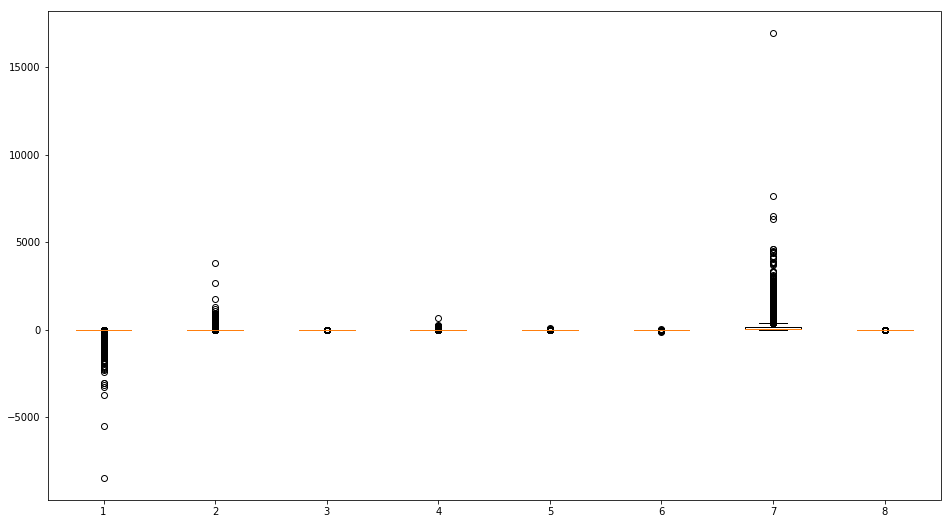

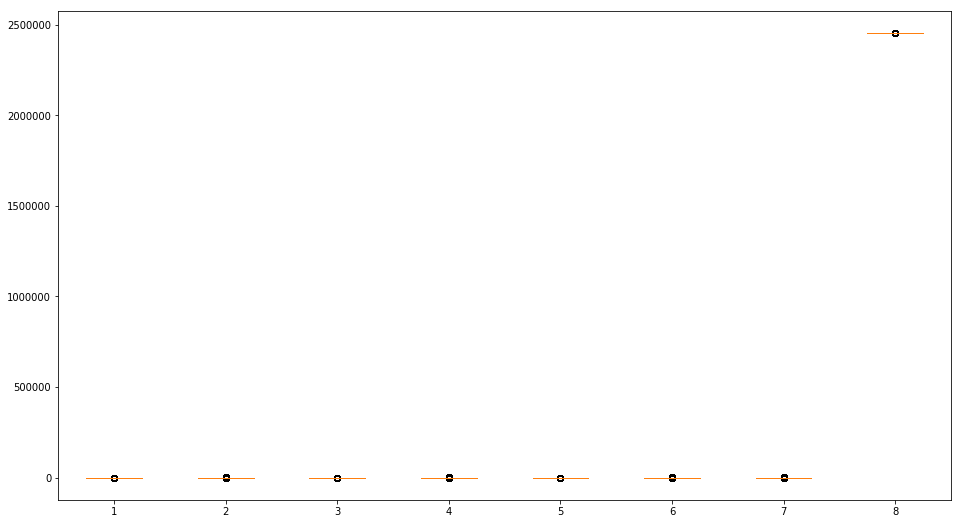

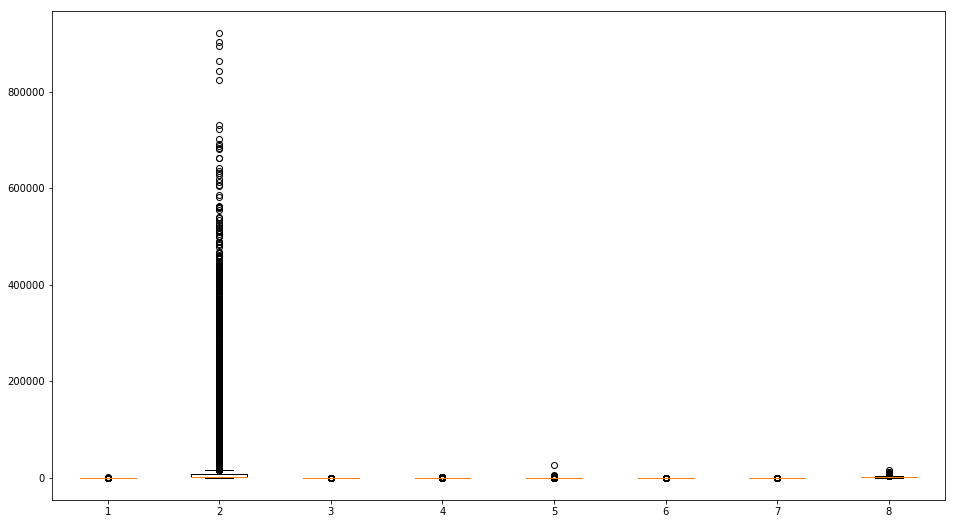

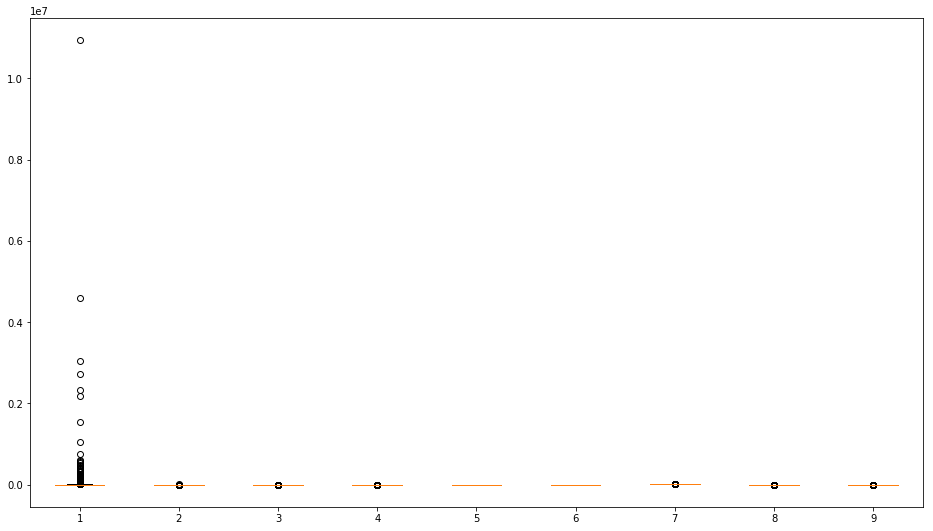

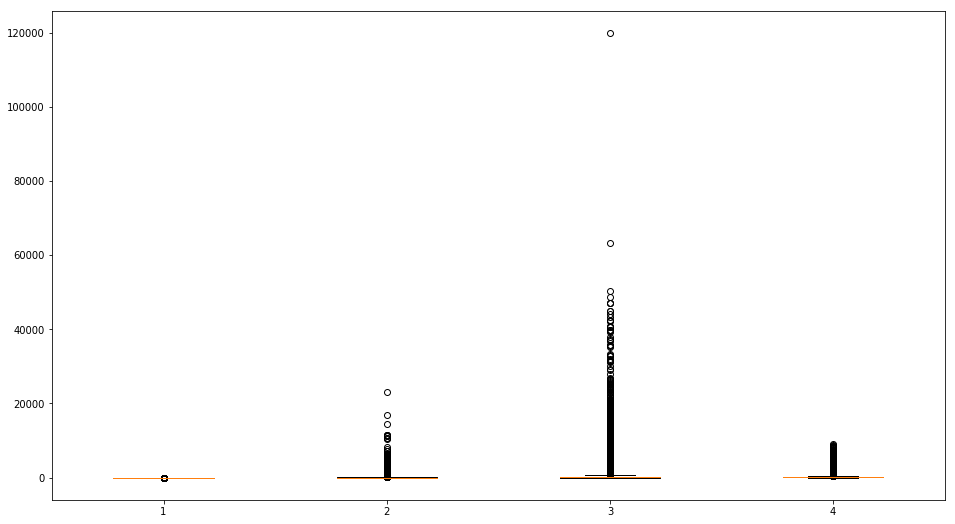

In [0]:
tamaño = (16,9)

def graphBox(data):
  fig = plt.figure(figsize = tamaño)
  ax = fig.add_subplot(111)
  ax.boxplot(data)
  
X_train1 = df_X_train.values[:,1:9]
X_train2 = df_X_train.values[:,10:18]
X_train3 = df_X_train.values[:,19:27]
X_train4 = df_X_train.values[:,27:36]
X_train5 = df_X_train.values[:,37:41]

graphBox(X_train1)
graphBox(X_train2)
graphBox(X_train3)
graphBox(X_train4)
graphBox(X_train5)
df_X_train.sum(axis = 0)

# a) Datos
Uno de los problemas de convertir esta información a una red neuronal que detecte los patrones presentes en un exoplaneta es el hecho de que existen muchos outlies. Como se observan en los boxplots anteriores, la mayoría de los datos del dataset son *outliers*, por lo que no existe una firme relación entre los datos, ya que son increíblemente dispersos. Esto podría evitar que la red supiera cual de todos los atributos corresponden a aquellos de la clase que buscamos (exoplanetas).

Junto con esto, existen 2 columnas del set que tienen sólo datos 0, lo cual realmente no influye en nada, ya que son todos el mismo dato, por lo que no entrega información relevante para el problema, por lo que es conveniente deshacernos de aquellas columnas.

In [0]:
df_X_trainF = df_X_train.drop(['Limb Darkening Coeff3','Limb Darkening Coeff4'], axis = 1)
df_X_testF = df_X_test.drop(['Limb Darkening Coeff3','Limb Darkening Coeff4'], axis = 1)
print(df_X_trainF.shape, df_X_testF.shape)


#Se rehacen los conjuntos, con 2 columnas menos

X_train = df_X_train.values[:,1:]
X_test = df_X_test.values[:,1:]

(4692, 40) (1565, 40)


b) Escale los datos para ser trabajados por el modelo de aprendizaje, indique la importancia de éste paso. Además cree un conjunto de validación extrayendo un cierto porcentaje del conjunto de entrenamiento, por ejemplo el 20% manteniendo el desbalanceo de clases (*split* stratificado).
```python
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_val_scaled = ...
X_test_scaled =  scaler.transform(X_test)
```

In [0]:
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2)   #Se quiere 1 set con 80% test y 20% validación
for train_index, test_index in sss.split(X_train, y_train):
  X_train, X_validation = X_train[train_index], X_train[test_index]   #Se agregan los sets de train y test
  y_train, y_validation = y_train[train_index], y_train[test_index]
print(X_train.shape, y_train.size, X_validation.shape, y_validation.size, X_test.shape, y_test.size)   #Se comprueban sus dimensiones
print(str(y_train.sum()/y_train.size), str(y_validation.sum()/y_validation.size))   #Se comprueba la distribución de clases

(3753, 41) 3753 (939, 41) 939 (1565, 41) 1565
0.3786304289901412 0.3780617678381257


# b) Conjuntos de prueba y validación
Preparar los datos para poder ser aceptados por la red neuronal es un paso vital, ya que si le fuesemos a dar los parámetros normales, sería probable que no encuentre una buena relación entre un exoplaneta y un simple candidato, ya que éstos podrían estar muy dispersos por la data ,y, como ya vimos, existe mucha varianza entre los datos, la mayoría no están en el mismo orden de magnitud.

StratifiedShuffleSplit es una función de SKlearn que busca crear conjuntos mutuos de validación a partir del conjunto de prueba, si se pide sólo 1 batch de estos, se puede usar para generar un conjunto de validación a partir de un conjunto de datos de prueba, manteniendo la disparidad de clases.

Luego de realizar la separación entre los conjuntos, se verifica que las dimensiones iniciales sean iguales a las dimensiones entregadas por StratifiedShuffleSsplit, y se comprueba de que el conjunto original tiene un porcentaje de clases similar al obtenido con la función, ambos con un aproximado de 37.8% de exoplanetas.

Luego, se escalan los datos utilizando la función Scaler, y cada Scale arroja un warning, que se convierte de un número dtype de Numpy a un punto flotante normal, ya que eso es con lo que trabaja la función StandardScaler:

In [0]:
scaler = StandardScaler()

scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)

scaler.fit(X_validation)
X_validation_scaled = scaler.transform(X_validation)

scaler.fit(X_test)
X_test_scaled = scaler.transform(X_test)    #Se escalan los datos de validación

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by 

> c) Muestre en un gráfico la función objetivo (*cross entropy*) para el conjunto de entrenamiento y de validación *vs* número de *epochs* de entrenamiento, para una red *feedforward* de 3 capas, con 256 unidades ocultas y función de activación sigmoidal. Entrene la red usando gradiente descendente estocástico con tasa de aprendizaje (*learning rate*) 0.01 y 100 *epochs* de entrenamiento. Comente. Si observa divergencia durante el entrenamiento, determine si esto ocurre para cada repetición del experimento. Compare el efecto de variar la función de activación a **ReLU** ¿Qué observa en la convergencia del modelo?
```python
from keras.models import Sequential
from keras.layers.core import Dense
from keras.optimizers import SGD
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation="sigmoid"))
model.add(Dense(1, kernel_initializer='uniform',activation="sigmoid")) #this should be mantained
model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy')
hist = model.fit(X_train_scaled, y_train, epochs=100, verbose=1, validation_data=(X_val_scaled, y_val))
```
> Finalmente compare a través de una métrica de desempeño sobre el conjunto de pruebas, en este caso como trabajamos un problema desbalanceado, mida *f1 score weighted*, comente sobre esta decisión ¿Es esperable la diferencia entre relu y sigmoidal en base a los gráficos realizados?
```python
from sklearn.metrics import f1_score
f1_score(y_test,model_sigmoid.predict_classes(X_test_scaled),average='weighted')
f1_score(y_test,model_relu.predict_classes(X_test_scaled),average='weighted')
```

In [0]:
def training(X, activation, lr = 0.01, dec = 0, nes = False, mom = 0, opti = SGD):
  model = Sequential()
  model.add(Dense(256, input_dim=X.shape[1], kernel_initializer='uniform',activation=activation))
  model.add(Dense(1, kernel_initializer='uniform',activation='sigmoid')) 
  model.compile(optimizer=opti(lr=lr, momentum=mom, nesterov=nes, decay = dec),loss='binary_crossentropy',metrics=["accuracy"])
  return model

epochs = 100

In [0]:
model_sigmoid = training(X_train_scaled,'sigmoid')
hist = model_sigmoid.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

Train on 3753 samples, validate on 939 samples
Epoch 1/30
3753/3753 [==============================] - 1s 307us/step - loss: 0.6601 - acc: 0.6142 - val_loss: 0.6525 - val_acc: 0.6219
Epoch 2/30
3753/3753 [==============================] - 0s 90us/step - loss: 0.6491 - acc: 0.6214 - val_loss: 0.6416 - val_acc: 0.6219
Epoch 3/30
3753/3753 [==============================] - 0s 86us/step - loss: 0.6379 - acc: 0.6214 - val_loss: 0.6299 - val_acc: 0.6219
Epoch 4/30
3753/3753 [==============================] - 0s 89us/step - loss: 0.6238 - acc: 0.6214 - val_loss: 0.6184 - val_acc: 0.6262
Epoch 5/30
3753/3753 [==============================] - 0s 86us/step - loss: 0.6100 - acc: 0.6259 - val_loss: 0.6002 - val_acc: 0.6262
Epoch 6/30
3753/3753 [==============================] - 0s 80us/step - loss: 0.5932 - acc: 0.6358 - val_loss: 0.5840 - val_acc: 0.6262
Epoch 7/30
3753/3753 [==============================] - 0s 81us/step - loss: 0.5735 - acc: 0.6680 - val_loss: 0.5636 - val_acc: 0.6571
Epoch 8

In [0]:
model_relu = training(X_train_scaled, 'relu', lr = 0.01) #Activación relu
histR = model_relu.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

Train on 3753 samples, validate on 939 samples
Epoch 1/30
3753/3753 [==============================] - 1s 273us/step - loss: 0.6493 - acc: 0.6485 - val_loss: 0.6106 - val_acc: 0.6539
Epoch 2/30
3753/3753 [==============================] - 0s 84us/step - loss: 0.5807 - acc: 0.6808 - val_loss: 0.5534 - val_acc: 0.7274
Epoch 3/30
3753/3753 [==============================] - 0s 80us/step - loss: 0.5265 - acc: 0.7703 - val_loss: 0.5020 - val_acc: 0.7923
Epoch 4/30
3753/3753 [==============================] - 0s 83us/step - loss: 0.4769 - acc: 0.8135 - val_loss: 0.4544 - val_acc: 0.8371
Epoch 5/30
3753/3753 [==============================] - 0s 83us/step - loss: 0.4323 - acc: 0.8505 - val_loss: 0.4125 - val_acc: 0.8498
Epoch 6/30
3753/3753 [==============================] - 0s 82us/step - loss: 0.3948 - acc: 0.8638 - val_loss: 0.3785 - val_acc: 0.8605
Epoch 7/30
3753/3753 [==============================] - 0s 80us/step - loss: 0.3656 - acc: 0.8662 - val_loss: 0.3520 - val_acc: 0.8690
Epoch 8

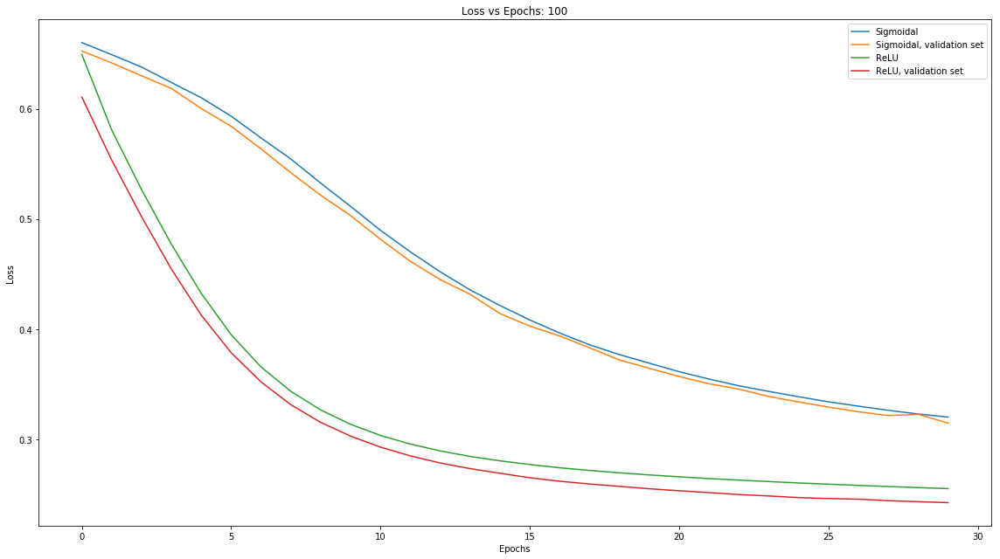

In [0]:
def graph(hist, histR, title, number):   #Hace un plot simple
  loss = hist.history['loss']
  lossR = histR.history['loss']
  lossV = hist.history['val_loss']
  lossVR = histR.history['val_loss']
  fig, ax = plt.subplots(figsize=tamaño)
  ax.plot(loss, label = "Sigmoidal")
  ax.plot(lossV, label = "Sigmoidal, validation set")
  ax.plot(lossR, label = "ReLU")
  ax.plot(lossVR, label = "ReLU, validation set")
  plt.legend()

  ax.set_xlabel('Epochs')
  ax.set_ylabel('Loss')
  ax.set_title(title + str(number))
  fig.tight_layout()
  plt.show()

graph(hist, histR, 'Loss vs Epochs: ', 100)

In [0]:
print(f1_score(y_test,model_sigmoid.predict_classes(X_test_scaled),average='weighted'))
print(f1_score(y_test,model_relu.predict_classes(X_test_scaled),average='weighted'))

0.8341713894285057
0.852723392512733


# c) Redes poco profundas
A partir del experimento, se logra notar que la red con función ReLU aprende más rápido que la red con función sigmoidal. Es posible que esto se deba a una de las varias ventajas que tiene la función ReLU, como por ejemplo que tiene mejor propagación de gradiente, ya que su derivada es un factor de 1 o 0 (excepto en x = 0), por lo que el gradiente no disminuye con cada iteración. Este efecto no es tan notorio, ya que se tiene sólo 1 capa econdida, por lo que la disminución del gradiente por parte de la función sigmoidal es ligera, y se da que, si bien la red aprende igual, es levemente más lento que al compararlo con la red de ReLU

Todo esto se ve reflejado en el F1 Score, en el cual relu obtiene un mejor desempeño que la función sigmoidal. Si bien los valores siguen el orden que presentó el gráfico, la presición presentada en éste no es igual a la obtenidas por los F1 scores.

> d) Repita c) variando la tasa de aprendizaje (*learning rate*) en un rango sensible. Comente. Si observa divergencia durante el entrenamiento, determine si esto ocurre para cada repetición del experimento o para alguna de las dos funciones de activación experimentadas.
```python
import numpy as np
n_lr = 20
lear_rate = np.linspace(0,1,n_lr)
```

In [0]:
n_lr = 20
lear_rate = np.linspace(0.01, 1, n_lr)

In [0]:
histories = []
historiesR = []
for x in lear_rate:
  print("Learning rate número " + str(x) + " Sigmoidal")
  model = training(X_train_scaled, 'sigmoid', lr = x)
  histories.append( model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation)) )
  print("Learning rate número " + str(x) + " ReLU")
  model = training(X_train_scaled, 'relu', lr = x)
  historiesR.append( model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation) ))

Learning rate número 0.01 Sigmoidal
Train on 3753 samples, validate on 939 samples
Epoch 1/30
3753/3753 [==============================] - 5s 1ms/step - loss: 0.6616 - acc: 0.6168 - val_loss: 0.6545 - val_acc: 0.6219
Epoch 2/30
3753/3753 [==============================] - 0s 108us/step - loss: 0.6510 - acc: 0.6214 - val_loss: 0.6464 - val_acc: 0.6219
Epoch 3/30
3753/3753 [==============================] - 0s 104us/step - loss: 0.6410 - acc: 0.6214 - val_loss: 0.6332 - val_acc: 0.6219
Epoch 4/30
3753/3753 [==============================] - 0s 107us/step - loss: 0.6296 - acc: 0.6214 - val_loss: 0.6212 - val_acc: 0.6219
Epoch 5/30
3753/3753 [==============================] - 0s 106us/step - loss: 0.6162 - acc: 0.6238 - val_loss: 0.6072 - val_acc: 0.6262
Epoch 6/30
3753/3753 [==============================] - 0s 105us/step - loss: 0.6002 - acc: 0.6339 - val_loss: 0.6005 - val_acc: 0.7742
Epoch 7/30
3753/3753 [==============================] - 0s 108us/step - loss: 0.5829 - acc: 0.6544 - va

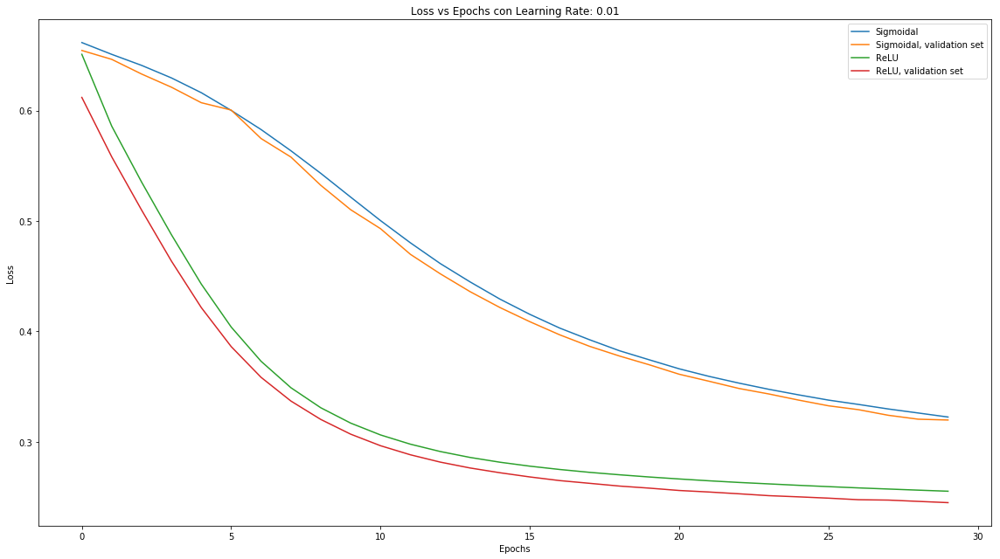

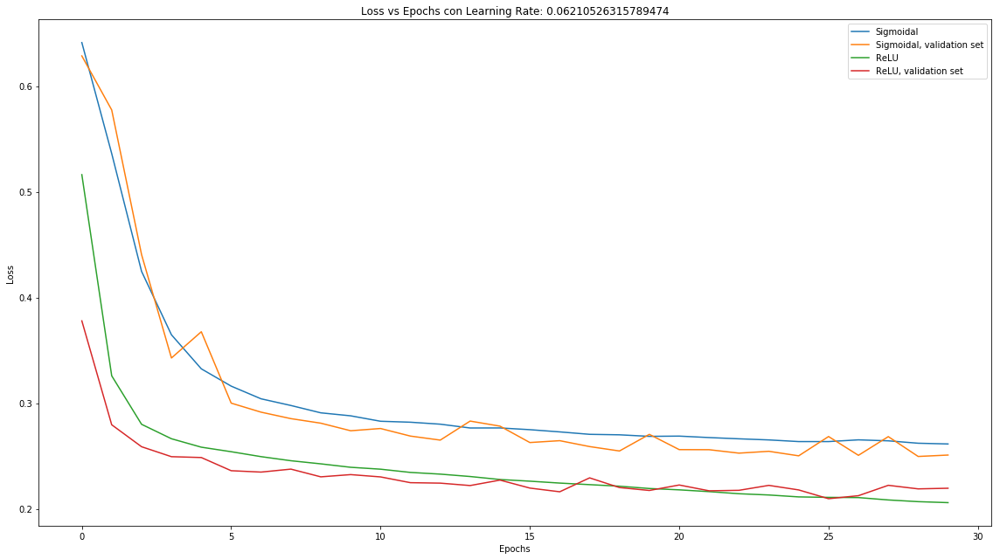

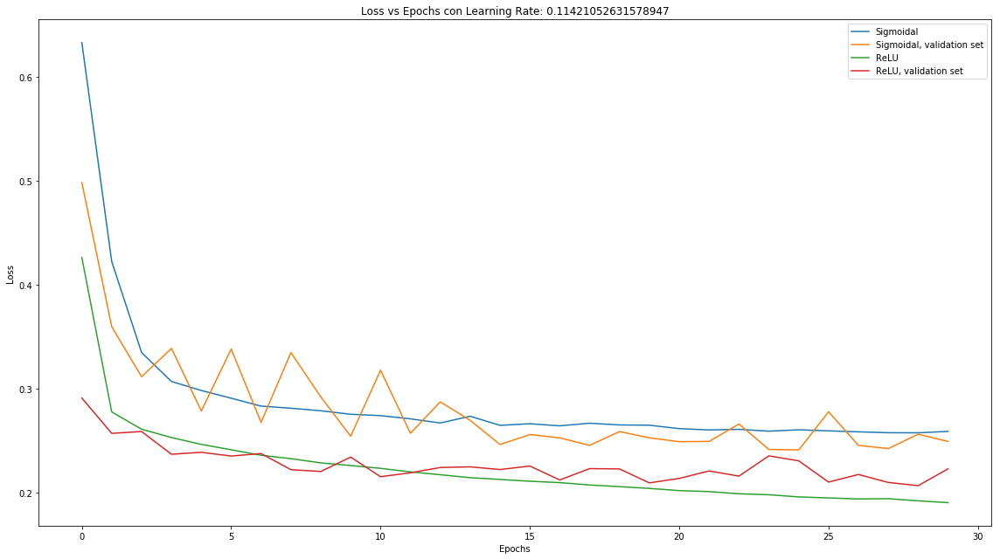

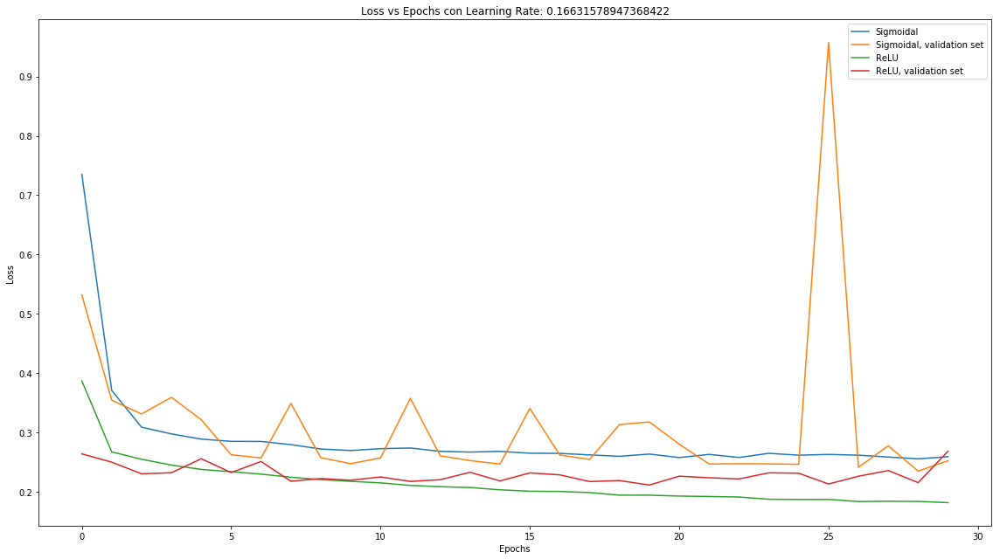

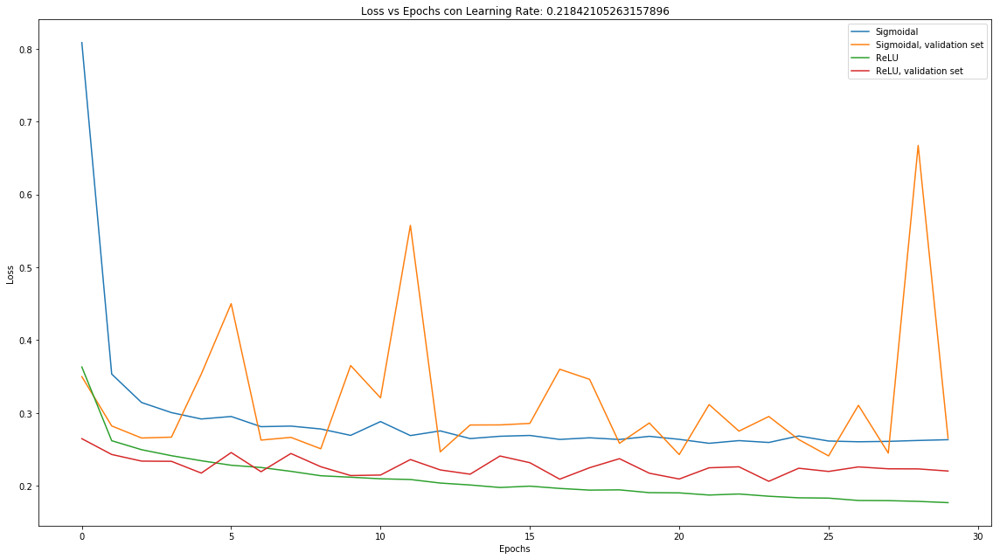

...

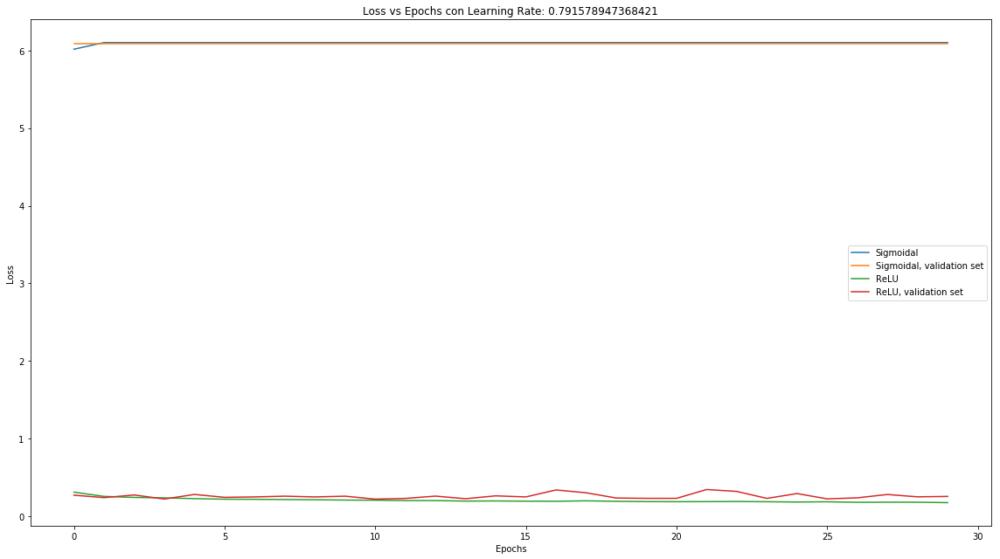

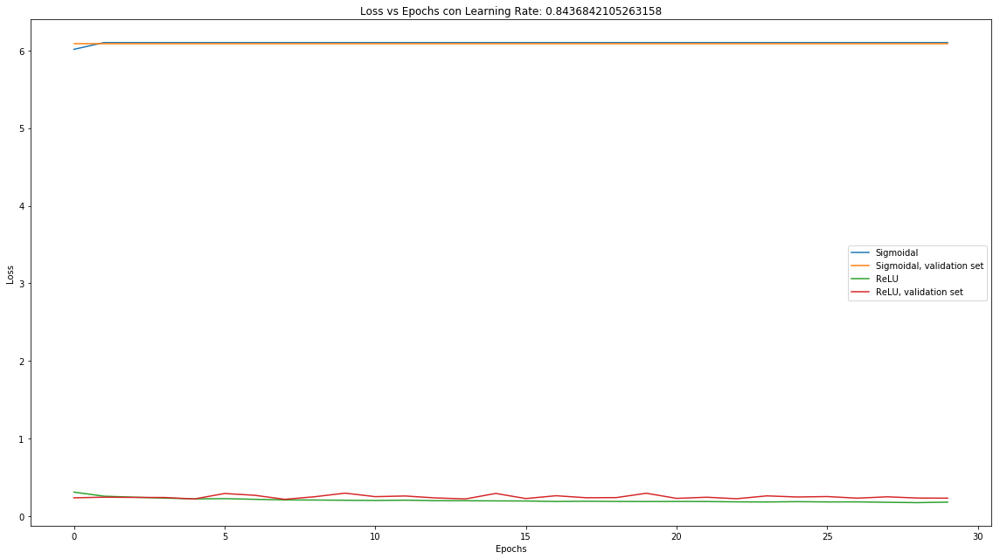

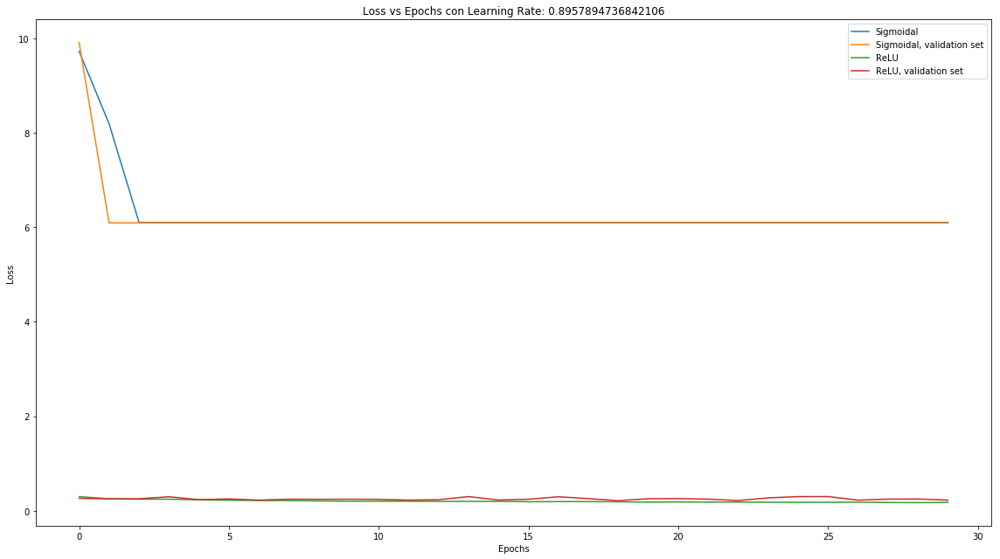

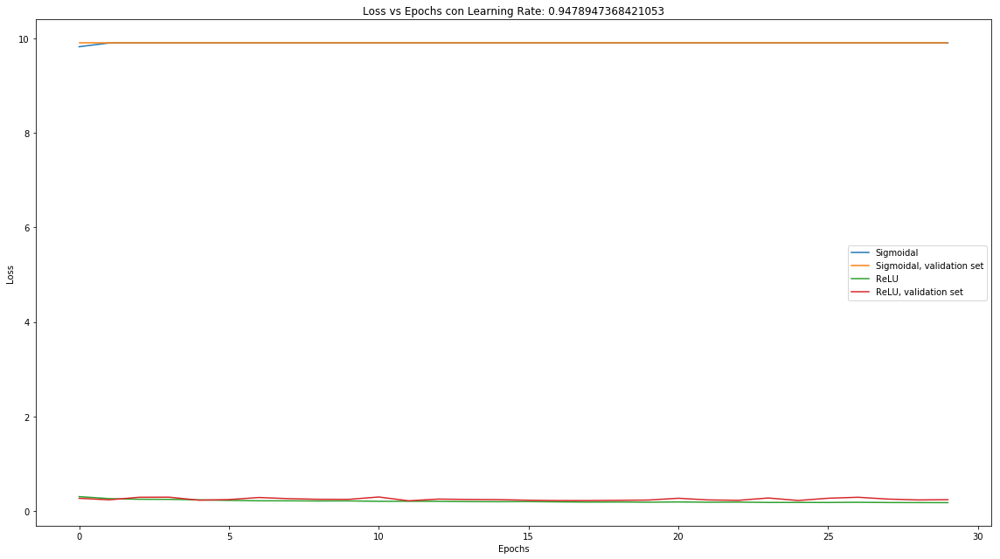

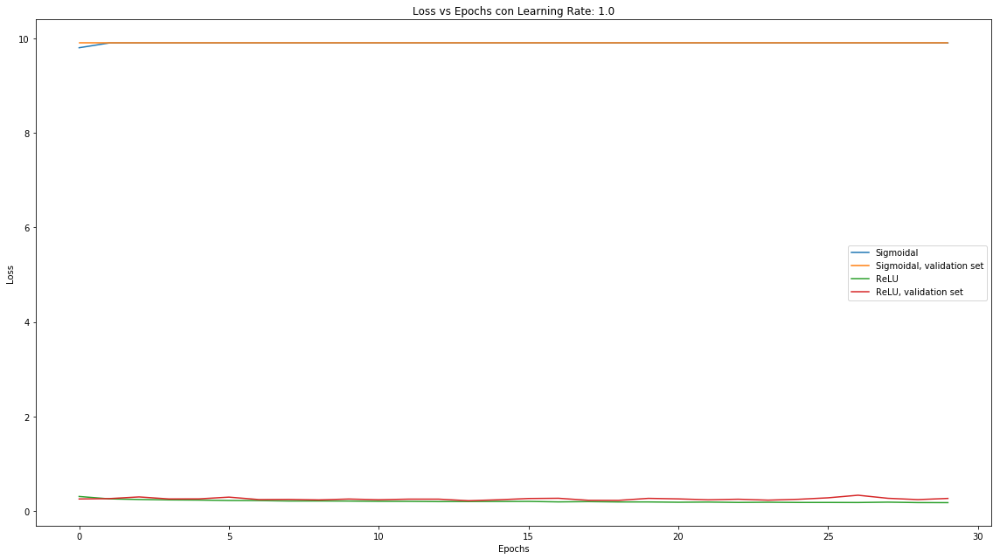

In [0]:
for i in range(n_lr):
  graph(histories[i], historiesR[i], 'Loss vs Epochs con Learning Rate: ', lear_rate[i])

# d) Learning rates
Para este caso, al igual que el anterior, se da que la función ReLU funciona de mejor manera que la sigmoidal para todos los valores de learning rate, mientras que la función sigmoidal diverge su entrenamiento para valor mayores a aproximadamente 0.6. Para estos valores, se tiene que la red que implementa ReLU converge muy rápidamente, en parte, es esperable, ya que esta red ya funcionaba bien, y con mayores learning rates, a diferencia de muchos problemas, logra converge muy rápidamente.

Para valores más pequeños de learning rate, sobre el default de 0.01, se tiene que la función sigmoidal oscila notoriamente, esto puede deberse a que la red da vueltas cerca de un isocontorno de la función que se busca optimizar, pero de igual manera logra converge a lo normal.

> e) Entrene los modelos considerados en c) usando *progressive decay*. Compare y comente.
```python
n_decay = 10
lear_decay = np.logspace(-6,0,n_decay)
sgd = SGD(lr=0.2, decay=1e-6)
```

In [0]:
histories = []
historiesR = []
n_decay = 10
lear_decay = np.logspace(-6,0,n_decay)
epochs = 30
for x in lear_decay:
  print("Se usa decay: ", x)
  histories.append( training(X_train_scaled, 'sigmoid', dec = x).fit(X_train_scaled, y_train, epochs=50, verbose=1, validation_data=(X_validation_scaled, y_validation)) )
  historiesR.append( training(X_train_scaled, 'relu', dec = x).fit(X_train_scaled, y_train, epochs=50, verbose=1, validation_data=(X_validation_scaled, y_validation)) )

Se usa decay:  1e-06
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 3s 858us/step - loss: 0.6574 - acc: 0.6216 - val_loss: 0.6525 - val_acc: 0.6219
Epoch 2/50
3753/3753 [==============================] - 0s 81us/step - loss: 0.6476 - acc: 0.6214 - val_loss: 0.6417 - val_acc: 0.6219
Epoch 3/50
3753/3753 [==============================] - 0s 86us/step - loss: 0.6375 - acc: 0.6214 - val_loss: 0.6298 - val_acc: 0.6219
Epoch 4/50
3753/3753 [==============================] - 0s 85us/step - loss: 0.6254 - acc: 0.6219 - val_loss: 0.6177 - val_acc: 0.6219
Epoch 5/50
3753/3753 [==============================] - 0s 85us/step - loss: 0.6112 - acc: 0.6235 - val_loss: 0.6018 - val_acc: 0.6273
Epoch 6/50
3753/3753 [==============================] - 0s 81us/step - loss: 0.5952 - acc: 0.6379 - val_loss: 0.5857 - val_acc: 0.6251
E

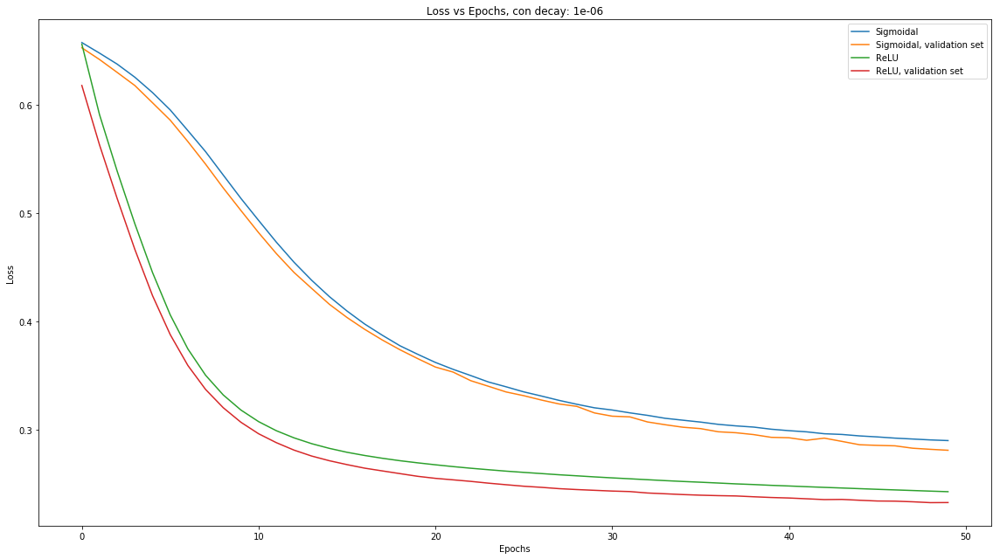

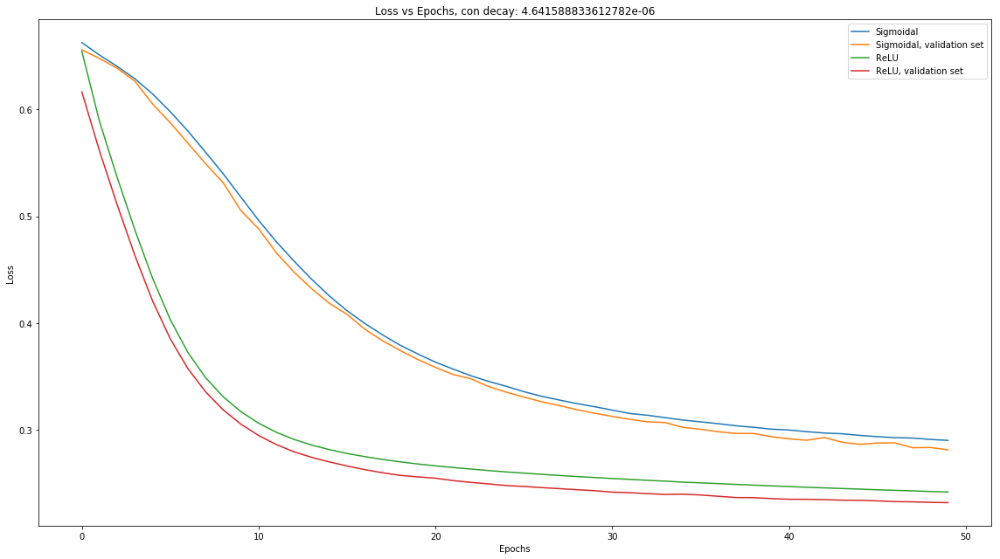

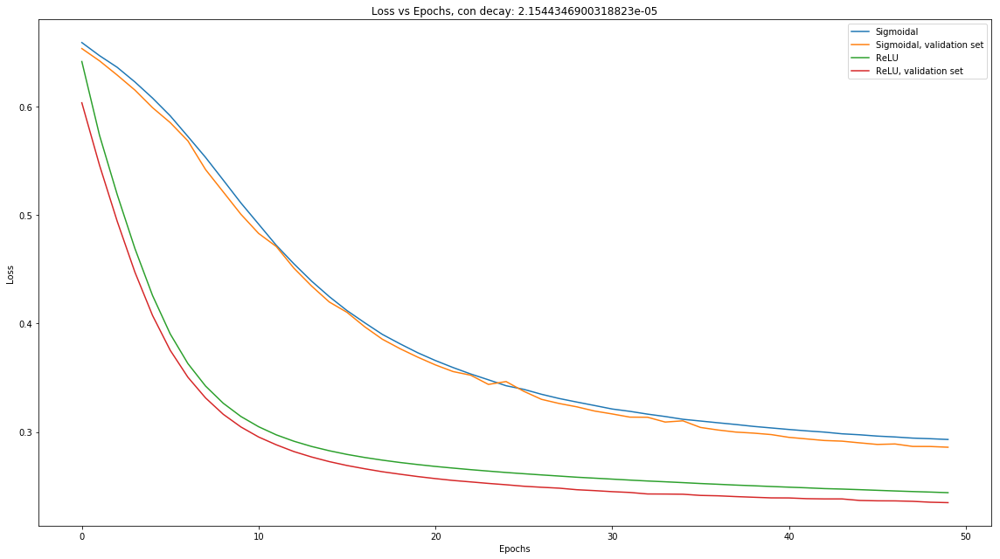

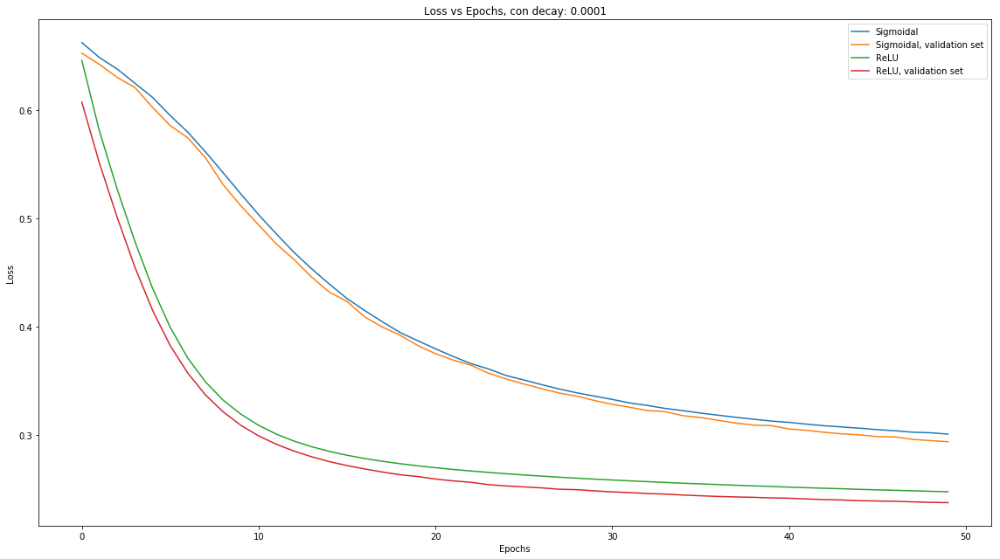

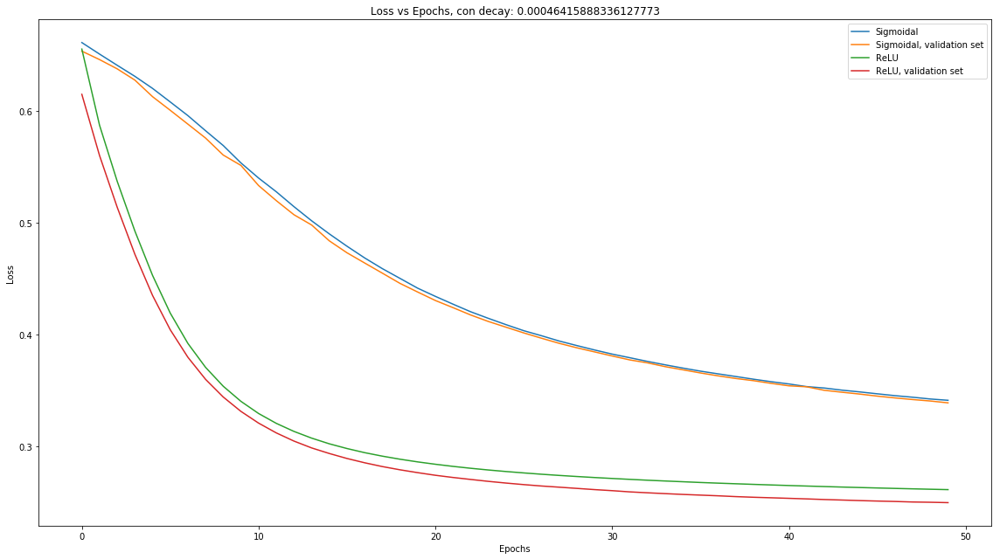

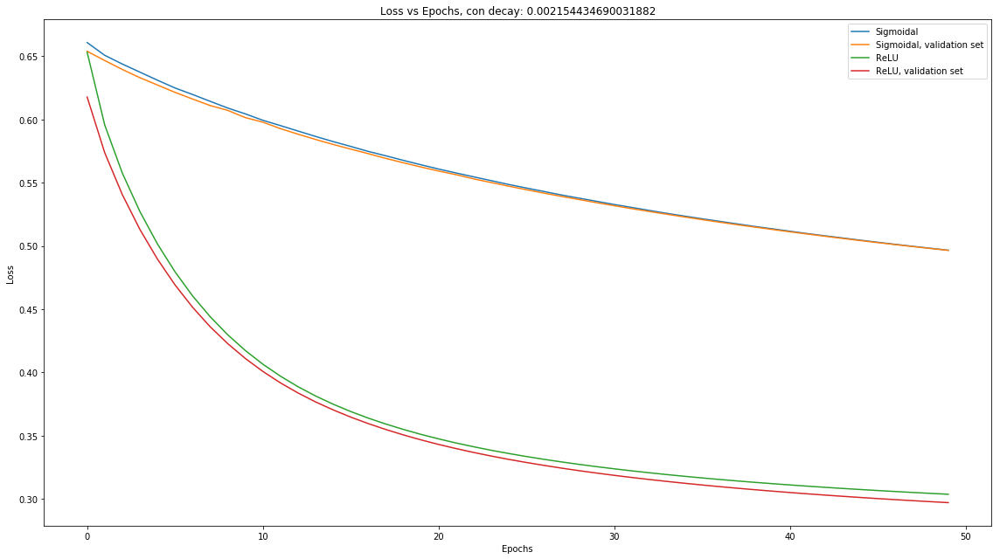

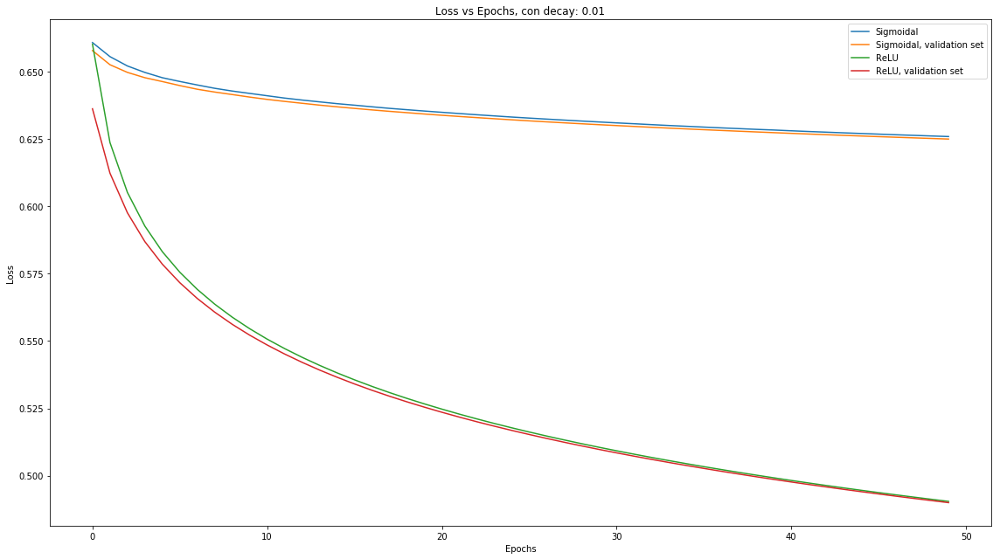

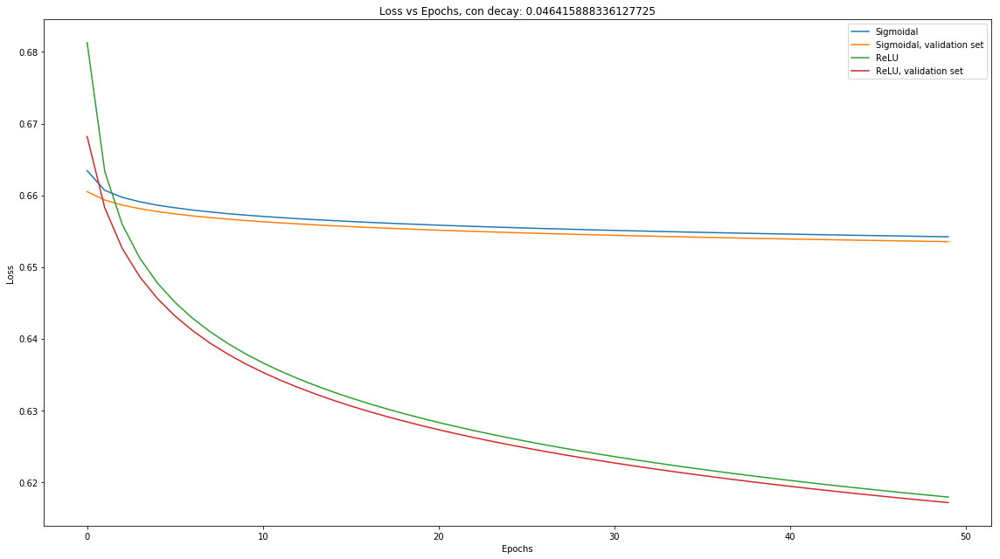

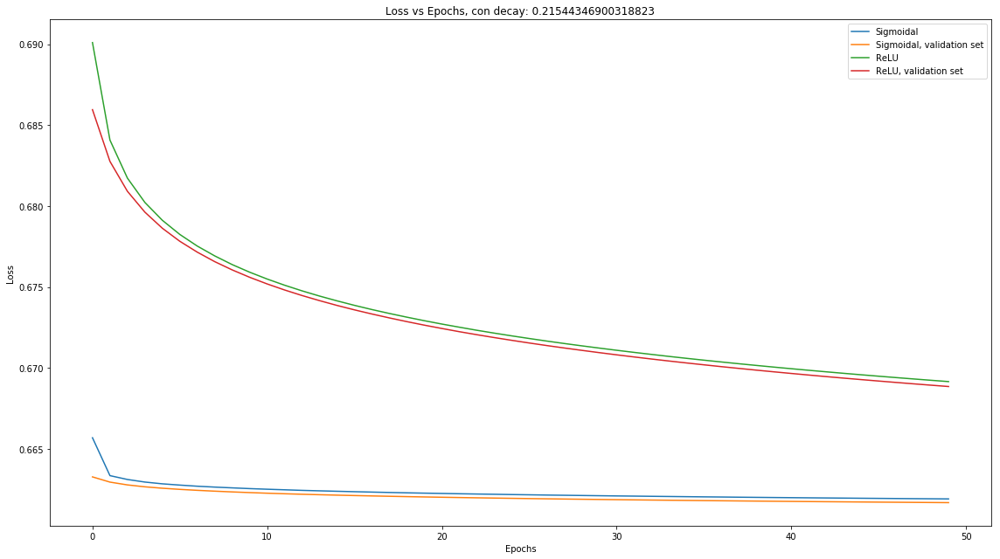

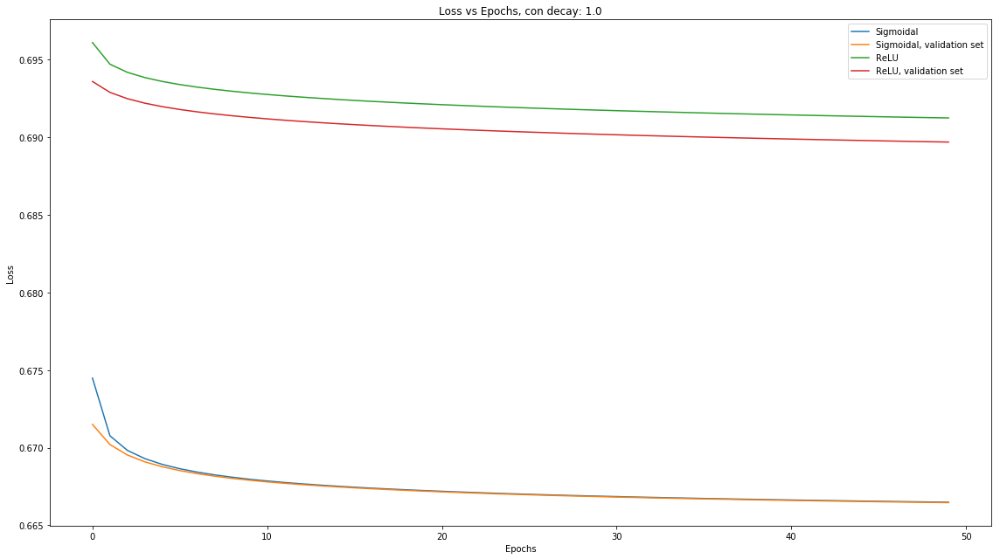

In [0]:
for i in range(n_decay):
  graph(histories[i], historiesR[i], 'Loss vs Epochs, con decay: ', lear_decay[i])

# e) Progessive Decay
En general se puede apreciar de los diferentes gráficos que la red que implementa la función ReLU no es afectada por el uso de progressive decay, probablemente por que la mayoría de su aprendizaje es realizado en las iteraciones más tempranas. En cuanto a la red que utiliza la función sigmoidal, se ve que su utilización podría mejorar levemente el aprendizaje para los valores más bajos, mientras que para valores mayores a 0.01, la red comenzaría a aprender cada vez menos, esto puede ser a que el learning rate decae muy rápido y la red no alcanza a aprender antes que los gradientes no afecten en los pesos de la red.

> f) Entrene los modelos considerados en c) usando *momentum* [[3]](#refs). Experimente usando *momentum* clásico y *momentum* de Nesterov. ¿Observa un mejor resultado final? ¿Observa una mayor velocidad de convergencia sobre el conjunto de entrenamiento? ¿Sobre el conjunto de validación?
```python
split_space = 21
momentum = np.linspace(0,1,split_space)
sgd = SGD(lr=0.01,momentum=0.9,nesterov=False)
```

In [0]:
histories = []
historiesNes = []
historiesR = []
historiesNesR = []
split_space = 21
momentum = np.linspace(0,1,split_space)
for x in momentum:
  print("Se usa momentum: ", x)
  histories.append( training(X_train_scaled, 'sigmoid', mom = x).fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation)) )
  historiesNes.append( training(X_train_scaled, 'sigmoid', mom = x, nes = True).fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation)) )
  historiesR.append( training(X_train_scaled, 'relu', mom = x).fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation)) )
  historiesNesR.append( training(X_train_scaled, 'relu', mom = x, nes = True).fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation)) )

Se usa momentum:  0.0
Train on 3753 samples, validate on 939 samples
Epoch 1/30
3753/3753 [==============================] - 1s 313us/step - loss: 0.6647 - acc: 0.6171 - val_loss: 0.6604 - val_acc: 0.6219
Epoch 2/30
3753/3753 [==============================] - 0s 90us/step - loss: 0.6546 - acc: 0.6214 - val_loss: 0.6478 - val_acc: 0.6219
Epoch 3/30
3753/3753 [==============================] - 0s 85us/step - loss: 0.6446 - acc: 0.6214 - val_loss: 0.6373 - val_acc: 0.6219
Epoch 4/30
3753/3753 [==============================] - 0s 88us/step - loss: 0.6333 - acc: 0.6214 - val_loss: 0.6260 - val_acc: 0.6219
Epoch 5/30
3753/3753 [==============================] - 0s 86us/step - loss: 0.6210 - acc: 0.6214 - val_loss: 0.6142 - val_acc: 0.6315
Epoch 6/30
3753/3753 [==============================] - 0s 82us/step - loss: 0.6053 - acc: 0.6243 - val_loss: 0.5952 - val_acc: 0.6262
Epoch 7/30
3753/3753 [==============================] - 0s 82us/step - loss: 0.5882 - acc: 0.6424 - val_loss: 0.5781 - v

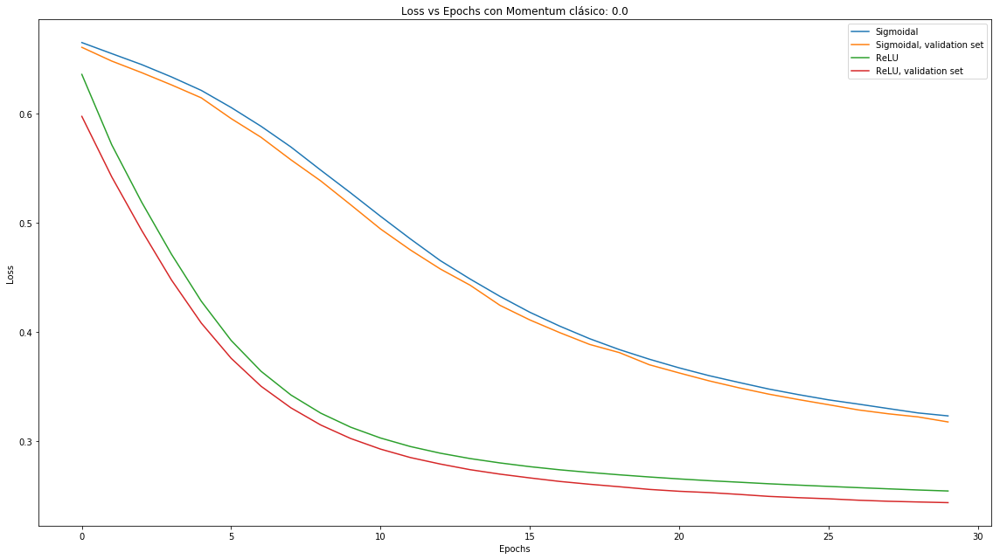

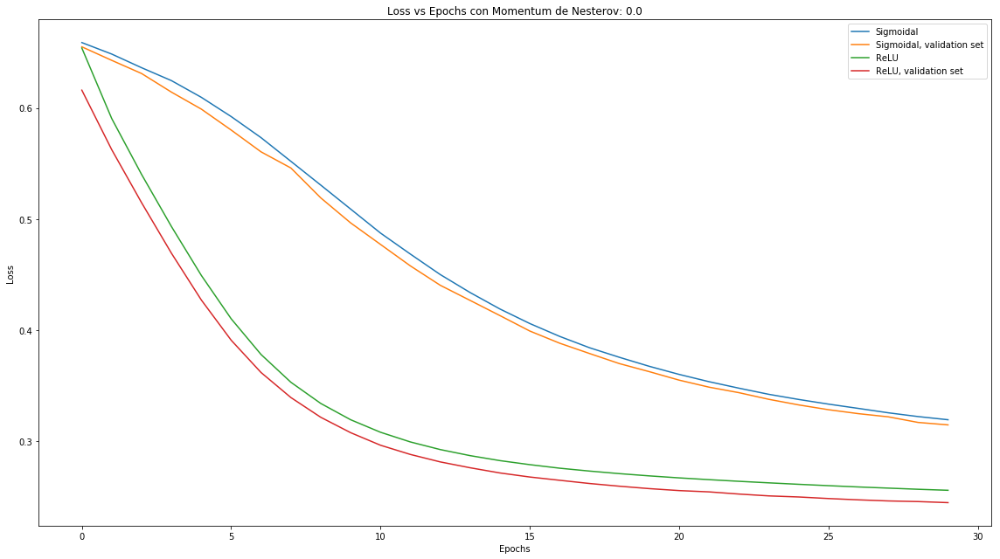

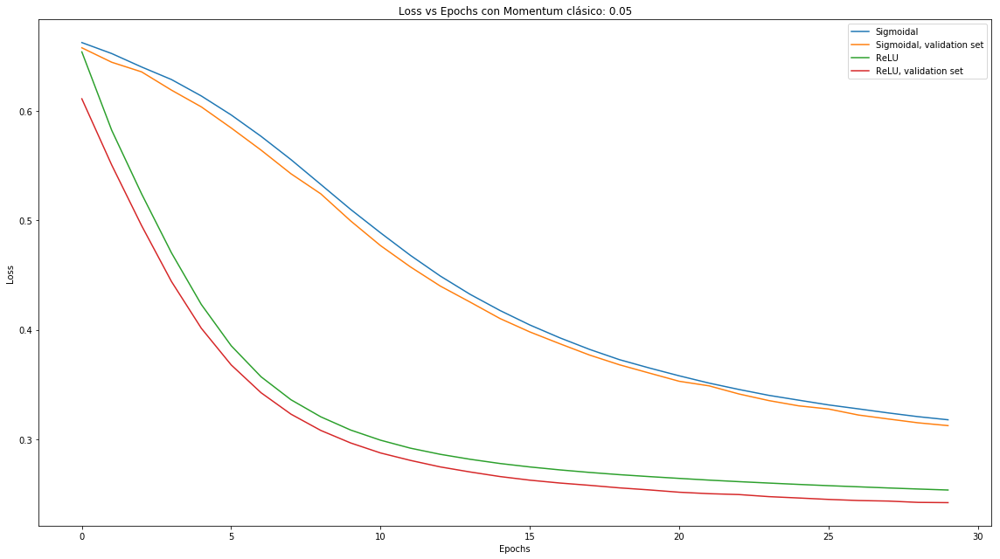

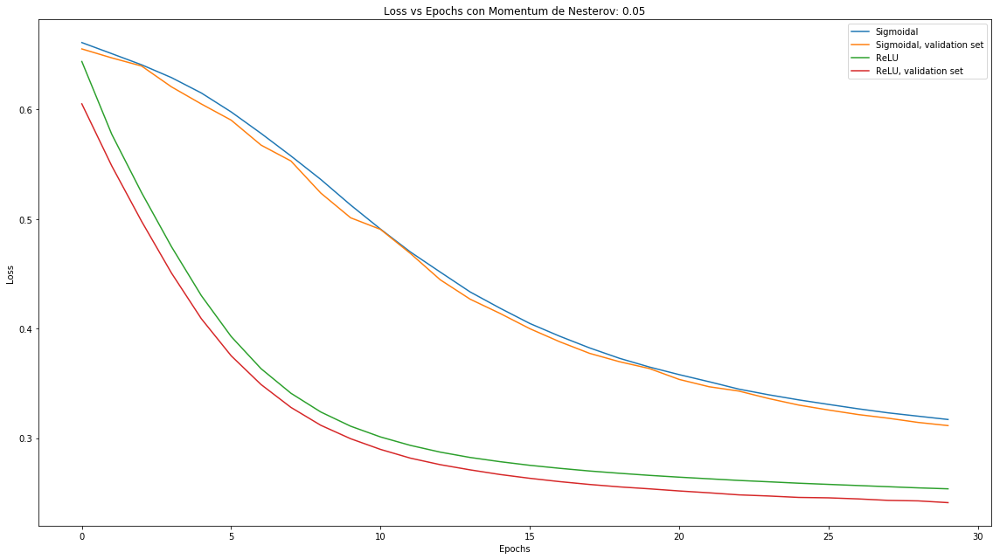

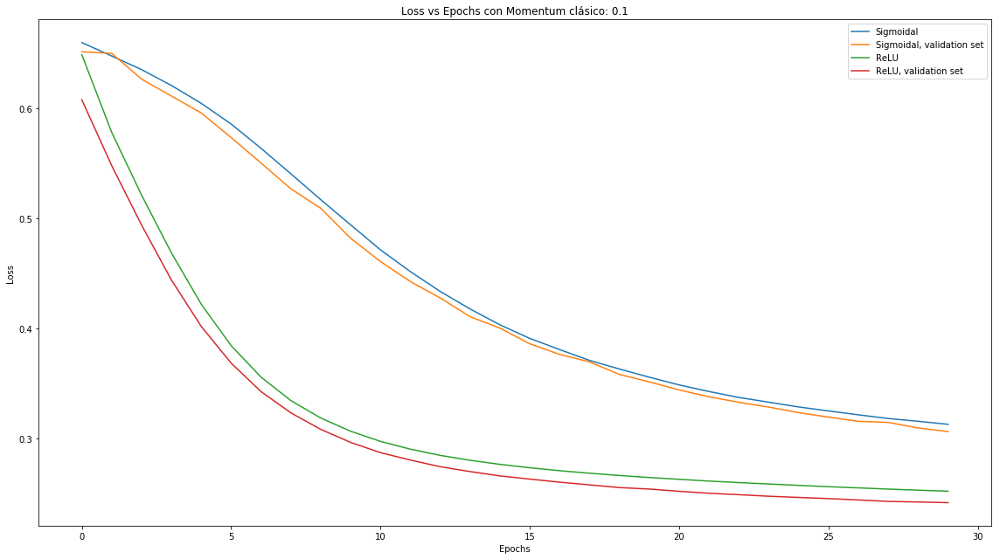

...

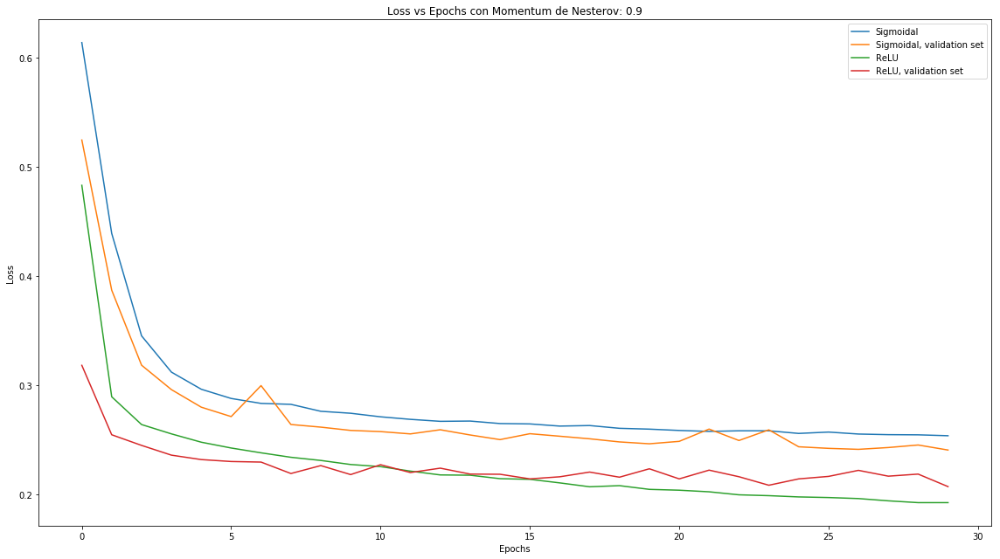

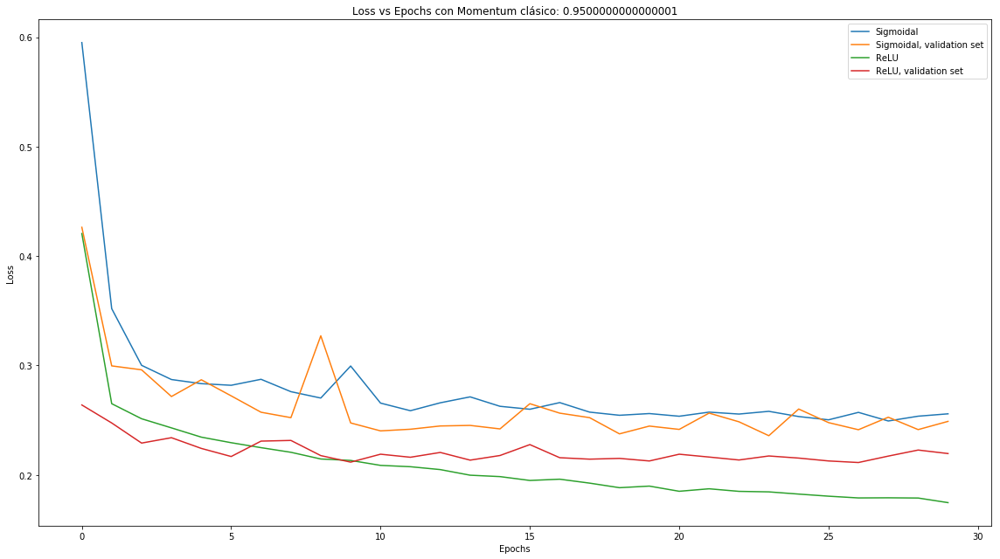

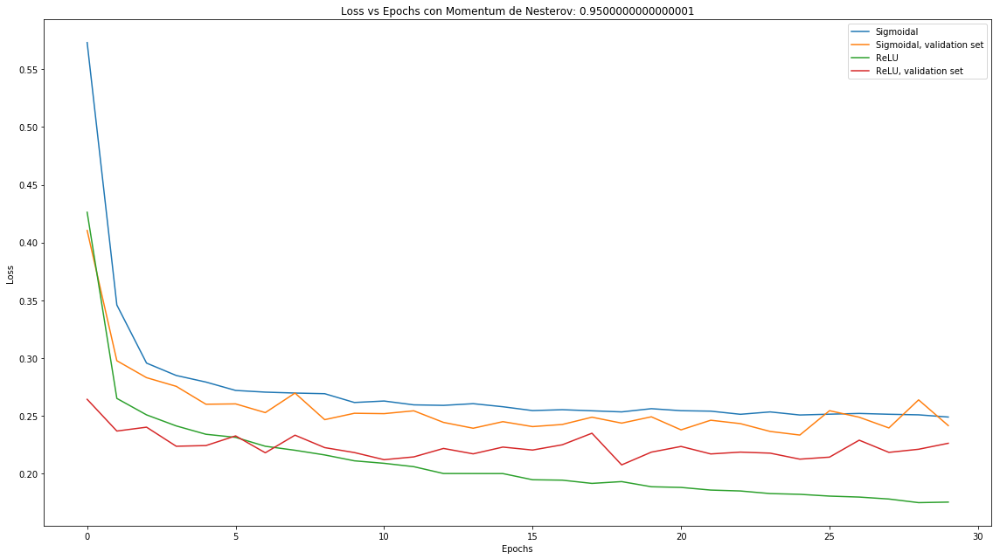

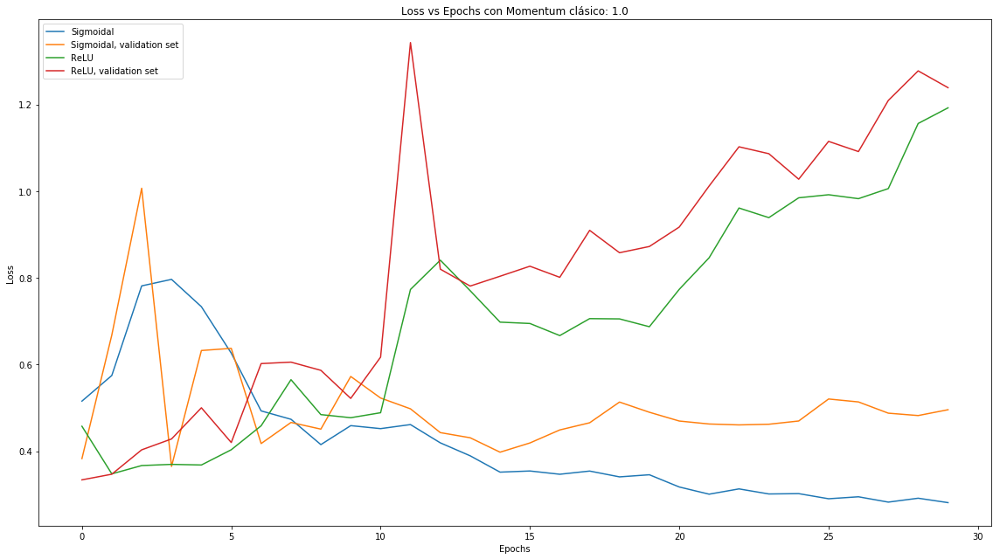

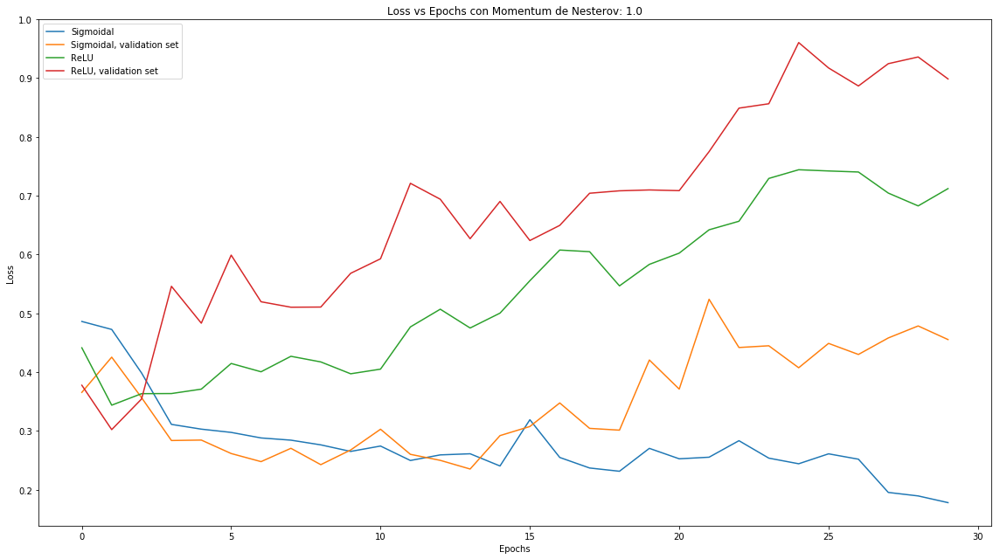

In [0]:
for i in range(split_space):
  graph(histories[i], historiesR[i], 'Loss vs Epochs con Momentum clásico: ', momentum[i])
  graph(historiesNes[i], historiesNesR[i], 'Loss vs Epochs con Momentum de Nesterov: ', momentum[i])

# f) Momentum clásico y Nesterov
Para este caso se logra apreciar que, en general, los resultados son mejores que con progressive decay, ya que, en el caso de la función sigmoidal, se aprecia un ascenso estable en su presición con respecto al momentum. Cabe notar también que los resultados han sido mejores que para la primera prueba (learning rate constante, sin momentum ni decay) en cuanto a la red con la función Sigmoidal.

Para el caso de la red con la función ReLU, los resultados fueron similares que en el primer experimento, y mejores que el experimento de decay.

Para ambos casos se da que el momentum de nesterov no influye mucho con respecto al momentum clásico, ya que los reusltados son bastante parecidos para ambas funciones.

Finalmente, para un momentum clásico y de nesterov con valor 1 se tiene divergencia total para las redes, es posible que se deba a que, en general, las redes ya funcionaban de buena manera, y un momentum muy alto logra acercarlos a otro óptimo local de la función, el cual es peor que el óptimo inicial al que se acercaría la red.

> g) Vuelva a entrenar los modelos considerados en c) utilizando SGD en mini-*batches*. Experimente con diferentes tamaños del *batch*. Comente sobre eficacia de convergencia (converge en menor número de *epochs*) *vs* eficiencia computacional (tiempo en converger o por *epoch*).
```python
n_batches = 21
batch_sizes = np.round(np.linspace(1,X_train_scaled.shape[0],n_batches))
model.fit(X_train_scaled,y_train,batch_size=50,epochs=100,validation_data=(X_validation_scaled, y_val))
```

In [0]:
n_batches = 21
batch_sizes = np.round(np.linspace(1,X_train_scaled.shape[0],n_batches))

model_sigmoid = training(X_train_scaled, 'sigmoid')
model_relu = training(X_train_scaled, 'relu')


hist = []
histR = []
epochs = 30

for x in batch_sizes:
  
  hist.append( model_sigmoid.fit(X_train_scaled, y_train, batch_size=int(x), epochs=epochs, 
                                 validation_data=(X_validation_scaled, y_validation) ) )
  histR.append( model_relu.fit(X_train_scaled, y_train, batch_size=int(x), epochs=epochs, 
                               validation_data=(X_validation_scaled, y_validation) ) )

Train on 3753 samples, validate on 939 samples
Epoch 1/30
3753/3753 [==============================] - 18s 5ms/step - loss: 0.4722 - acc: 0.7581 - val_loss: 0.4147 - val_acc: 0.7998
Epoch 2/30
3753/3753 [==============================] - 12s 3ms/step - loss: 0.3099 - acc: 0.8606 - val_loss: 0.2903 - val_acc: 0.8690
Epoch 3/30
3753/3753 [==============================] - 12s 3ms/step - loss: 0.2951 - acc: 0.8646 - val_loss: 0.2576 - val_acc: 0.8914
Epoch 4/30
3753/3753 [==============================] - 12s 3ms/step - loss: 0.2821 - acc: 0.8758 - val_loss: 0.2676 - val_acc: 0.8765
Epoch 5/30
3753/3753 [==============================] - 12s 3ms/step - loss: 0.2807 - acc: 0.8782 - val_loss: 0.2452 - val_acc: 0.9042
Epoch 6/30
3753/3753 [==============================] - 12s 3ms/step - loss: 0.2762 - acc: 0.8801 - val_loss: 0.2542 - val_acc: 0.8871
Epoch 7/30
3753/3753 [==============================] - 13s 3ms/step - loss: 0.2740 - acc: 0.8825 - val_loss: 0.2679 - val_acc: 0.8743
Epoch 8/

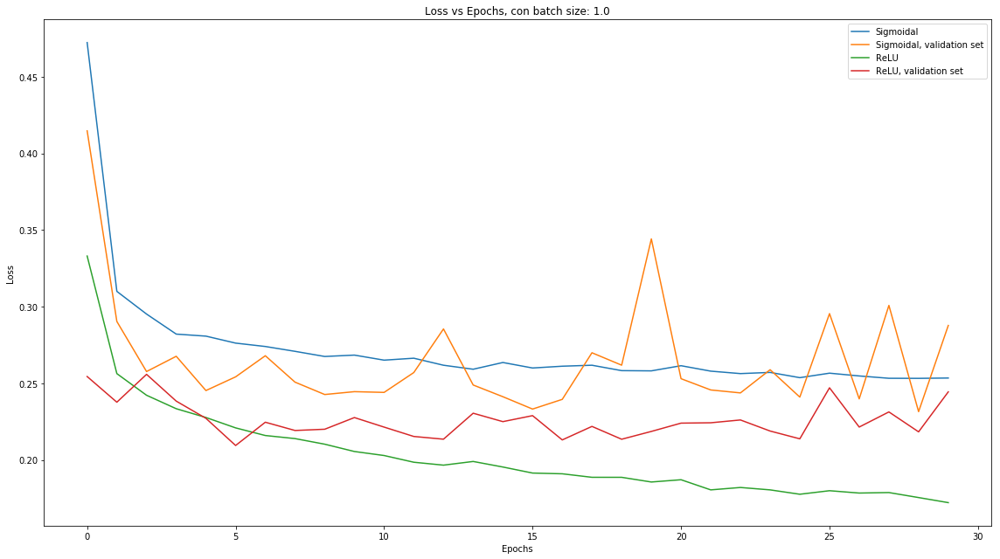

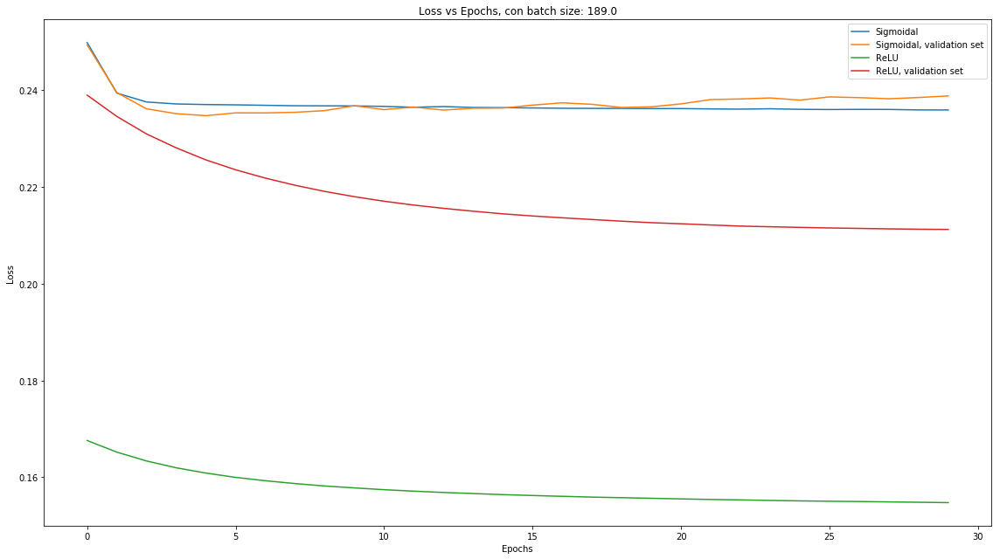

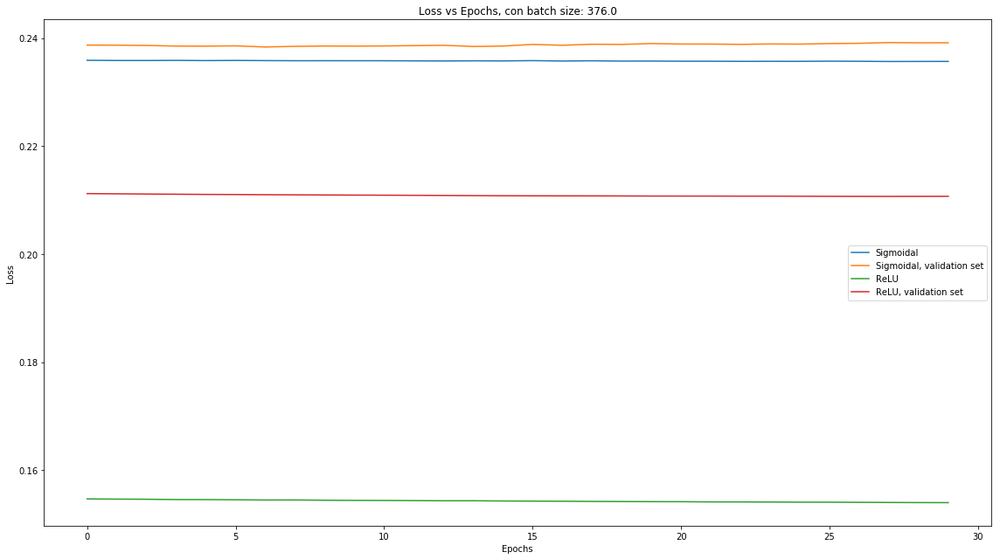

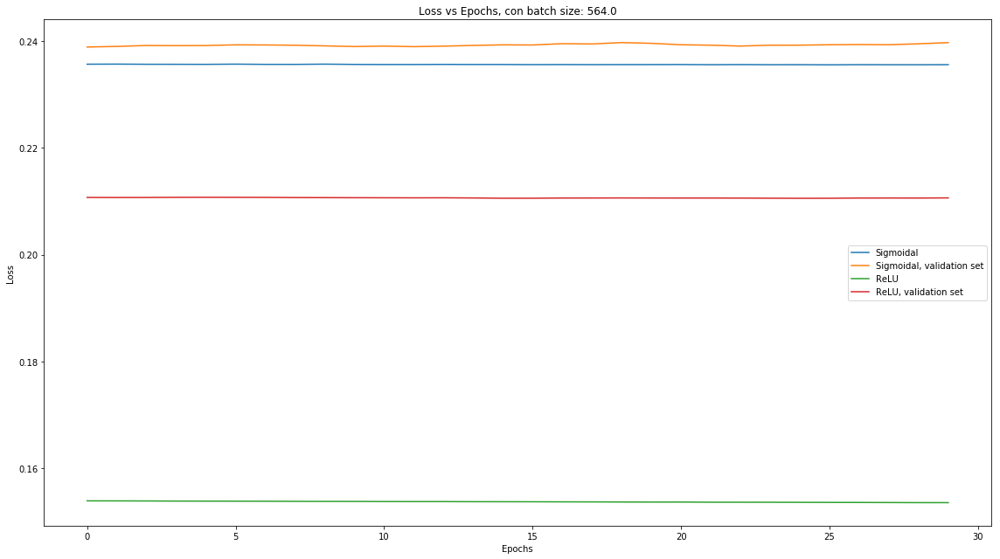

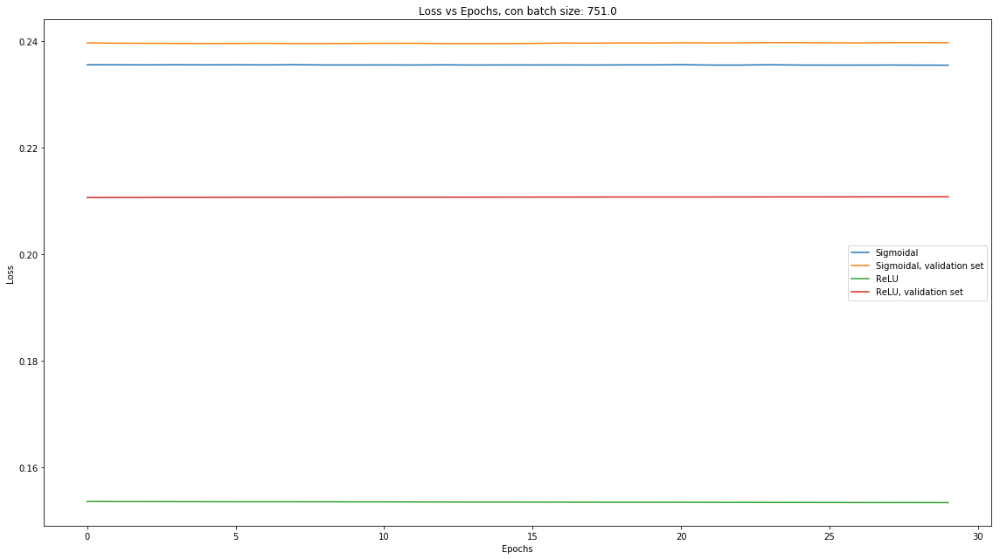

...

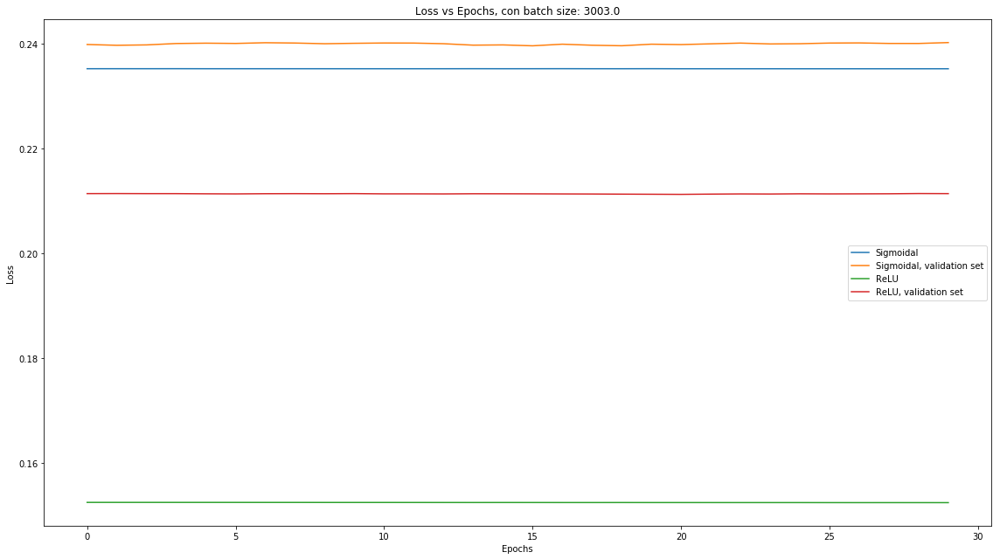

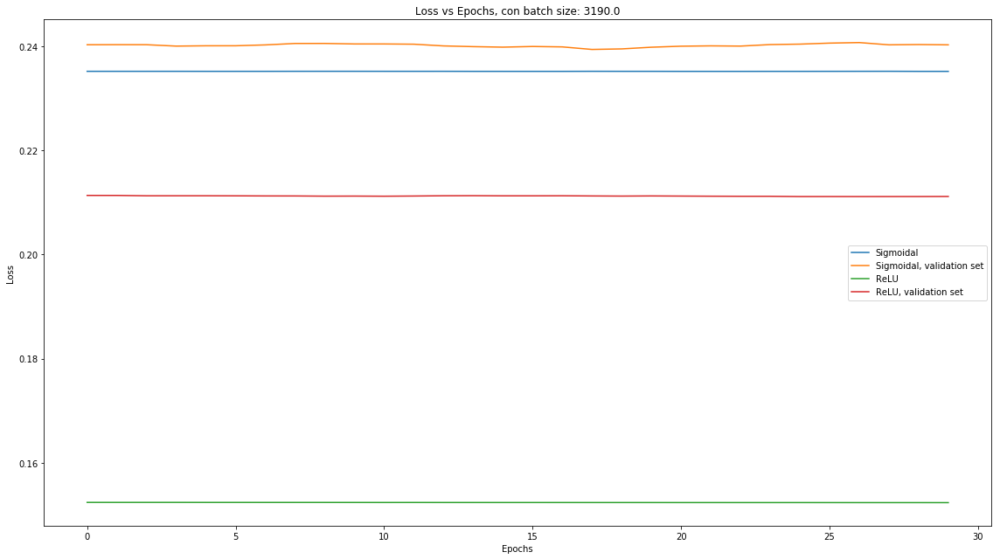

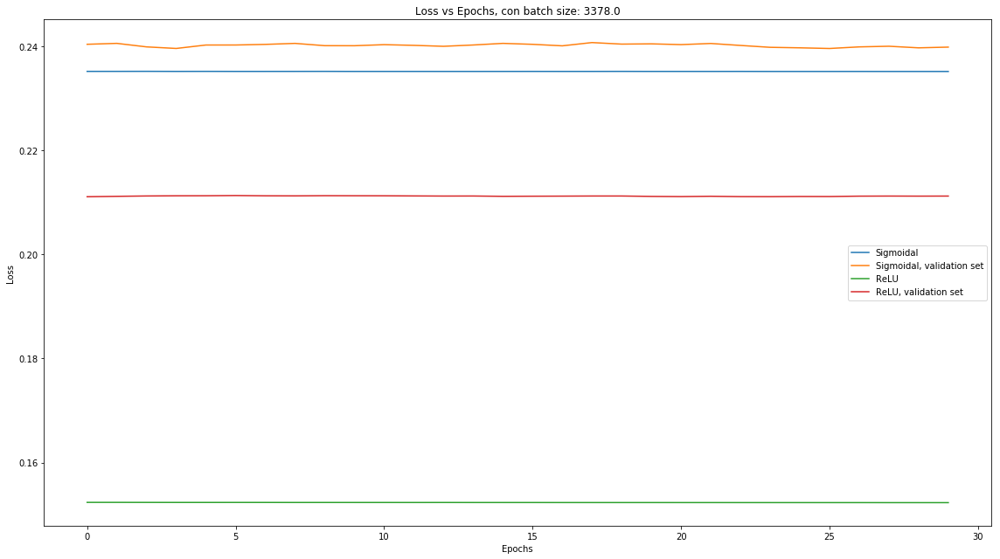

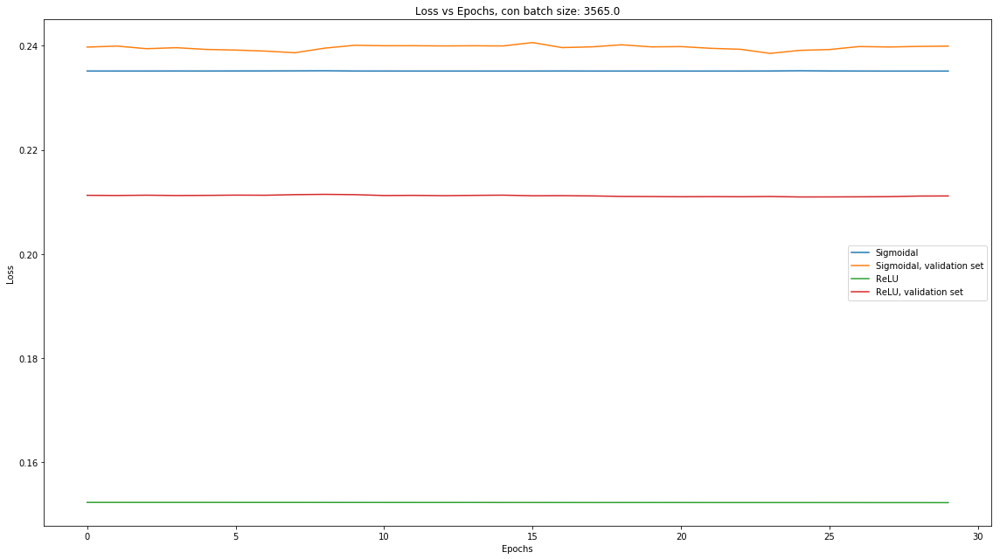

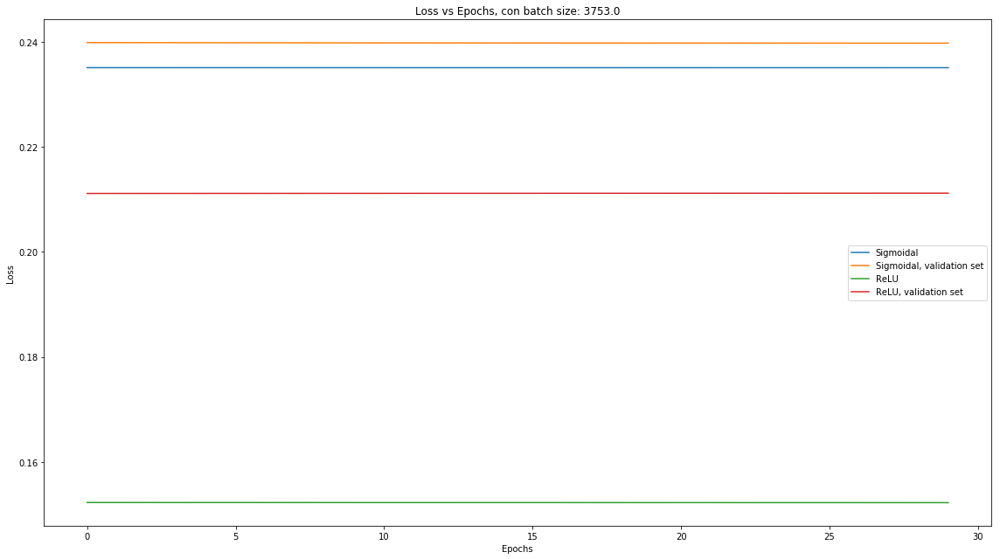

In [0]:
for i in range(n_batches):
  graph(hist[i], histR[i], 'Loss vs Epochs, con batch size: ', batch_sizes[i])

# g) Mini batches
Para este caso, se puede apreciar que una cantidad más grande del batch ha sido bueno, ya que el modelo converge rápidamente, sin embargo, para valores más grande (ya para más de 300) las redes se no logran aprender más, sin embargo, cabe notar que las presiciones de las mismas con tamaños grandes de batch son bastante buenas para no poder aprender a lo largo de las iteraciones, pero esto podría ser la naturaleza aleatoria de los pesos iniciales de la red.

> h) Entrene los modelos obtenidos en c) utilizando estrategias modernas para adaptar la tasa de aprendizaje. Compare los desempeños de *adagrad, adadelta, RMSprop* y *adam*, ofrecidos en __[keras optimizer](https://keras.io/optimizers/)__. ¿Se observa en algún caso un mejor resultado final? ¿Se observa en algún caso una mayor velocidad de convergencia sobre el dataset de entrenamiento? ¿Sobre el dataset de validación?
```python
from keras.optimizers import SGD, Adam, RMSprop, Adagrad, Adadelta
moptimizer = Adagrad(lr=0.01)
model.compile(optimizer=moptimizer)
model.fit(X_train_scaled,y_train,batch_size=bs,epochs=100,validation_data=(X_val_scaled, y_val))
```

In [0]:
bs = 100
epoch = 100

def model2(opti, fun):
  model = Sequential()
  model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation=fun))
  model.add(Dense(1, kernel_initializer='uniform',activation='sigmoid')) #this should be mantained  
  model.compile(optimizer=opti(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
  return model

model_siggrad = model2(Adagrad, 'sigmoid').fit(X_train_scaled,y_train,batch_size=bs,epochs=epoch, validation_data=(X_validation_scaled, y_validation))
model_relgrad = model2(Adagrad, 'relu').fit(X_train_scaled,y_train,batch_size=bs,epochs=epoch, validation_data=(X_validation_scaled, y_validation))

model_sigdel = model2(Adadelta, 'sigmoid').fit(X_train_scaled,y_train,batch_size=bs,epochs=epoch, validation_data=(X_validation_scaled, y_validation))
model_reldel = model2(Adadelta, 'relu').fit(X_train_scaled,y_train,batch_size=bs,epochs=epoch, validation_data=(X_validation_scaled, y_validation))

model_sigrms = model2(RMSprop, 'sigmoid').fit(X_train_scaled,y_train,batch_size=bs,epochs=epoch, validation_data=(X_validation_scaled, y_validation))
model_relrms = model2(RMSprop, 'relu').fit(X_train_scaled,y_train,batch_size=bs,epochs=epoch, validation_data=(X_validation_scaled, y_validation))

model_sigadam = model2(Adam, 'sigmoid').fit(X_train_scaled,y_train,batch_size=bs,epochs=epoch, validation_data=(X_validation_scaled, y_validation))
model_reladam = model2(Adam, 'relu').fit(X_train_scaled,y_train,batch_size=bs,epochs=epoch, validation_data=(X_validation_scaled, y_validation))

Train on 3753 samples, validate on 939 samples
Epoch 1/100
3753/3753 [==============================] - 7s 2ms/step - loss: 0.4776 - acc: 0.7764 - val_loss: 0.3941 - val_acc: 0.8360
Epoch 2/100
3753/3753 [==============================] - 0s 40us/step - loss: 0.3577 - acc: 0.8572 - val_loss: 0.3277 - val_acc: 0.8690
Epoch 3/100
3753/3753 [==============================] - 0s 40us/step - loss: 0.3180 - acc: 0.8708 - val_loss: 0.3051 - val_acc: 0.8669
Epoch 4/100
3753/3753 [==============================] - 0s 39us/step - loss: 0.2980 - acc: 0.8764 - val_loss: 0.2911 - val_acc: 0.8679
Epoch 5/100
3753/3753 [==============================] - 0s 40us/step - loss: 0.2867 - acc: 0.8785 - val_loss: 0.2780 - val_acc: 0.8701
Epoch 6/100
3753/3753 [==============================] - 0s 39us/step - loss: 0.2793 - acc: 0.8766 - val_loss: 0.2685 - val_acc: 0.8818
Epoch 7/100
3753/3753 [==============================] - 0s 39us/step - loss: 0.2742 - acc: 0.8812 - val_loss: 0.2665 - val_acc: 0.8743
Ep

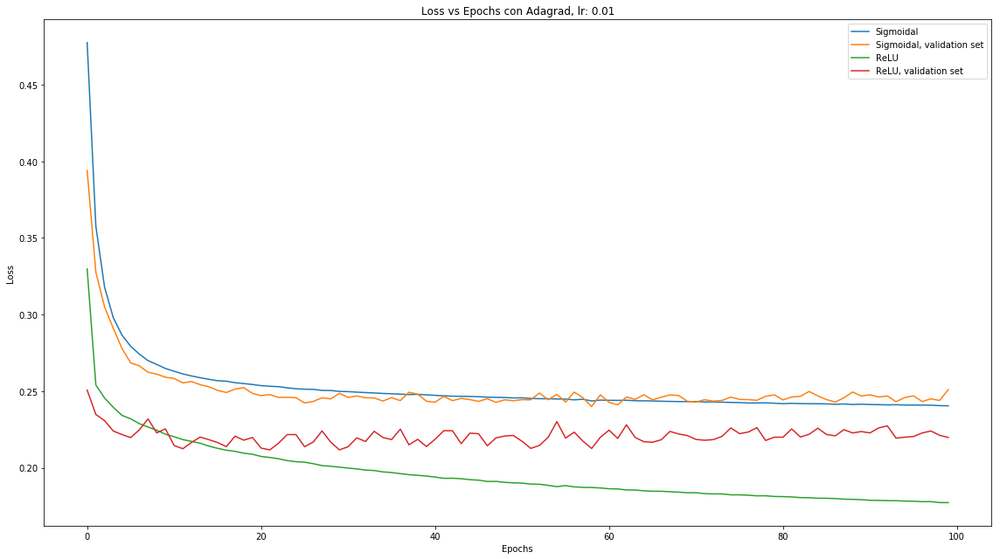

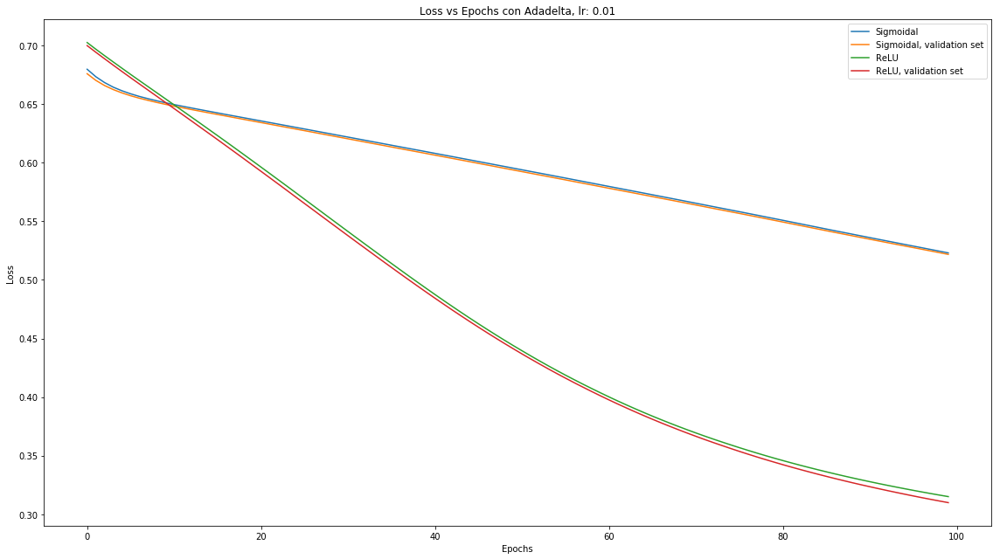

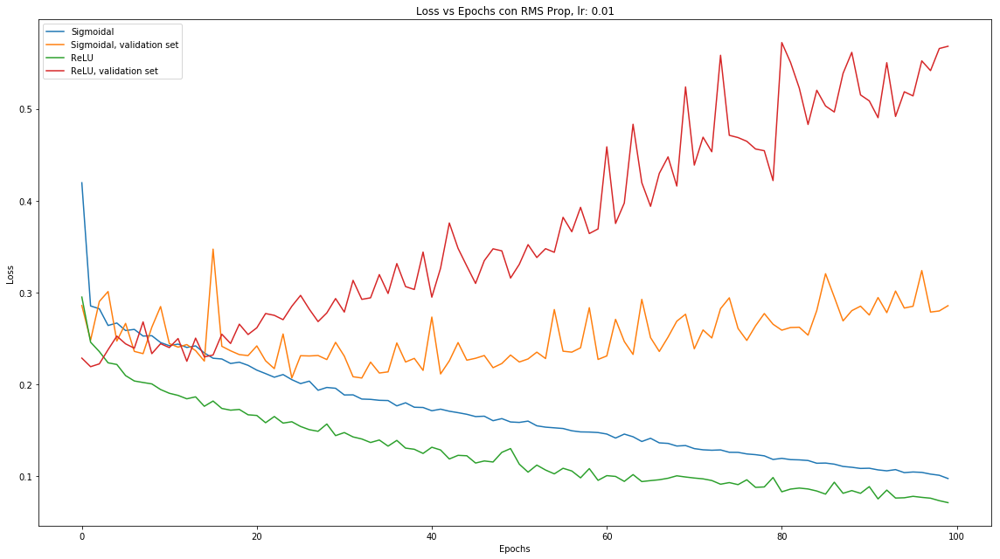

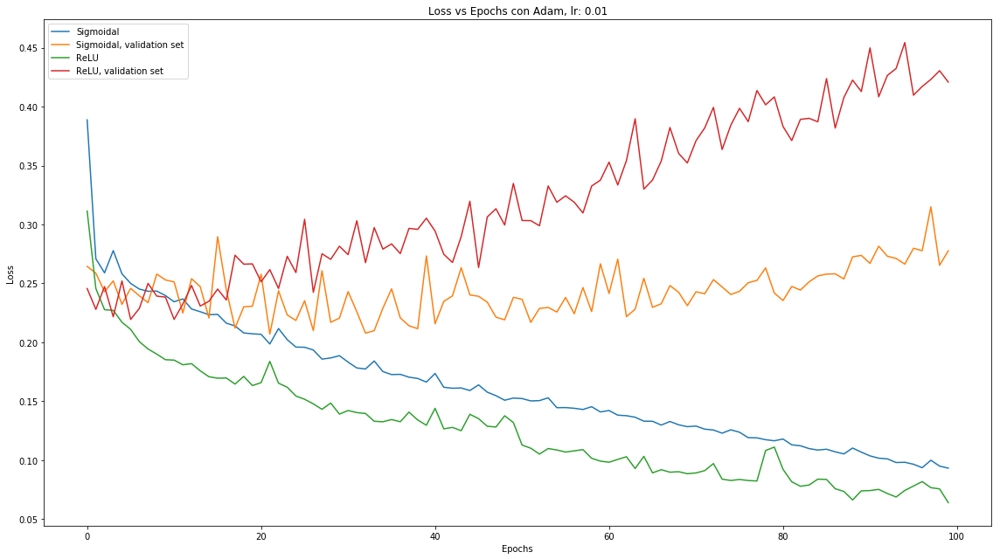

'fig, ax = plt.subplots(figsize=(10,5))\nax.plot(model_siggrad.history[\'val_acc\'], label = "Sigmoidal Adagrad")\nax.plot(model_sigdel.history[\'val_acc\'], label = "Sigmoidal Adadelta")\nax.plot(model_sigrms.history[\'val_acc\'], label = "Sigmoidal RMS Prop")\nax.plot(model_sigadam.history[\'val_acc\'], label = "Sigmoidal Adam")\nplt.legend()\n\nax.set_xlabel(\'Epochs\')\nax.set_ylabel(\'Accuracy\')\nax.set_title(r\'Precisión de validación por epoch función Sigmoidal\')\nfig.tight_layout()\nplt.show()\n\nfig, ax = plt.subplots(figsize=(10,5))\nax.plot(model_relgrad.history[\'val_acc\'], label = "ReLU Adagrad")\nax.plot(model_reldel.history[\'val_acc\'], label = "ReLU Adadelta")\nax.plot(model_relrms.history[\'val_acc\'], label = "ReLU RMS Prop") \nax.plot(model_reladam.history[\'val_acc\'], label = "ReLU Adam")\nplt.legend()\n\nax.set_xlabel(\'Epochs\')\nax.set_ylabel(\'Accuracy\')\nax.set_title(r\'Precisión de validación por epoch ReLU\')\nfig.tight_layout()\nplt.show()'

In [0]:
graph(model_siggrad, model_relgrad, 'Loss vs Epochs con Adagrad, lr: ', 0.01)
graph(model_sigdel, model_reldel, 'Loss vs Epochs con Adadelta, lr: ', 0.01)
graph(model_sigrms, model_relrms, 'Loss vs Epochs con RMS Prop, lr: ', 0.01)
graph(model_sigadam, model_reladam, 'Loss vs Epochs con Adam, lr: ', 0.01)

'''fig, ax = plt.subplots(figsize=(10,5))
ax.plot(model_siggrad.history['val_acc'], label = "Sigmoidal Adagrad")
ax.plot(model_sigdel.history['val_acc'], label = "Sigmoidal Adadelta")
ax.plot(model_sigrms.history['val_acc'], label = "Sigmoidal RMS Prop")
ax.plot(model_sigadam.history['val_acc'], label = "Sigmoidal Adam")
plt.legend()

ax.set_xlabel('Epochs')
ax.set_ylabel('Accuracy')
ax.set_title(r'Precisión de validación por epoch función Sigmoidal')
fig.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(10,5))
ax.plot(model_relgrad.history['val_acc'], label = "ReLU Adagrad")
ax.plot(model_reldel.history['val_acc'], label = "ReLU Adadelta")
ax.plot(model_relrms.history['val_acc'], label = "ReLU RMS Prop") 
ax.plot(model_reladam.history['val_acc'], label = "ReLU Adam")
plt.legend()

ax.set_xlabel('Epochs')
ax.set_ylabel('Accuracy')
ax.set_title(r'Precisión de validación por epoch ReLU')
fig.tight_layout()
plt.show()'''

# h) Optimizadores
De este experimento es posible observar que el optimizador Adagrad no tuvo un efecto muy notorio, ya que los resultados se parecen a aquellos obtenidos en el experimento en c), pero en este caso converje rápido para la función sigmoidal, mientras que para ReLU parece mantener la velocidad de aprendizaje.

Junto con esto se tiene que Adadelta empeora la velocidad de convergencia con respecto a los experimentos anteriores. Finalmente, los otros dos optimizadores causaron una convergencia levementa más lenta que los demás experimentos, sin embargo, también se logra observar un gran caso de overfitting, ya que para el set de validación,  se tiene que la loss va aumentando cada vez más, esto quiere decir que el modelo aprendió a reconocer sólo los datos de entrenamiento, y no las características que separan entre un exoplaneta y un candidato.

> i) Entrene los modelos obtenidos en c) utilizando regularizadores clásicos $l_1$ y $l_2$ (*weight decay*). Compare los desempeños de prueba obtenidos antes y después de regularizar. Experimente con distintos valores del parámetro de regularización y comente. Además evalúe el efecto de regularizar solo la primera capa *vs* la segunda, comente. *Recuerde que la regularización se debe añadir a cada capa separadamente* ¿Dónde le parece más importante aplicar?
```python
from keras.layers import Activation
from keras.regularizers import l1,l2
model = Sequential()
model.add(Dense(256,input_dim=X_train_scaled.shape[1],kernel_initializer='uniform',kernel_regularizer=l2(0.01)))
model.add(Activation('sigmoid')) #and relu
model.add(Dense(1, kernel_initializer='uniform',kernel_regularizer=l2(0.01)))
model.add(Activation('sigmoid'))
```

In [0]:
def model2L(fun, regul, value = 0.01):
  model = Sequential()
  model.add(Dense(256,input_dim=X_train_scaled.shape[1],kernel_initializer='uniform',kernel_regularizer=regul(value), activation = fun))
  model.add(Dense(1, kernel_initializer='uniform',kernel_regularizer=regul(value), activation = 'sigmoid'))
  model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
  return model

n = 10
lvalues = np.linspace(0.01, 1, n)
epochs = 30
hist2L1 = []
hist2L1R = []
hist2L2 = []
hist2L2R = []

for x in lvalues:
  print("usando value: " + str(x))
  modelS_l1 = model2L('sigmoid', l1, x)
  hist2L1.append( modelS_l1.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation)) )
  modelR_l1 = model2L('relu', l1, x)
  hist2L1R.append( modelR_l1.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation)) )
  
  modelS_l2 = model2L('sigmoid', l2, x)
  hist2L2.append( modelS_l2.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation)) )
  modelR_l2 = model2L('relu', l1, x)
  hist2L2R.append( modelR_l2.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation)) )


usando value: 0.01
Train on 3753 samples, validate on 939 samples
Epoch 1/30
3753/3753 [==============================] - 8s 2ms/step - loss: 2.7636 - acc: 0.6174 - val_loss: 2.2222 - val_acc: 0.6219
Epoch 2/30
3753/3753 [==============================] - 0s 124us/step - loss: 1.8017 - acc: 0.6214 - val_loss: 1.4146 - val_acc: 0.6219
Epoch 3/30
3753/3753 [==============================] - 0s 126us/step - loss: 1.1391 - acc: 0.6214 - val_loss: 0.9044 - val_acc: 0.6219
Epoch 4/30
3753/3753 [==============================] - 0s 126us/step - loss: 0.7737 - acc: 0.6214 - val_loss: 0.6881 - val_acc: 0.6219
Epoch 5/30
3753/3753 [==============================] - 0s 126us/step - loss: 0.6808 - acc: 0.6214 - val_loss: 0.6781 - val_acc: 0.6219
Epoch 6/30
3753/3753 [==============================] - 0s 123us/step - loss: 0.6781 - acc: 0.6214 - val_loss: 0.6770 - val_acc: 0.6219
Epoch 7/30
3753/3753 [==============================] - 0s 125us/step - loss: 0.6768 - acc: 0.6214 - val_loss: 0.6773 - 

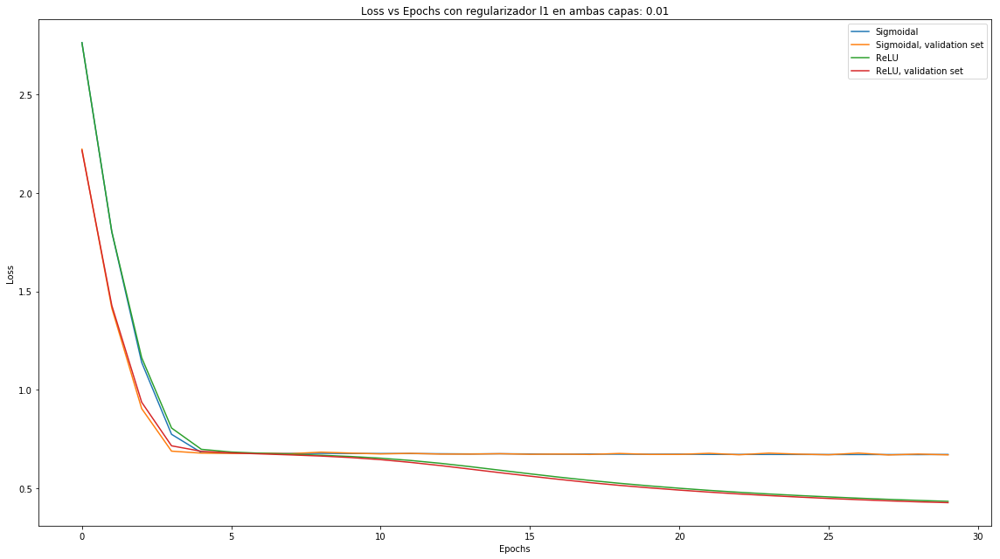

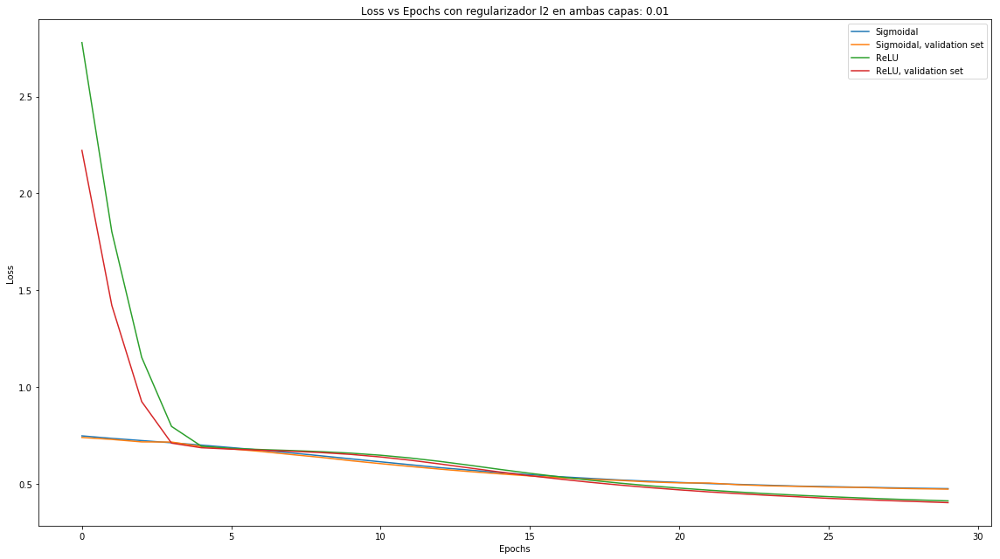

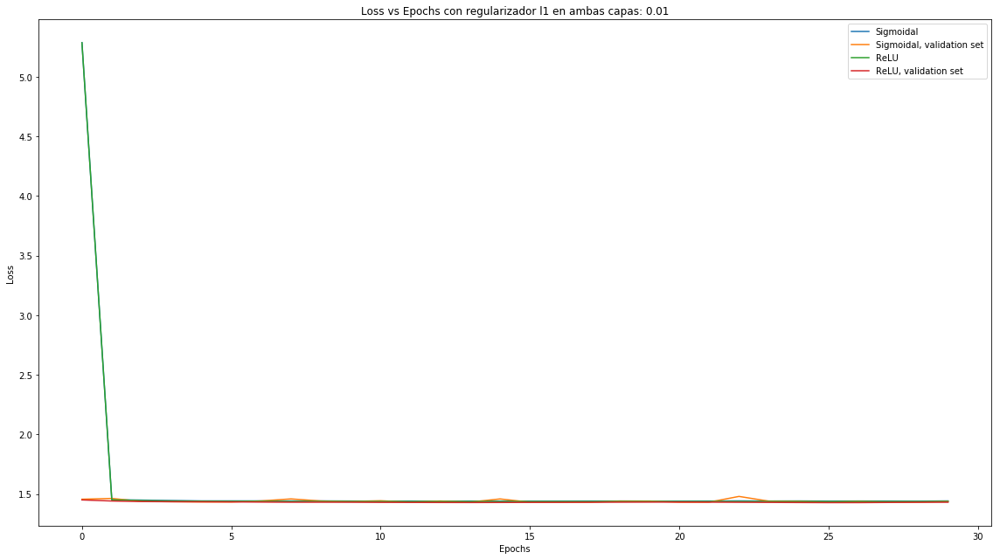

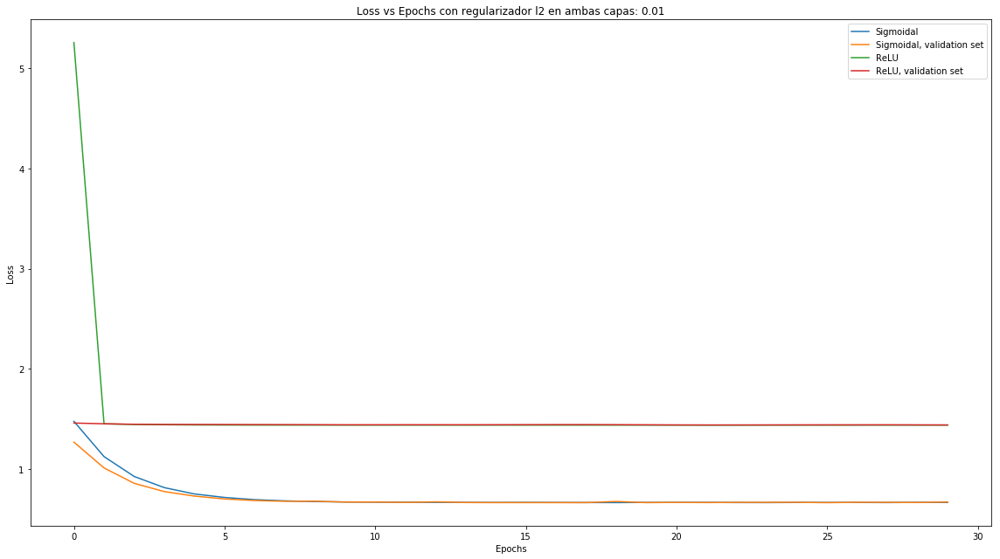

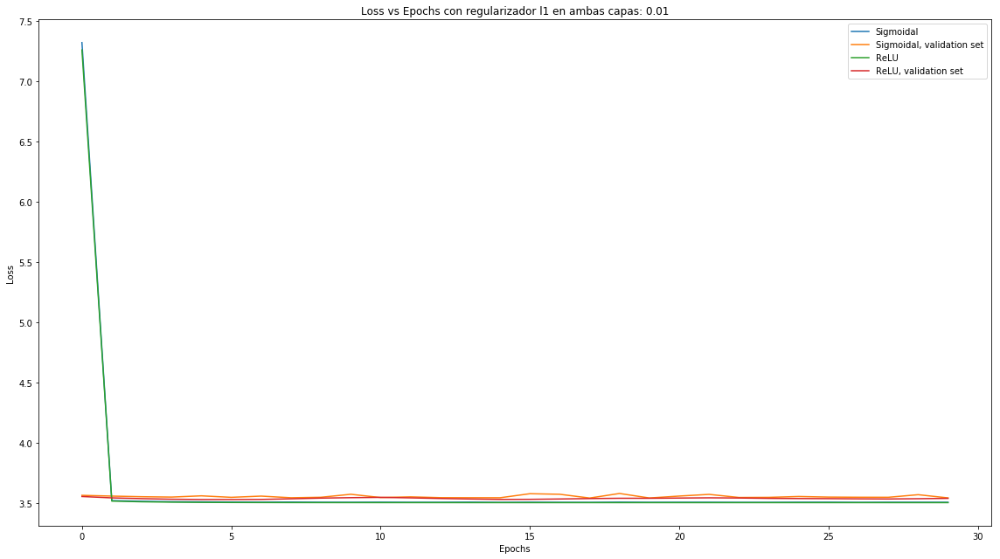

...

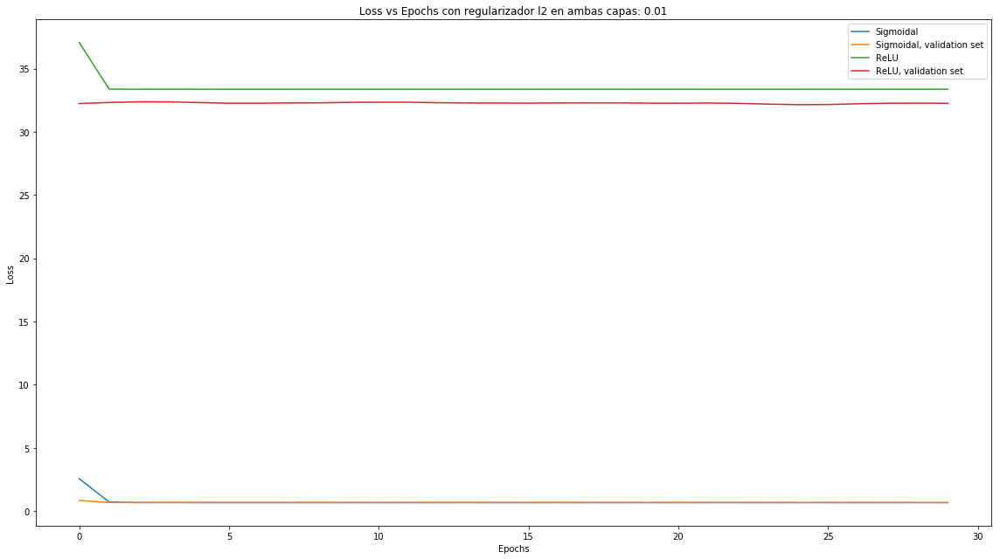

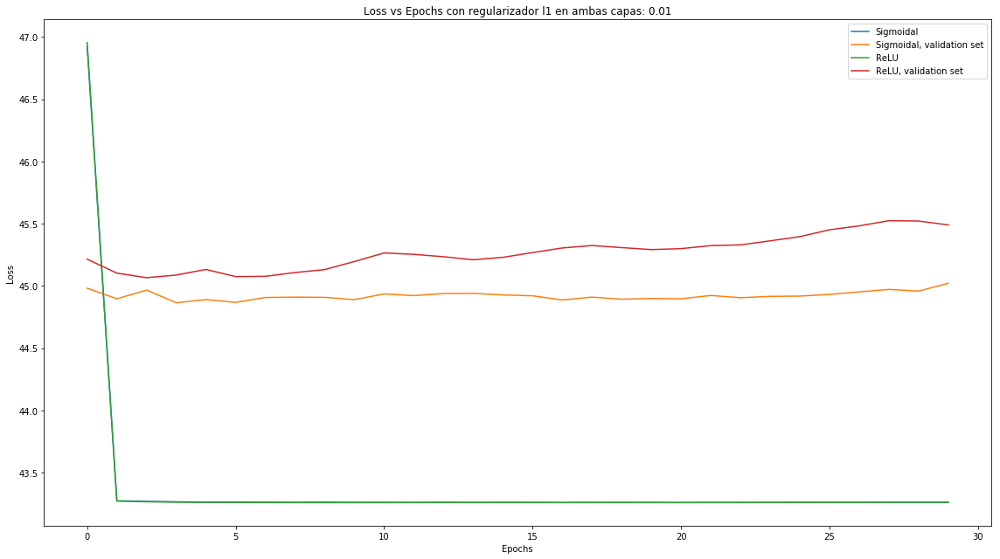

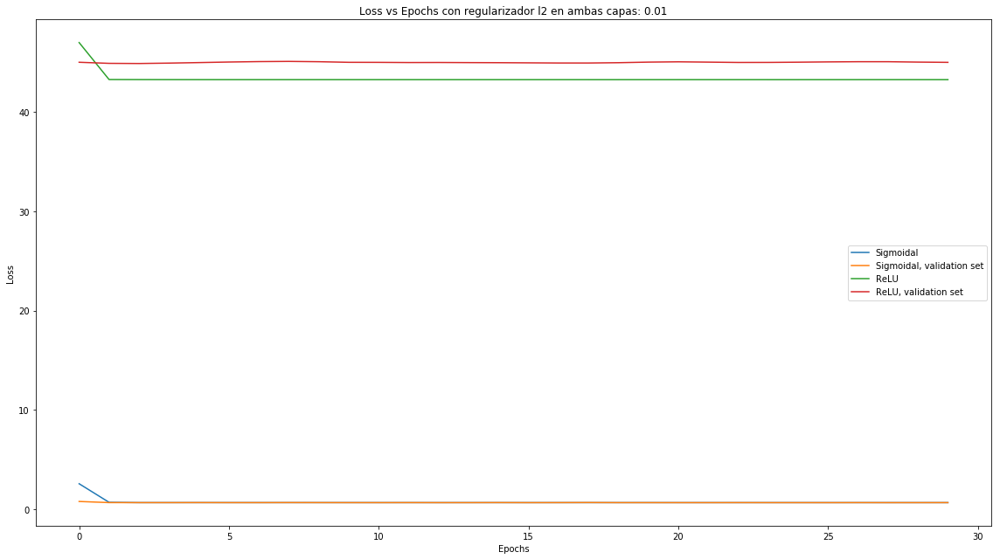

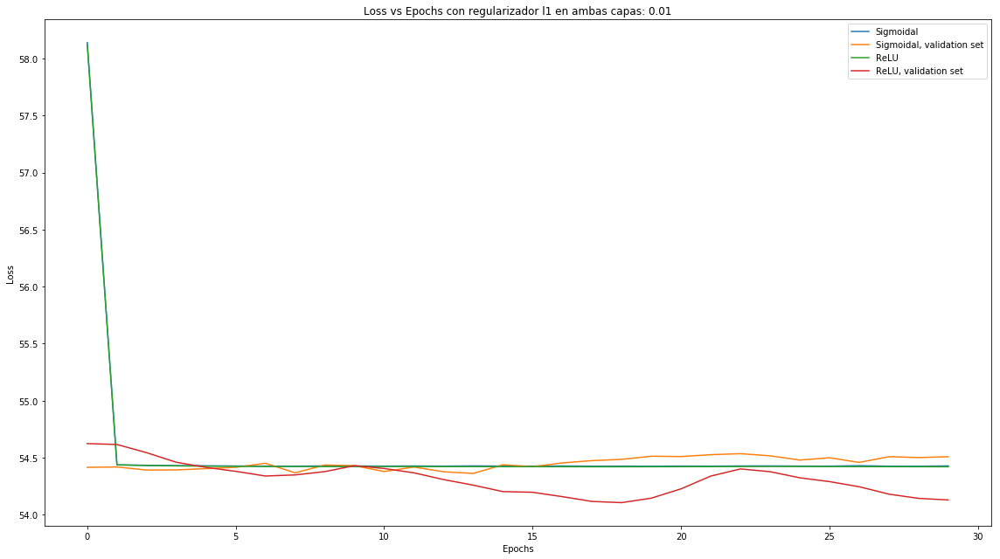

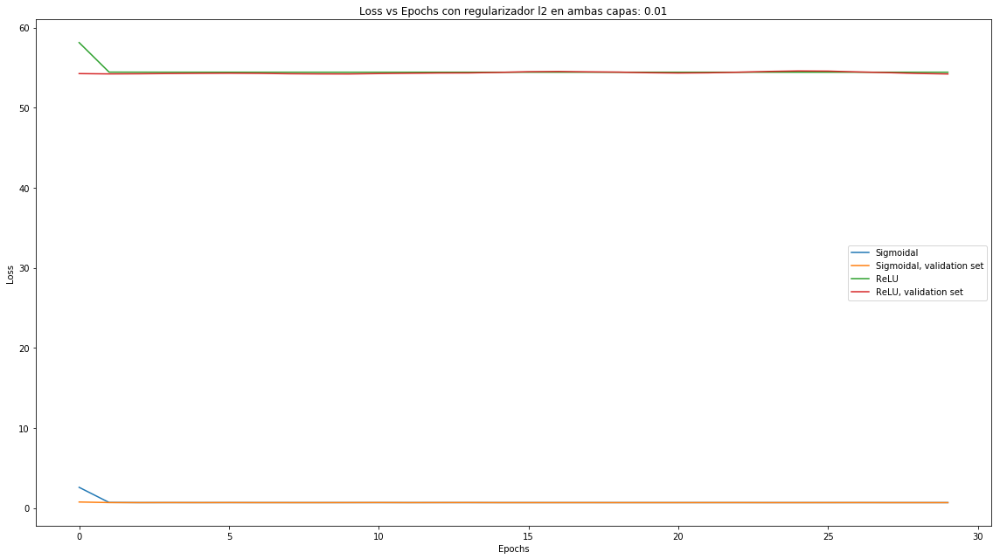

In [0]:
for i in range(n):
  graph(hist2L1[i], hist2L1R[i], 'Loss vs Epochs con regularizador l1 en ambas capas: ', 0.01)
  graph(hist2L2[i], hist2L2R[i], 'Loss vs Epochs con regularizador l2 en ambas capas: ', 0.01)


In [0]:
model1L1R = Sequential()
model1L1R.add(Dense(256,input_dim=X_train_scaled.shape[1],kernel_initializer='uniform',kernel_regularizer=l1(0.01), activation = 'relu'))
model1L1R.add(Dense(1, kernel_initializer='uniform', activation = 'sigmoid'))
model1L1R.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])

model1L2R = Sequential()
model1L2R.add(Dense(256,input_dim=X_train_scaled.shape[1],kernel_initializer='uniform',kernel_regularizer=l2(0.01), activation = 'relu'))
model1L2R.add(Dense(1, kernel_initializer='uniform', activation = 'sigmoid'))
model1L2R.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])

model2L1R = Sequential()
model2L1R.add(Dense(256,input_dim=X_train_scaled.shape[1],kernel_initializer='uniform', activation = 'relu'))
model2L1R.add(Dense(1, kernel_initializer='uniform',kernel_regularizer=l1(0.01), activation = 'sigmoid'))
model2L1R.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])

model2L2R = Sequential()
model2L2R.add(Dense(256,input_dim=X_train_scaled.shape[1],kernel_initializer='uniform', activation = 'relu'))
model2L2R.add(Dense(1, kernel_initializer='uniform',kernel_regularizer=l2(0.01), activation = 'sigmoid'))
model2L2R.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])


model1L1S = Sequential()
model1L1S.add(Dense(256,input_dim=X_train_scaled.shape[1],kernel_initializer='uniform',kernel_regularizer=l1(0.01), activation = 'sigmoid'))
model1L1S.add(Dense(1, kernel_initializer='uniform', activation = 'sigmoid'))
model1L1S.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])

model1L2S = Sequential()
model1L2S.add(Dense(256,input_dim=X_train_scaled.shape[1],kernel_initializer='uniform',kernel_regularizer=l2(0.01), activation = 'sigmoid'))
model1L2S.add(Dense(1, kernel_initializer='uniform', activation = 'sigmoid'))
model1L2S.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])

model2L1S = Sequential()
model2L1S.add(Dense(256,input_dim=X_train_scaled.shape[1],kernel_initializer='uniform', activation = 'sigmoid'))
model2L1S.add(Dense(1, kernel_initializer='uniform',kernel_regularizer=l1(0.01), activation = 'sigmoid'))
model2L1S.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
                    
model2L2S = Sequential()
model2L2S.add(Dense(256,input_dim=X_train_scaled.shape[1],kernel_initializer='uniform', activation = 'sigmoid'))
model2L2S.add(Dense(1, kernel_initializer='uniform',kernel_regularizer=l2(0.01), activation = 'sigmoid'))
model2L2S.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])

R1L1 = model1L1R.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))
R2L1 = model2L1R.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))
R1L2 = model1L2R.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))
R2L2 = model2L2R.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

S1L1 = model1L1S.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))
S1L2 = model1L2S.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))
S2L1 = model2L1S.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))
S2L2 = model2L2S.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

Train on 3753 samples, validate on 939 samples
Epoch 1/30
3753/3753 [==============================] - 11s 3ms/step - loss: 2.7555 - acc: 0.6208 - val_loss: 2.2067 - val_acc: 0.6219
Epoch 2/30
3753/3753 [==============================] - 1s 137us/step - loss: 1.7817 - acc: 0.6227 - val_loss: 1.3973 - val_acc: 0.6230
Epoch 3/30
3753/3753 [==============================] - 0s 133us/step - loss: 1.1262 - acc: 0.6232 - val_loss: 0.8980 - val_acc: 0.6219
Epoch 4/30
3753/3753 [==============================] - 1s 137us/step - loss: 0.7727 - acc: 0.6214 - val_loss: 0.6876 - val_acc: 0.6219
Epoch 5/30
3753/3753 [==============================] - 1s 143us/step - loss: 0.6672 - acc: 0.6214 - val_loss: 0.6534 - val_acc: 0.6219
Epoch 6/30
3753/3753 [==============================] - 1s 140us/step - loss: 0.6482 - acc: 0.6227 - val_loss: 0.6407 - val_acc: 0.6262
Epoch 7/30
3753/3753 [==============================] - 1s 134us/step - loss: 0.6361 - acc: 0.6352 - val_loss: 0.6268 - val_acc: 0.6454
Ep

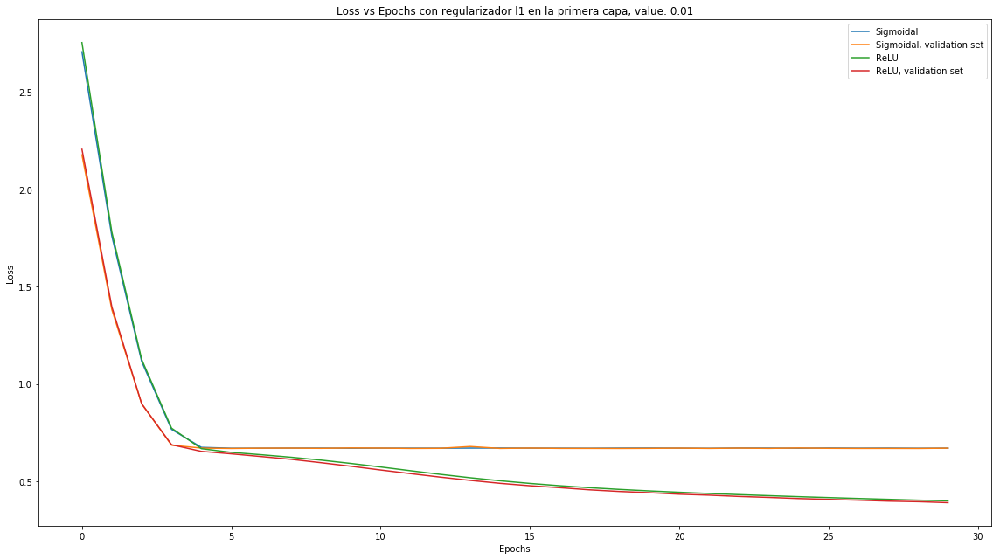

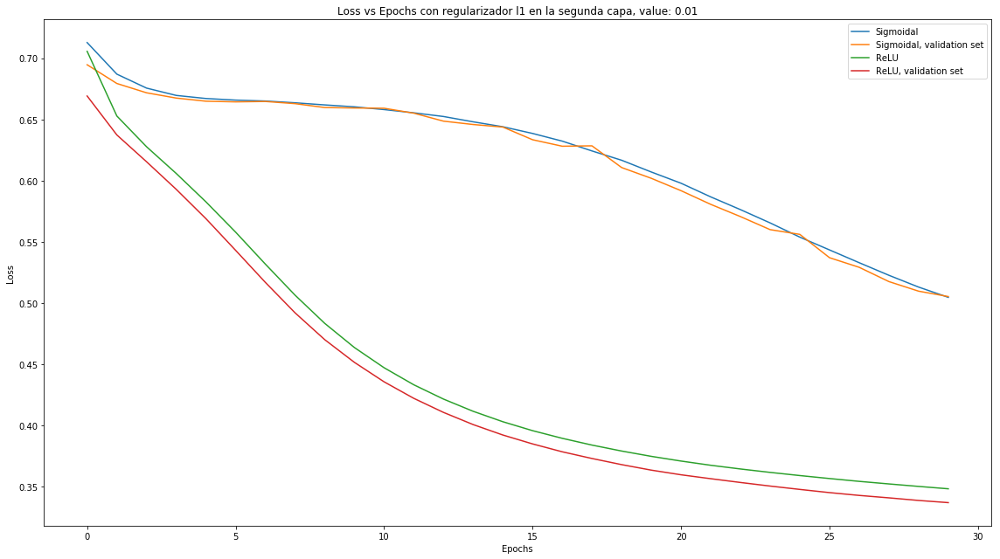

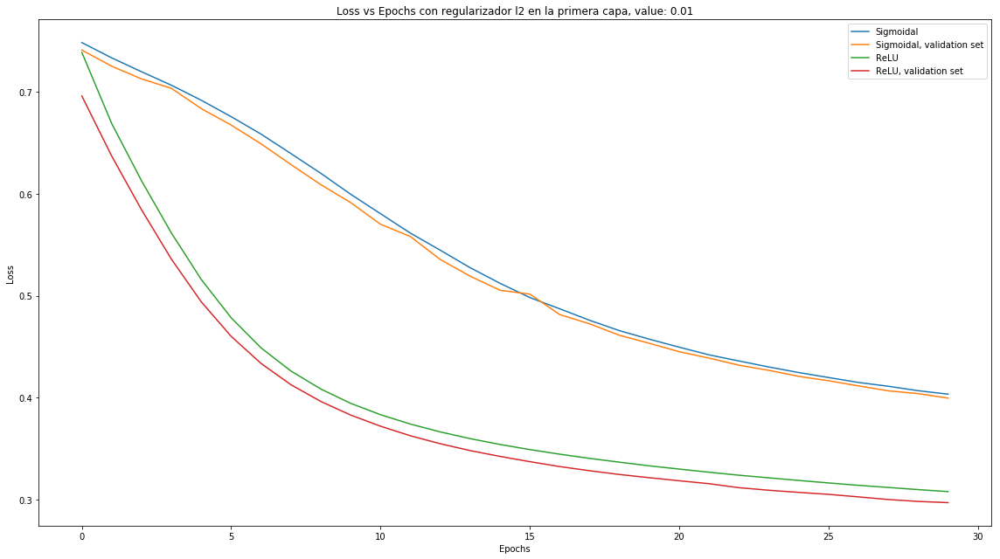

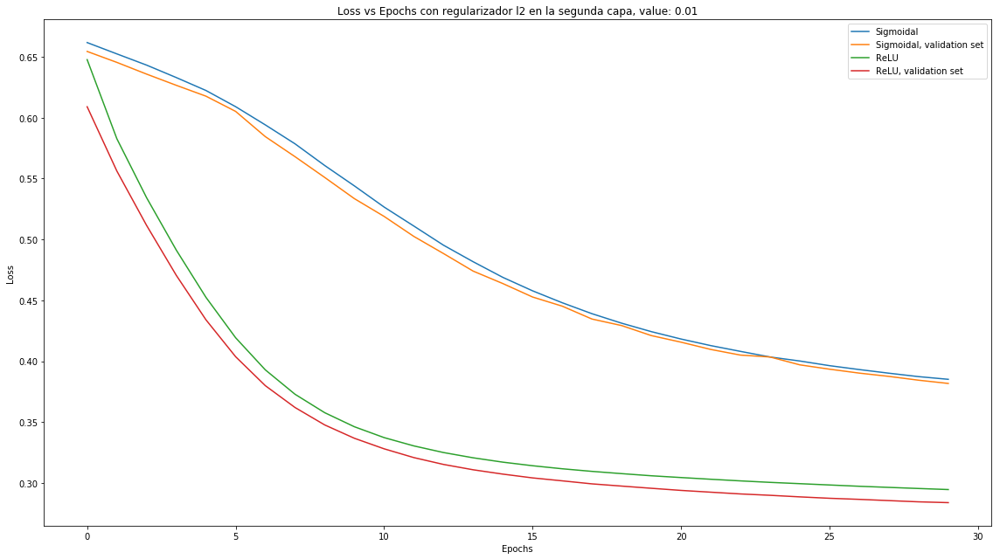

In [0]:
graph(S1L1, R1L1, 'Loss vs Epochs con regularizador l1 en la primera capa, value: ', 0.01)
graph(S2L1, R2L1, 'Loss vs Epochs con regularizador l1 en la segunda capa, value: ', 0.01)
graph(S1L2, R1L2, 'Loss vs Epochs con regularizador l2 en la primera capa, value: ', 0.01)
graph(S2L2, R2L2, 'Loss vs Epochs con regularizador l2 en la segunda capa, value: ', 0.01)

# i) Optimizadores clásicos
De este experimento se ve que al implementar regularizador l1 en ambas capas no se tiene mucho efecto con un parámetro pequeño, pero, a medida que éste aumenta, el error de ambas funciones aumenta notoriamente, hasta errores cerca de 50.

Por otro lado el regularizador l2 tiene mejores efectos en ambas redes en un inicio, pero con valores del parámetro más altos, se tiene que la función sigmoidal se queda estancada, mientras que la red que implementa ReLU mantiene errores muy pequeños.

Mientras que para aplicar un regularizador a la vez, se tiene que no es muy relevante donde aplicarlo, a excepción de l1 aplicado a la primera capa, con lo cual se observa un aumento en la loss de ambas redes

> j) Elija uno de los dos modelos definidos en c) y experimente con modificar la función objetivo, que hasta ahora se lo hemos dejado a keras definir la típica *binary cross entropy*, en pos de algún objetivo que decida plantearse, por ejemplo aumentar la velocidad de convergencia (reducir más rápida la función objetivo), obtener mejor desempeño en *f1 score* u algún otro.  
*Se dejan algunos ejemplos*
1. Focal loss [[4]](#refs)
2. Cross entropy + Min entropy
3. Cross entropy + Max entropy
4. Kullback Leibler (KL) ó Jensen Shannon (JS) divergence [[5]](#refs)  
5. Weighted Cross entropy  
```python
from keras import backend as K
def custom_loss(value): #ejemplo
    def loss(y_true, y_pred):
        y_true = K.clip(y_true, K.epsilon(), 1) 
        y_pred = K.clip(y_pred, K.epsilon(), 1)
        return K.sum(y_true * K.log(y_true / y_pred), axis=-1) #KL-divergence
        ...#return value*K.mean(K.square(y_pred - y_true), axis=-1) #MSE
    return loss
model.compile(loss=custom_loss(1),optimizer=opt) #example of use
```

In [0]:
def MakeModel(X, loss, lr = 0.01):
  model = Sequential()
  model.add(Dense(256, input_dim=X.shape[1], kernel_initializer='uniform',activation='relu'))
  model.add(Dense(1, kernel_initializer='uniform',activation='sigmoid')) #this should be mantained
  model.compile(optimizer=SGD(lr=lr),loss=loss,metrics=["accuracy"])
  return model

modelDef = MakeModel(X_train_scaled, 'binary_crossentropy')
default = modelDef.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

modelMAE = MakeModel(X_train_scaled, 'mean_absolute_error')
MAE = modelMAE.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

modelMSE = MakeModel(X_train_scaled, 'mean_squared_error')
MSE = modelMSE.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

modelLog = MakeModel(X_train_scaled, 'mean_squared_logarithmic_error')
Log = modelLog.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

modelSH = MakeModel(X_train_scaled, 'squared_hinge')
SH = modelSH.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

Train on 3753 samples, validate on 939 samples
Epoch 1/30
3753/3753 [==============================] - 12s 3ms/step - loss: 0.6356 - acc: 0.6248 - val_loss: 0.6014 - val_acc: 0.6390
Epoch 2/30
3753/3753 [==============================] - 1s 147us/step - loss: 0.5756 - acc: 0.6725 - val_loss: 0.5488 - val_acc: 0.7167
Epoch 3/30
3753/3753 [==============================] - 1s 142us/step - loss: 0.5247 - acc: 0.7623 - val_loss: 0.4998 - val_acc: 0.7977
Epoch 4/30
3753/3753 [==============================] - 1s 142us/step - loss: 0.4769 - acc: 0.8175 - val_loss: 0.4535 - val_acc: 0.8339
Epoch 5/30
3753/3753 [==============================] - 1s 143us/step - loss: 0.4331 - acc: 0.8481 - val_loss: 0.4125 - val_acc: 0.8498
Epoch 6/30
3753/3753 [==============================] - 1s 140us/step - loss: 0.3960 - acc: 0.8641 - val_loss: 0.3786 - val_acc: 0.8647
Epoch 7/30
3753/3753 [==============================] - 1s 144us/step - loss: 0.3665 - acc: 0.8694 - val_loss: 0.3519 - val_acc: 0.8722
Ep

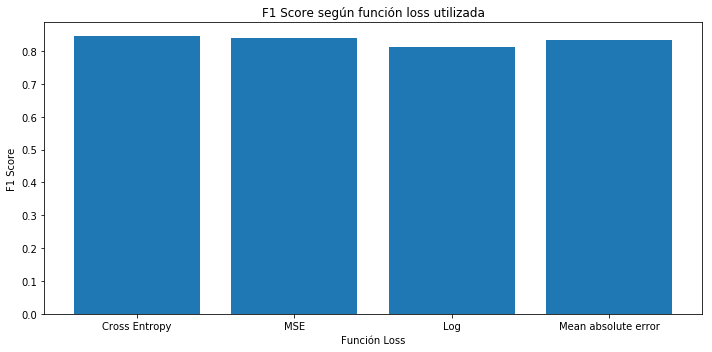

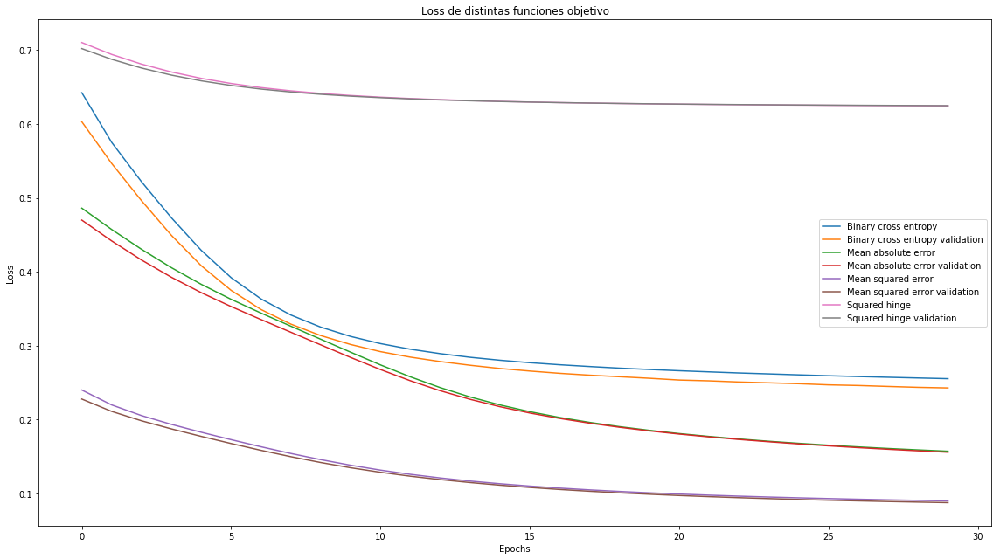

In [0]:
'''F1scores = []
F1scores.append( f1_score(y_test, modelDef.predict_classes(X_test_scaled), average='weighted') )
F1scores.append( f1_score(y_test, modelMSE.predict_classes(X_test_scaled), average='weighted') )
F1scores.append( f1_score(y_test, modelLog.predict_classes(X_test_scaled), average='weighted') )
F1scores.append( f1_score(y_test, modelMAE.predict_classes(X_test_scaled), average='weighted') )
names = ['Cross Entropy', 'MSE', 'Log', 'Mean absolute error']


fig, ax = plt.subplots(figsize=(10,5))
ax.bar(names, F1scores)

ax.set_xlabel('Función Loss')
ax.set_ylabel('F1 Score')
ax.set_title(r'F1 Score según función loss utilizada')
fig.tight_layout()
plt.show()'''

histD = default.history['loss']
histMa= MAE.history['loss']
histMs = MSE.history['loss']
histS = SH.history['loss']
histDV = default.history['val_loss']
histMaV= MAE.history['val_loss']
histMsV = MSE.history['val_loss']
histSV = SH.history['val_loss']

fig, ax = plt.subplots(figsize=tamaño)
ax.plot(histD, label = "Binary cross entropy")
ax.plot(histDV, label = "Binary cross entropy validation")
ax.plot(histMa, label = "Mean absolute error")
ax.plot(histMaV, label = "Mean absolute error validation")
ax.plot(histMs, label = "Mean squared error")
ax.plot(histMsV, label = "Mean squared error validation")
ax.plot(histS, label = "Squared hinge")
ax.plot(histSV, label = "Squared hinge validation")
plt.legend()

ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title('Loss de distintas funciones objetivo')
fig.tight_layout()
plt.show()

# j) Funciones objetivo
De los valores obtenidos, se puede apreciar que la función Cross entropy es la que presenta mejor F1 score, seguida por la Mean-Squared Error. Esto puede que se deba a la naturaleza de la función Cross Entropy, la cual mide la distancia entre la distribución de probabilidad real (cómo se distribuyen las clases en los datos) y la distribución que entrega la red (La distribución según la red), por eso es generalmente utilizada como base para problemas de clasificación binaria, mientras que Mean Squared Error, si bien es una de las "Loss function" mas conocida, no es buena en la literatura, eso es debido a que el mean squared error solamente serviría para un problema de regresión, los cuales no son tan comunes en la literatura de las redes neuronales(de hecho para esos casos es mejor usar otra función de perdida). Cross Entropy es capaz de entregar una probabilidad en rango 0 a 1, mientras que para que el Mean Squared Error haga esto, este necesita ser reajustado para mantener un rango probabilístico.


<a id="segundo"></a>

## 2. Deep Networks
---
Las *deep network*, o lo que hoy en día se conoce como *deep learning*, hace referencia a modelos de redes neuronales estructurados con muchas capas, es decir, el cómputo de la función final es la composición una gran cantidad de funciones ( $f^{(n)} = f^{(n-1)} \circ f^{(n-2)} \circ \cdots \circ f^{(2)} \circ f^{(1)} $ con $n \gg 0$ ).  
Este tipo de redes neuronales tiene una gran cantidad de parámetros, creciendo exponencialmente por capa con las redes *feed forward*, siendo bastante difíciles de entrenar comparadas con una red poco profunda, esto es debido a que requieren una gran cantidad de datos para ajustar correctamente todos esos parámetros. Pero entonces ¿Cuál es el beneficio que tienen este tipo de redes? ¿Qué ganancias trae el añadir capas a una arquitectura de una red neuronal?   Y luego, lo más importante ¿Cómo entrenamos este tipo de redes?

<img src="http://neuralnetworksanddeeplearning.com/images/tikz36.png" title="Title text" width="80%" height="20%" />



En esta sección se estudiará la complejidad de entrenar redes neuronales profundas, mediante la visualización de los gradientes de los pesos en cada capa, el cómo varía mientras se hace el *backpropagation* hacia las primeras capas de la red. Además del efecto del cambio de funciones de activación.

> a) En esta primera instancia se trabajará con una red *shallow* (poco profunda) con una gran cantidad de neuronas situadas en una capa, inicializada con pesos uniforme. Visualice el gradiente de la función de pérdida (*loss*) para el conjunto de entrenamiento (promedio del gradiente de cada dato) respecto a los pesos en las distintas capas, para esto se le pedirá el cálculo del gradiente para una capa mediante la función de *gradients* (__[link](https://www.tensorflow.org/api_docs/python/tf/keras/backend/gradients)__) en el *backend* de Keras, otra opción es a través de un __[monitor](https://keras.io/callbacks/#tensorboard)__. Deberá generar un **histograma** para todos los pesos de cada capa antes y despues del entrenamiento con 50 *epochs*. Comente.
```python
model = Sequential()
model.add(Dense(1280, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(1, kernel_initializer='uniform',activation='sigmoid'))
compilar
- ###calculate gradients
from keras import backend as K
import tensorflow as tf
loss = keras.losses.mean_squared_error(model.output,y_train_scaled)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors) #We can now calculate the gradients.
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled.values})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]
```

In [0]:
model = Sequential()
model.add(Dense(1280, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(1, kernel_initializer='uniform',activation='sigmoid'))

epochs = 50

loss = keras.losses.mean_squared_error(model.output,y_train)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors)
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))



evaluated_gradientsF = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]

Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 1s 185us/step - loss: 0.6507 - acc: 0.6142 - val_loss: 0.6931 - val_acc: 0.6219
Epoch 2/50
3753/3753 [==============================] - 0s 82us/step - loss: 0.6044 - acc: 0.6608 - val_loss: 0.5835 - val_acc: 0.8126
Epoch 3/50
3753/3753 [==============================] - 0s 81us/step - loss: 0.5695 - acc: 0.7034 - val_loss: 0.5583 - val_acc: 0.6294
Epoch 4/50
3753/3753 [==============================] - 0s 83us/step - loss: 0.5392 - acc: 0.7325 - val_loss: 0.5372 - val_acc: 0.8094
Epoch 5/50
3753/3753 [==============================] - 0s 86us/step - loss: 0.5102 - acc: 0.7703 - val_loss: 0.5295 - val_acc: 0.6496
Epoch 6/50
3753/3753 [==============================] - 0s 89us/step - loss: 0.4842 - acc: 0.7895 - val_loss: 0.4595 - val_acc: 0.7934
Epoch 7/50
3753/3753 [==============================] - 0s 92us/step - loss: 0.4622 - acc: 0.8052 - val_loss: 0.4397 - val_acc: 0.8424
Epoch 8

In [0]:
print(len(evaluated_gradients))
print(evaluated_gradients[1].shape)
print(len(evaluated_gradients[0][0]))

4
(1280,)
1280


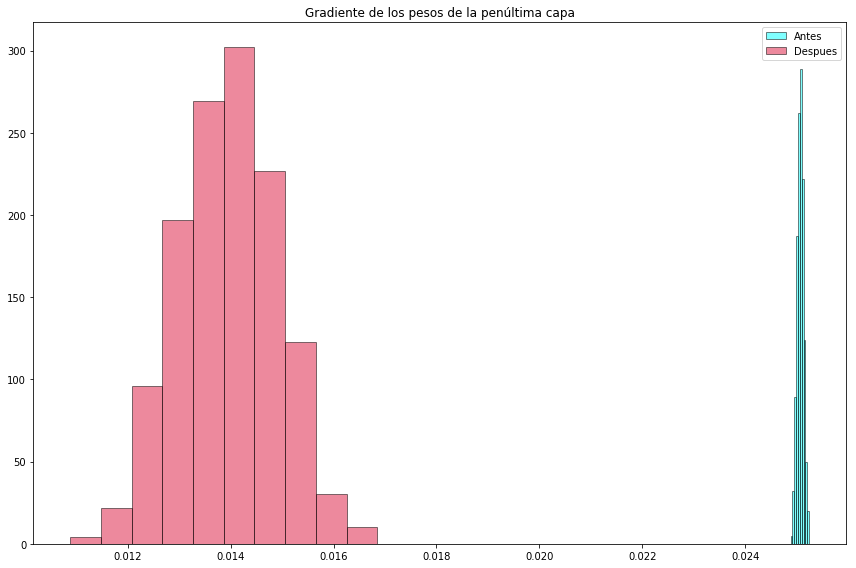

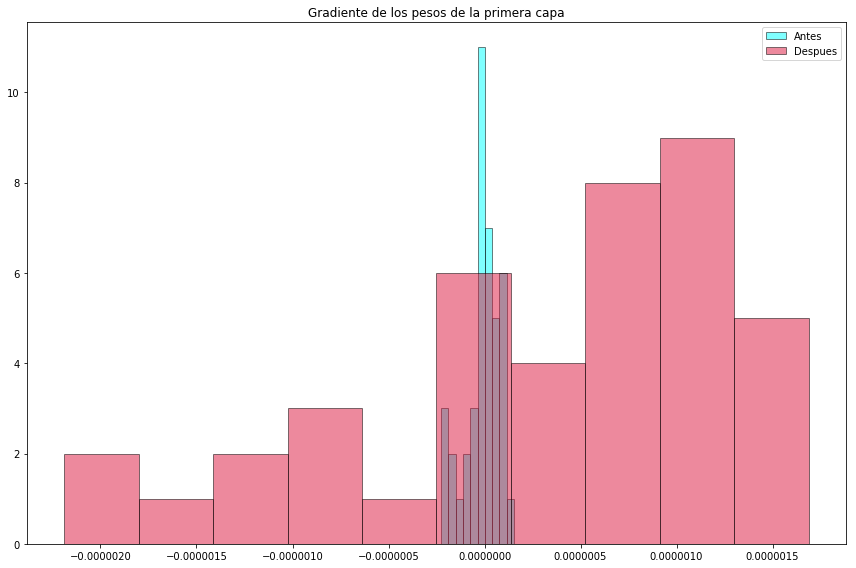

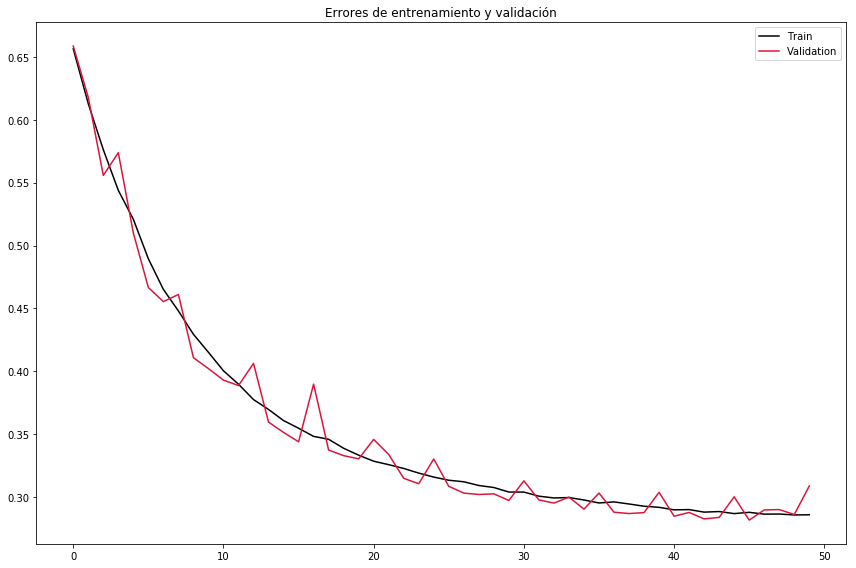

In [0]:
def hist(X, Y, texto):
  plt.style.use('seaborn-deep')
  colors = ['b','r']
  fig, ax1 = plt.subplots(figsize=(12,8))
  ax1.hist(X, edgecolor='black', alpha=0.5, label=['Antes'], color = "cyan")
  ax1.hist(Y, edgecolor='black', alpha=0.5, label=['Despues'], color = "crimson")
  plt.title(texto)
  plt.legend(loc='upper right')
  plt.tight_layout()
  plt.show()
  
def plotError(train, val, texto):
  plt.style.use('seaborn-deep')
  fig, ax1 = plt.subplots(figsize=(12,8))
  ax1.plot(train, label='Train', color = "black")
  ax1.plot(val, label='Validation', color = "crimson")
  plt.title(texto)
  plt.legend(loc='upper right')
  plt.tight_layout()
  plt.show()

def datosNormalizar(X, Y):
  X0 = []
  X1 = []
  for i in range(len(X)):
    X0.append(np.median(X[i]))
    X1.append(np.median(Y[i]))
  return X0, X1

def graficar(evaluated_gradients):
  init = tf.global_variables_initializer()
  with tf.Session() as sess:
    writer = tf.summary.FileWriter("/tmp")
    sess.run(init)
    for i in range(0, len(evaluated_gradients), 2):
      tensor_from_list = tf.convert_to_tensor(evaluated_gradients[i])
      histogram_summary = tf.summary.histogram("Hist/capa{0}".format(i), tensor_from_list)
      summary1 = sess.run(histogram_summary)
      for step in range(len(evaluated_gradients[i])):
        writer.add_summary(summary1, step)

        

X, Y = (evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Gradiente de los pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Gradiente de los pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

Para poder obtener los histogramas de las capas de entrada y "salida" se utilizó la mediana para poder obtener un comportamiento estimado sobre el conjunto de pesos obtenidos en la red antes y despues de los *epoch*, esta métrica podría jugar en contra en ciertos casos pero aun así fue considerada como la mejor estimadora para el plot.

Se puede notar que existe una convergencia a valores 0 para las capas de salida luego de los *epoch*, esto ocurre por que se tiene SGD para el entrenamiento y, por lo tanto, la gradiente a medida que aumentan los *epoch* disminuye de la forma que se especifica en las capas.

> b) Vuelva a generar los histogramas para los gradientes de los pesos de cada capa antes y después del entrenamiento pero ahora entrenando una red con los mimos pesos distribuidos a través de muchas más capas (red profunda de 6 capas), 5 capas escondidas y 1 de salida. Utilice el inicializador de pesos *uniform* el cual inicializa mediante una distribución uniforme entre $-1/\sqrt{N}$ y $1/\sqrt{N}$ para cada capa, con $N$ el número de neuronas de la capa anterior. Por simplicidad visualice las 3-4 primeras capas de la red. Comente si observa el efecto del *gradiente desvaneciente* antes y/o después de entrenar. ¿Qué sucede con la *loss*? ¿El modelo logra aprender?
```python
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(1, kernel_initializer='uniform',activation='sigmoid'))
sgd = SGD(lr=0.01)
compilar
```

In [0]:
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(1, kernel_initializer='uniform',activation='sigmoid'))

loss = keras.losses.mean_squared_error(model.output,y_train)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors)
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]

Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 1s 250us/step - loss: 0.6643 - acc: 0.6214 - val_loss: 0.6638 - val_acc: 0.6219
Epoch 2/50
3753/3753 [==============================] - 0s 115us/step - loss: 0.6654 - acc: 0.6214 - val_loss: 0.6687 - val_acc: 0.6219
Epoch 3/50
3753/3753 [==============================] - 0s 114us/step - loss: 0.6655 - acc: 0.6214 - val_loss: 0.6647 - val_acc: 0.6219
Epoch 4/50
3753/3753 [==============================] - 0s 117us/step - loss: 0.6649 - acc: 0.6214 - val_loss: 0.6631 - val_acc: 0.6219
Epoch 5/50
3753/3753 [==============================] - 0s 114us/step - loss: 0.6647 - acc: 0.6214 - val_loss: 0.6662 - val_acc: 0.6219
Epoch 6/50
3753/3753 [==============================] - 0s 113us/step - loss: 0.6655 - acc: 0.6214 - val_loss: 0.6636 - val_acc: 0.6219
Epoch 7/50
3753/3753 [==============================] - 0s 118us/step - loss: 0.6650 - acc: 0.6214 - val_loss: 0.6687 - val_acc: 0.6219
E

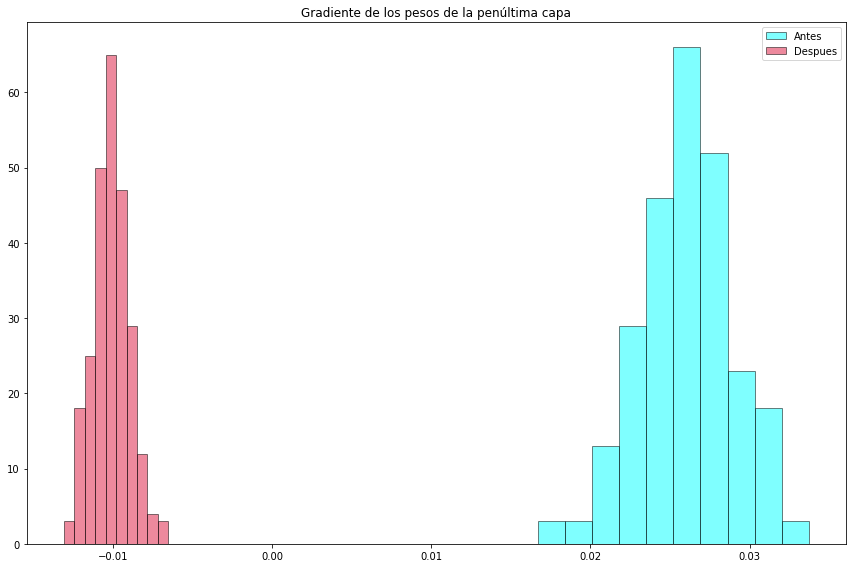

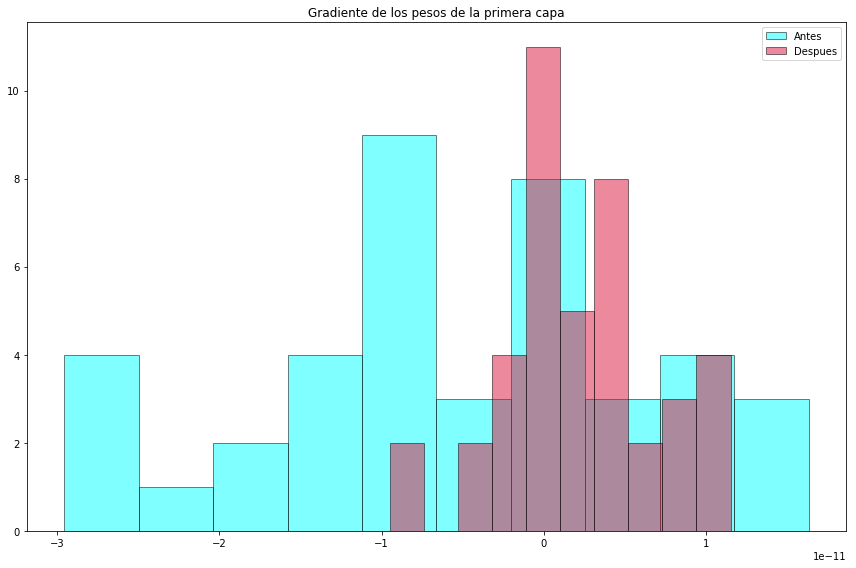

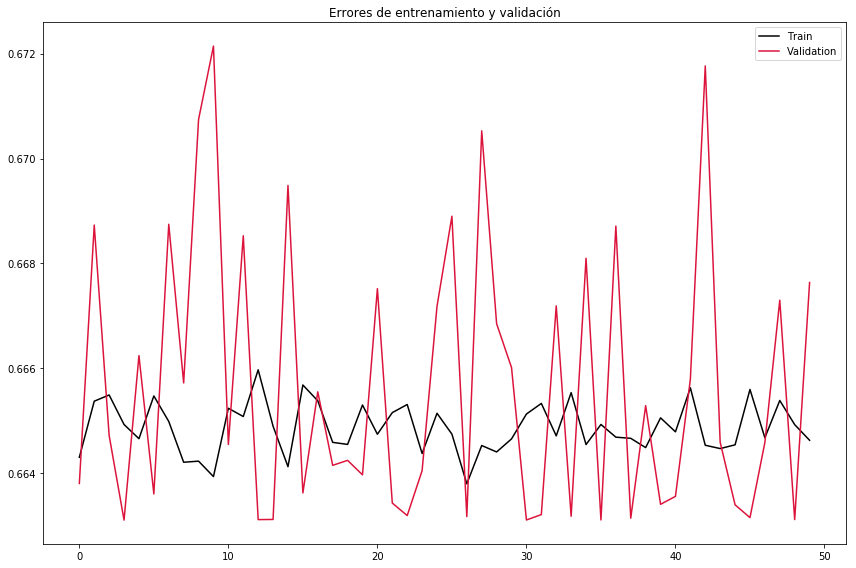

In [0]:
X, Y = (evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Gradiente de los pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Gradiente de los pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

Se observa que despues de las *epoch* se tiene que los valores tratan de converger a 0, cosa que se considera una disminución de la gradiente al momento del *Backpropagation*. En la primera capa se puede notar más evidente que en la capa de "salida".

La loss para esta red se mantuvo constante en valores 0.664 y 0.666 para el entrenamiento, por otro lado, el error para la validación tuvo un intervalo de  0.663 y 0.673 aprox.

Dado la loss de la red, no se asegura un aprendizaje. En efecto, se sabe que los datos son desbalanceados y quizá por esa razón se obtiene un valor de 0.6. Este valor se puede pensar como una loss para datos aleatorios donde un resultado esperado es de 0.5, cosa que no está muy lejos de lo obtenido.

> c) Vuelva a generar los histogramas para los gradientes de los pesos de cada capa antes y después del entrenamiento, pero ahora entrenando la red profunda con el inicializador de Glorot [[6]](#refs), es decir, una distribución uniforme entre -$\sqrt{6/(N_{in}+N_{out})}$  y $\sqrt{6/(N_{in}+N_{out})}$ . Por simplicidad visualice las 3-4 primeras capas de la red. Comente si el efecto del *gradiente desvaneciente* se amortigua antes y/o después de entrenar. ¿Qué sucede ahora con la *loss*? ¿El modelo logra aprender?
```python
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='glorot_uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='glorot_uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='glorot_uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='glorot_uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='glorot_uniform',activation='sigmoid'))
model.add(Dense(1, kernel_initializer='glorot_uniform',activation='sigmoid'))
sgd = SGD(lr=0.01)
compilar
```

In [0]:
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='glorot_uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='glorot_uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='glorot_uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='glorot_uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='glorot_uniform',activation='sigmoid'))
model.add(Dense(1, kernel_initializer='glorot_uniform',activation='sigmoid'))

loss = keras.losses.mean_squared_error(model.output,y_train)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors)
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]

Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 1s 215us/step - loss: 0.6675 - acc: 0.6134 - val_loss: 0.6633 - val_acc: 0.6219
Epoch 2/50
3753/3753 [==============================] - 0s 101us/step - loss: 0.6651 - acc: 0.6214 - val_loss: 0.6634 - val_acc: 0.6219
Epoch 3/50
3753/3753 [==============================] - 0s 99us/step - loss: 0.6647 - acc: 0.6214 - val_loss: 0.6670 - val_acc: 0.6219
Epoch 4/50
3753/3753 [==============================] - 0s 98us/step - loss: 0.6654 - acc: 0.6214 - val_loss: 0.6649 - val_acc: 0.6219
Epoch 5/50
3753/3753 [==============================] - 0s 103us/step - loss: 0.6651 - acc: 0.6214 - val_loss: 0.6641 - val_acc: 0.6219
Epoch 6/50
3753/3753 [==============================] - 0s 99us/step - loss: 0.6646 - acc: 0.6214 - val_loss: 0.6683 - val_acc: 0.6219
Epoch 7/50
3753/3753 [==============================] - 0s 101us/step - loss: 0.6658 - acc: 0.6214 - val_loss: 0.6633 - val_acc: 0.6219
Epoc

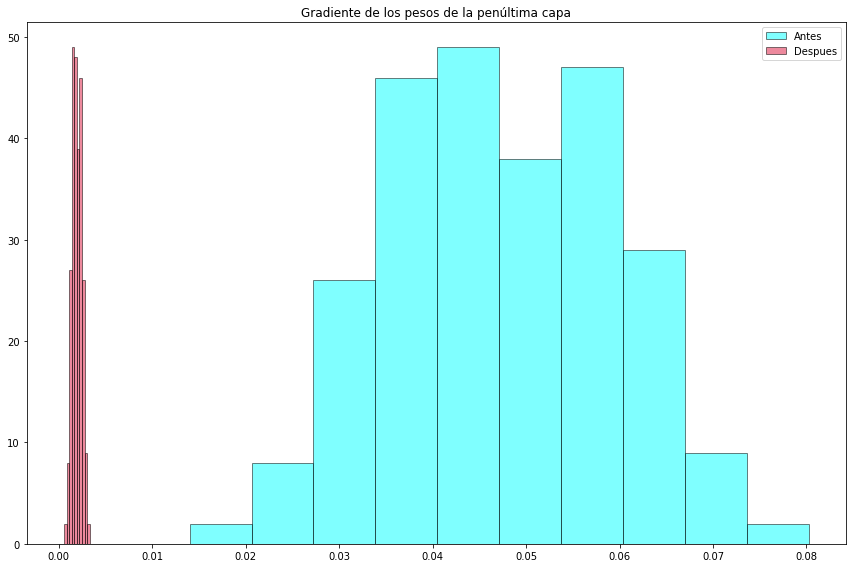

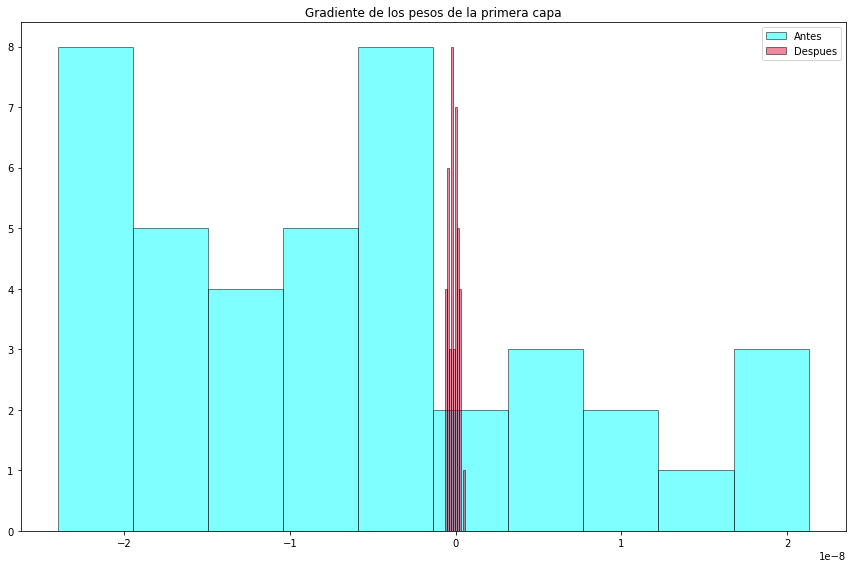

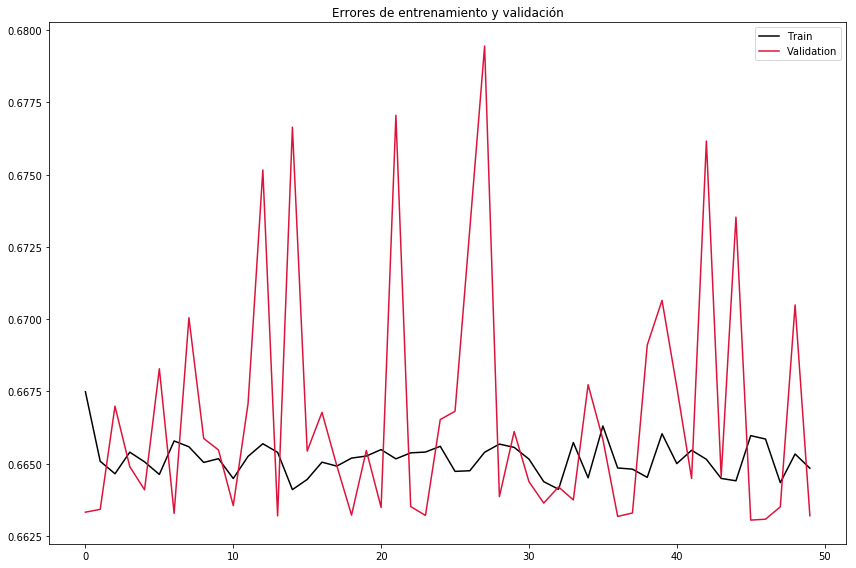

In [0]:
X, Y = (evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Gradiente de los pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Gradiente de los pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

Al igual que lo mencionado anteriormente, el error tiende a estar entre los intervalos de 0.66 y 0.67 donde se obtuvieron mas peaks en el error de validación que en lo testeado en el ítem anterior.

Ahora se puede notar con más claridad que el entrenamiento luego de los *epoch* están convergiendo más a 0. Dado que este valor se está acercando mucho al 0 se puede entender que la gradiente está desvaneciendo tal como se podría esperar.

El aprendizaje de la red sigue el mismo razonamiento que el anterior, es decir, la red está prediciendo de forma "a la suerte".

> d) Vuelva a repetir la experimentación ahora cambiando la función de activación por ReLU, es decir, deberá visualizar los gradientes de los pesos de cada capa antes y después del entrenamiento, con inicialización *uniform*, y comparar con la inicialización de He [[7]](#refs), es decir, una distribución uniforme entre -$\sqrt{6/N_{in}}$ y $\sqrt{6/N_{in}} $. Comente si ocurre el mismo fenómeno anterior (para función sigmoidal) sobre el efecto del *gradiente desvaneciente* para la función ReLU. Explique la importancia de la inicialización de los pesos dependiendo de la arquitectura. 
```python
...
model.add(Dense(nh, kernel_initializer='uniform',activation='relu')) #uniform
...
or
...
model.add(Dense(nh, kernel_initializer='he_uniform',activation='relu')) #he
...
```

In [0]:
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='uniform',activation='relu'))
model.add(Dense(1, kernel_initializer='uniform',activation='sigmoid'))

loss = keras.losses.mean_squared_error(model.output,y_train)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors) #We can now calculate the gradients.
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]

Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 2s 481us/step - loss: 0.6856 - acc: 0.6184 - val_loss: 0.6789 - val_acc: 0.6219
Epoch 2/50
3753/3753 [==============================] - 0s 106us/step - loss: 0.6751 - acc: 0.6214 - val_loss: 0.6714 - val_acc: 0.6219
Epoch 3/50
3753/3753 [==============================] - 0s 107us/step - loss: 0.6695 - acc: 0.6214 - val_loss: 0.6674 - val_acc: 0.6219
Epoch 4/50
3753/3753 [==============================] - 0s 105us/step - loss: 0.6665 - acc: 0.6214 - val_loss: 0.6653 - val_acc: 0.6219
Epoch 5/50
3753/3753 [==============================] - 0s 105us/step - loss: 0.6649 - acc: 0.6214 - val_loss: 0.6641 - val_acc: 0.6219
Epoch 6/50
3753/3753 [==============================] - 0s 107us/step - loss: 0.6640 - acc: 0.6214 - val_loss: 0.6634 - val_acc: 0.6219
Epoch 7/50
3753/3753 [==============================] - 0s 104us/step - loss: 0.6635 - acc: 0.6214 - val_loss: 0.6630 - val_acc: 0.6219
E

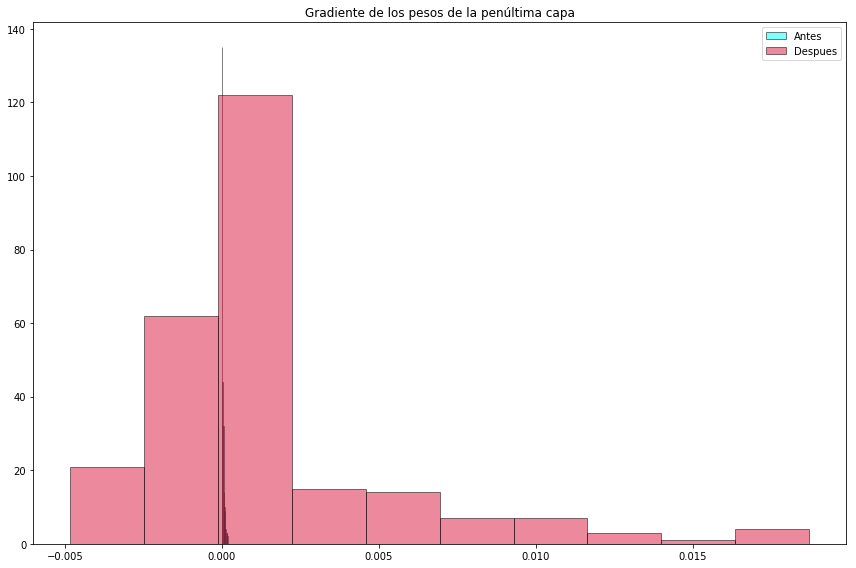

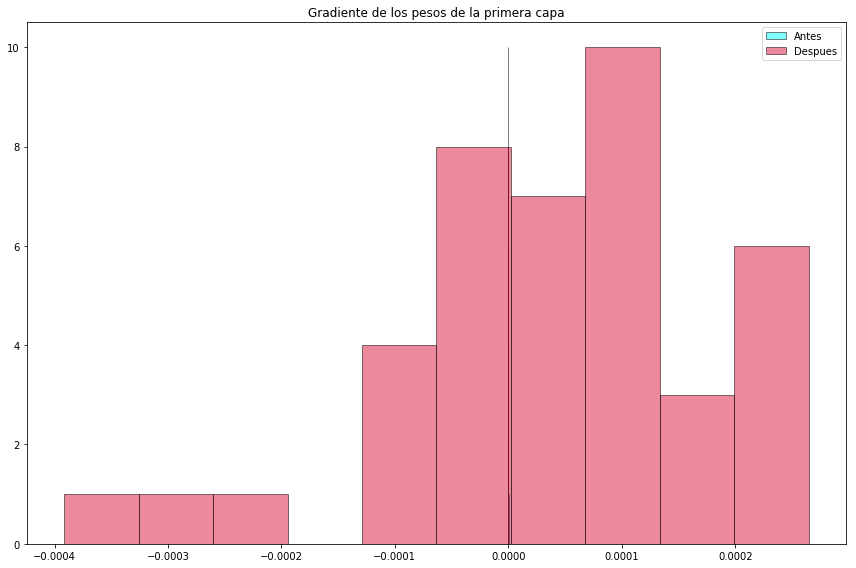

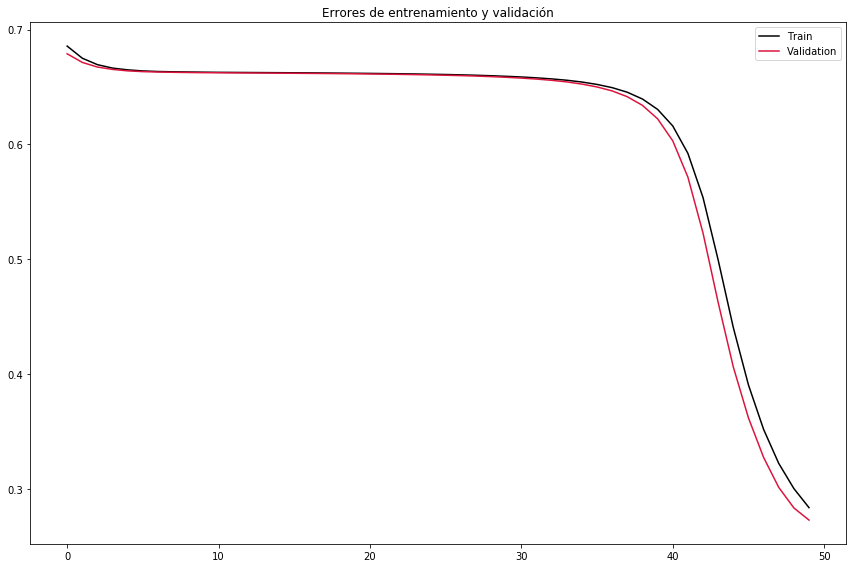

In [0]:
X, Y = (evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Gradiente de los pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Gradiente de los pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

In [0]:
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='he_uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='he_uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='he_uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='he_uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='he_uniform',activation='relu'))
model.add(Dense(1, kernel_initializer='he_uniform',activation='sigmoid'))

loss = keras.losses.mean_squared_error(model.output,y_train)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors) #We can now calculate the gradients.
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]

Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 2s 511us/step - loss: 0.3898 - acc: 0.8164 - val_loss: 0.3070 - val_acc: 0.8754
Epoch 2/50
3753/3753 [==============================] - 0s 104us/step - loss: 0.2831 - acc: 0.8804 - val_loss: 0.2714 - val_acc: 0.8892
Epoch 3/50
3753/3753 [==============================] - 0s 106us/step - loss: 0.2595 - acc: 0.8926 - val_loss: 0.3156 - val_acc: 0.8605
Epoch 4/50
3753/3753 [==============================] - 0s 106us/step - loss: 0.2450 - acc: 0.8977 - val_loss: 0.2484 - val_acc: 0.9031
Epoch 5/50
3753/3753 [==============================] - 0s 104us/step - loss: 0.2310 - acc: 0.9073 - val_loss: 0.2424 - val_acc: 0.9073
Epoch 6/50
3753/3753 [==============================] - 0s 108us/step - loss: 0.2204 - acc: 0.9089 - val_loss: 0.2326 - val_acc: 0.9084
Epoch 7/50
3753/3753 [==============================] - 0s 105us/step - loss: 0.2165 - acc: 0.9083 - val_loss: 0.2302 - val_acc: 0.9084
E

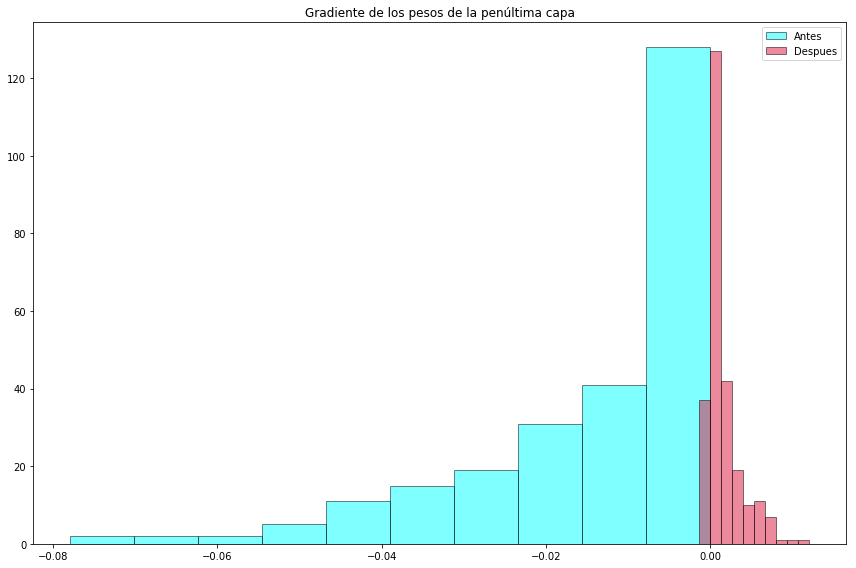

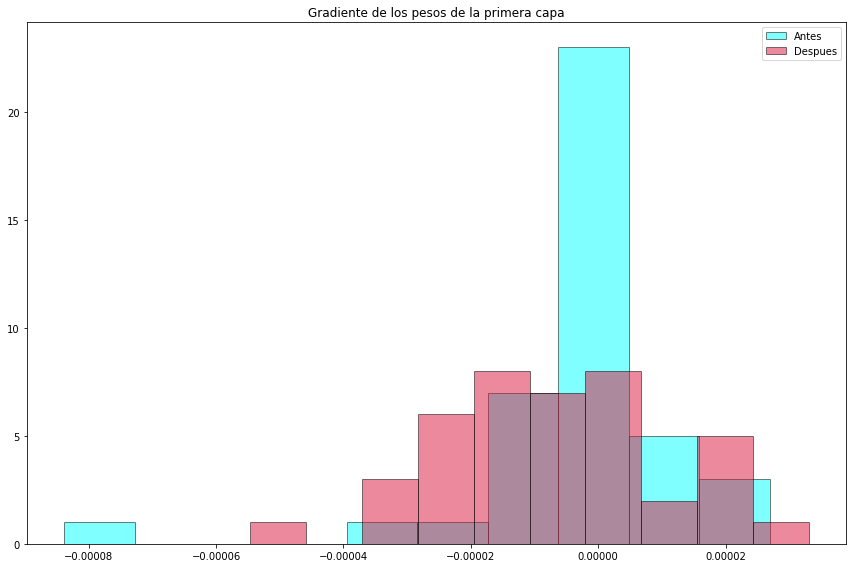

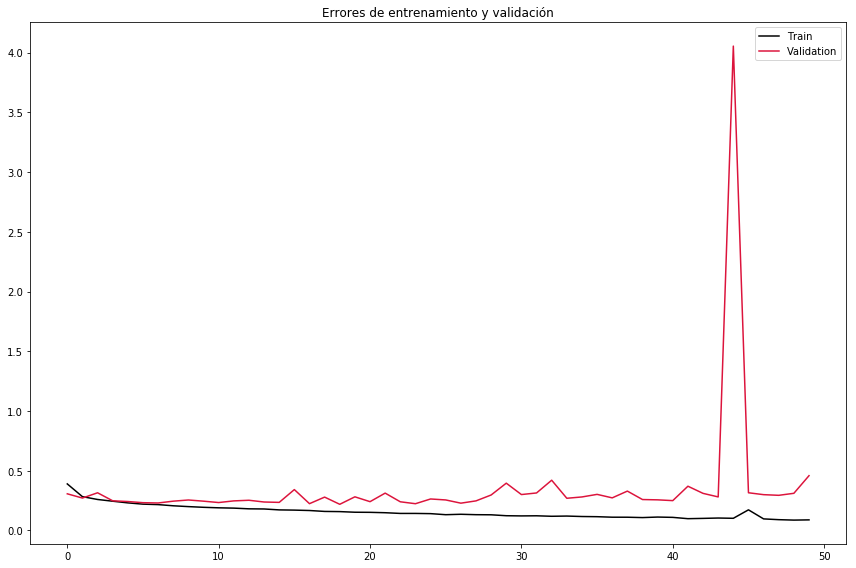

In [0]:
X, Y = (evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Gradiente de los pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Gradiente de los pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

Para este caso los gradientes despues del entrenamiento tienden a ocultarse mucho en el 0. Aquí se puede notar claramente el efecto de la gradiente desvaneciente.

Las capas iniciadoras de tipo 'uniform' tuvieron un mejor desempeño en cuanto a la loss que se obtuvo luego de aprox 20 *epoch*. Por otro lado, la red de capas iniciadores de tipo 'he_uniform' tienen un buen desempeño a lo largo de los *epoch* donde igual se puede notar un "overfitting" dado que el comportamiento en el conjunto de train obtiene muy poca *loss* en comparación a la de validación.

> e) Experimente con la utilización de una función activación auxiliar (debido a que aproxima) a '**ReLU**' y que es continua derivable (**softplus**) ¿Cuál es el beneficio de ésta con respecto ReLU? Comente.
```python
...
model.add(Dense(nh, kernel_initializer='he_uniform',activation='softplus')) #softplus
...
```

In [0]:
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='he_uniform',activation='softplus'))
model.add(Dense(256, kernel_initializer='he_uniform',activation='softplus'))
model.add(Dense(256, kernel_initializer='he_uniform',activation='softplus'))
model.add(Dense(256, kernel_initializer='he_uniform',activation='softplus'))
model.add(Dense(256, kernel_initializer='he_uniform',activation='softplus'))
model.add(Dense(1, kernel_initializer='he_uniform',activation='sigmoid'))

loss = keras.losses.mean_squared_error(model.output,y_train)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors) #We can now calculate the gradients.
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]

Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 2s 516us/step - loss: 0.5442 - acc: 0.7045 - val_loss: 0.3832 - val_acc: 0.8392
Epoch 2/50
3753/3753 [==============================] - 0s 109us/step - loss: 0.3687 - acc: 0.8260 - val_loss: 0.4144 - val_acc: 0.7966
Epoch 3/50
3753/3753 [==============================] - 0s 109us/step - loss: 0.3150 - acc: 0.8566 - val_loss: 0.4589 - val_acc: 0.7849
Epoch 4/50
3753/3753 [==============================] - 0s 106us/step - loss: 0.3374 - acc: 0.8535 - val_loss: 0.2939 - val_acc: 0.8839
Epoch 5/50
3753/3753 [==============================] - 0s 111us/step - loss: 0.3009 - acc: 0.8649 - val_loss: 0.2943 - val_acc: 0.8850
Epoch 6/50
3753/3753 [==============================] - 0s 106us/step - loss: 0.2898 - acc: 0.8734 - val_loss: 0.3066 - val_acc: 0.8509
Epoch 7/50
3753/3753 [==============================] - 0s 108us/step - loss: 0.2901 - acc: 0.8705 - val_loss: 0.2789 - val_acc: 0.8850
E

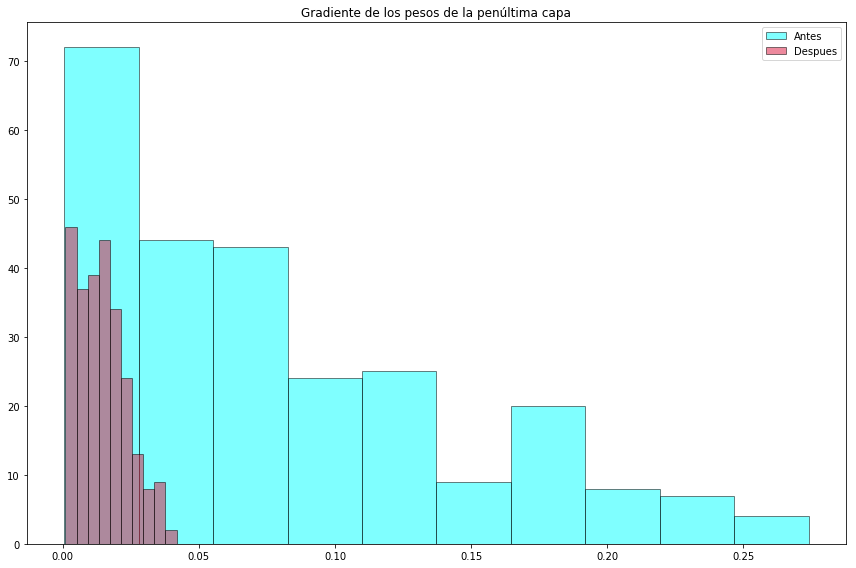

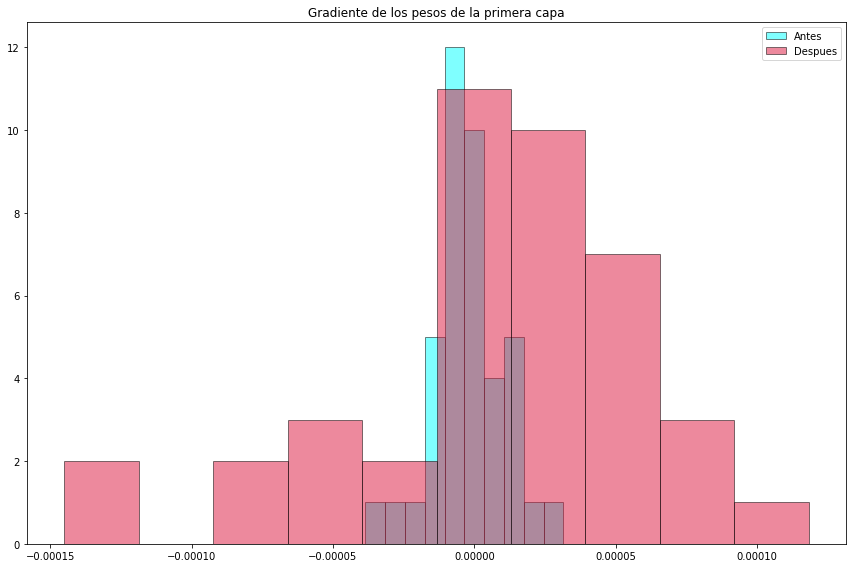

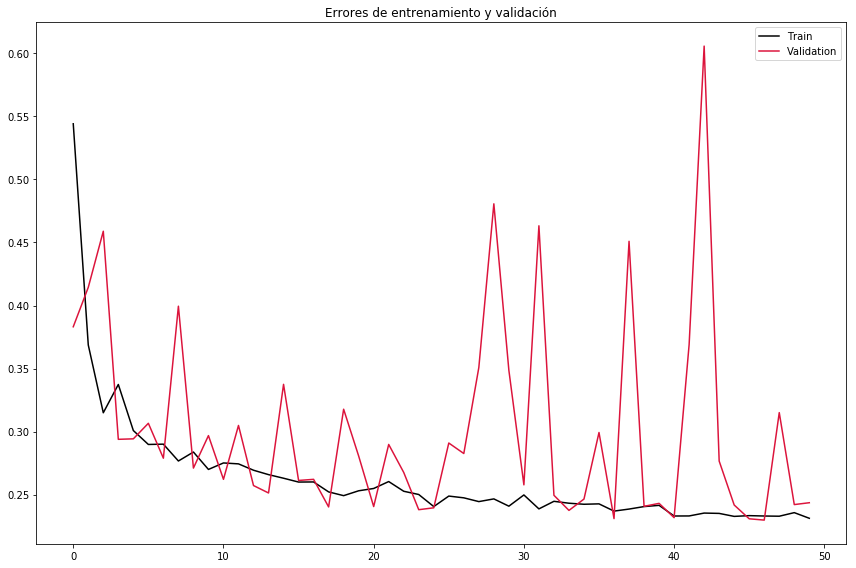

In [0]:
X, Y = (evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Gradiente de los pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Gradiente de los pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

La funcion *softplus* tiene como beneficio que no tiene cambios bruscos para cuando los valores son números negativos. Softplus permite que estos valores obtengan un valor mínimo que igual puede ser significable para el entrenamiento. En efecto, al tener que los valores negativos no son 0 pero sí son un número muy bajo, permite una pequeña activación y puede hacer notar cambios que ReLU no haría notar.

Para este caso se dio que para ambos, softplus dio un error "mejor" que ReLU, donde quizá al permitir que los valores bajo cero afecten a los pesos entre las capas y en la red en general. Además, *Softplus* tuvo una tasa de convergencia más regular que ReLU pero con diferencias en distintos *epoch* que ReLU no obtuvo.

> f) ¿Qué es lo que sucede con la red más profunda? ¿El modelo logra convergencia en su entrenamiento? Vuelva a experimentar con variar las funciones de activación con el propósito de lograr un buen aprendizaje y generalización del modelo en base a la *loss*. Experimente con la familia ReLU (LeakyReLU, PReLU, ELU, ThresholdedReLU), algunas en el __[link](https://keras.io/layers/advanced-activations/)__. ¿Con cuál se aprende más rápido en términos de la *loss*? Además monitoree neuronas muertas (*dying neuron*) a través de los valores de la activación (por ejemplo ReLU con valor 0 no genera gradiente) con un histograma a lo largo del entrenamiento.  
*Hint: ésto último se puede visualizar con lo de la pregunta b), __[TensorBoard](https://keras.io/callbacks/#tensorboard)__*.
```python
from keras.layers import LeakyReLU, PReLU, ELU, ThresholdedReLU
LeakyReLU(alpha=0.3)
PReLU(alpha_initializer='zeros')
ELU(alpha=1.0)
ThresholdedReLU(theta=1.0)
...
model.add(Dense(nh, activation='linear'))
model.add(LeakyReLU(alpha=0.3))
...
```
¿Las funciones de activaciones de cada capa necesariamente deben ser iguales? Comente sobre su respuesta.

In [0]:
LKR=LeakyReLU(alpha=0.3)
PRR=PReLU(alpha_initializer='zeros')
EL=ELU(alpha=1.0)
THR=ThresholdedReLU(theta=1.0)
#añadir modelos adicionales

In [0]:
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='he_uniform',activation=LKR))
model.add(Dense(256, kernel_initializer='he_uniform',activation=LKR))
model.add(Dense(256, kernel_initializer='he_uniform',activation=LKR))
model.add(Dense(256, kernel_initializer='he_uniform',activation=LKR))
model.add(Dense(256, kernel_initializer='he_uniform',activation=LKR))
model.add(Dense(1, kernel_initializer='he_uniform',activation='sigmoid'))

loss = keras.losses.mean_squared_error(model.output,y_train)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors) #We can now calculate the gradients.
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]

/usr/local/lib/python3.6/dist-packages/keras/activations.py:211: UserWarning: Do not pass a layer instance (such as LeakyReLU) as the activation argument of another layer. Instead, advanced activation layers should be used just like any other layer in a model.
  identifier=identifier.__class__.__name__))


Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 1s 336us/step - loss: 0.3514 - acc: 0.8425 - val_loss: 0.2855 - val_acc: 0.8829
Epoch 2/50
3753/3753 [==============================] - 0s 105us/step - loss: 0.2706 - acc: 0.8884 - val_loss: 0.2553 - val_acc: 0.8967
Epoch 3/50
3753/3753 [==============================] - 0s 101us/step - loss: 0.2516 - acc: 0.8942 - val_loss: 0.2507 - val_acc: 0.8978
Epoch 4/50
3753/3753 [==============================] - 0s 102us/step - loss: 0.2386 - acc: 0.9006 - val_loss: 0.2487 - val_acc: 0.9063
Epoch 5/50
3753/3753 [==============================] - 0s 101us/step - loss: 0.2325 - acc: 0.9041 - val_loss: 0.2395 - val_acc: 0.9073
Epoch 6/50
3753/3753 [==============================] - 0s 102us/step - loss: 0.2246 - acc: 0.9035 - val_loss: 0.2430 - val_acc: 0.9010
Epoch 7/50
3753/3753 [==============================] - 0s 105us/step - loss: 0.2188 - acc: 0.9115 - val_loss: 0.2353 - val_acc: 0.9137
E

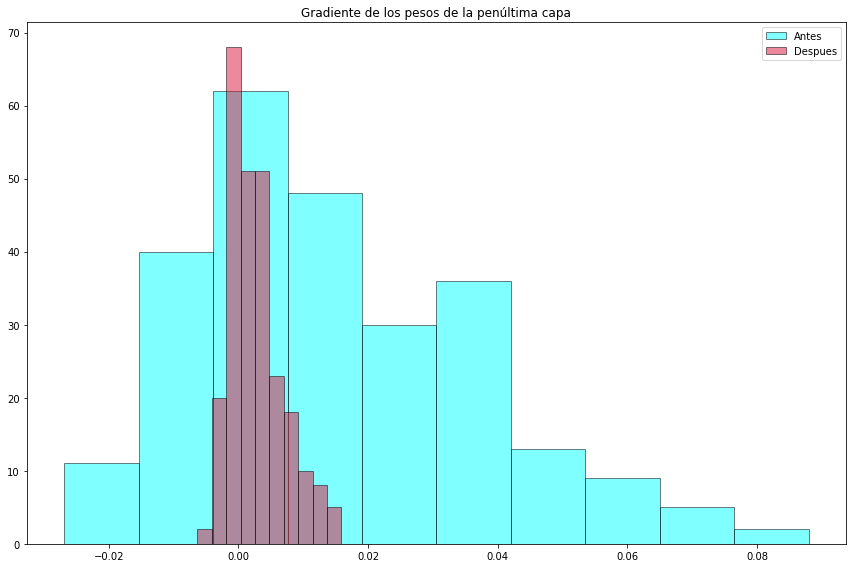

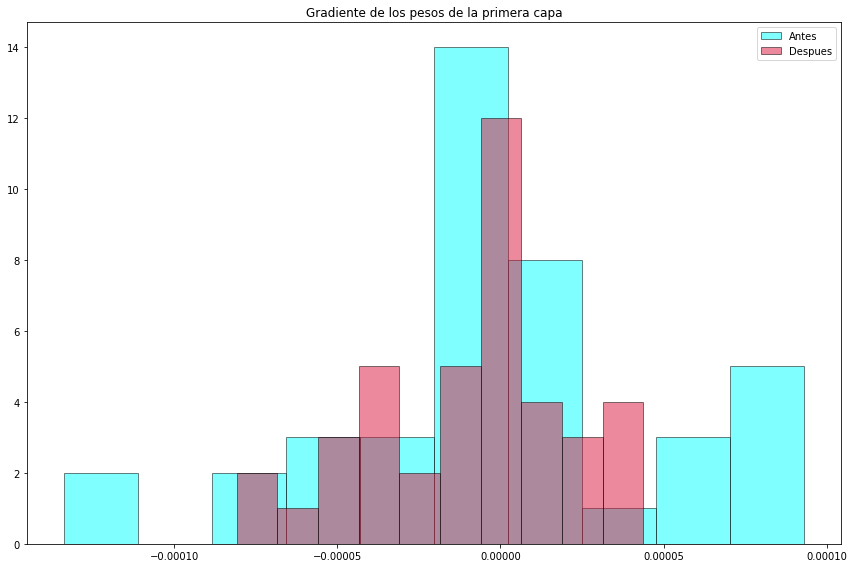

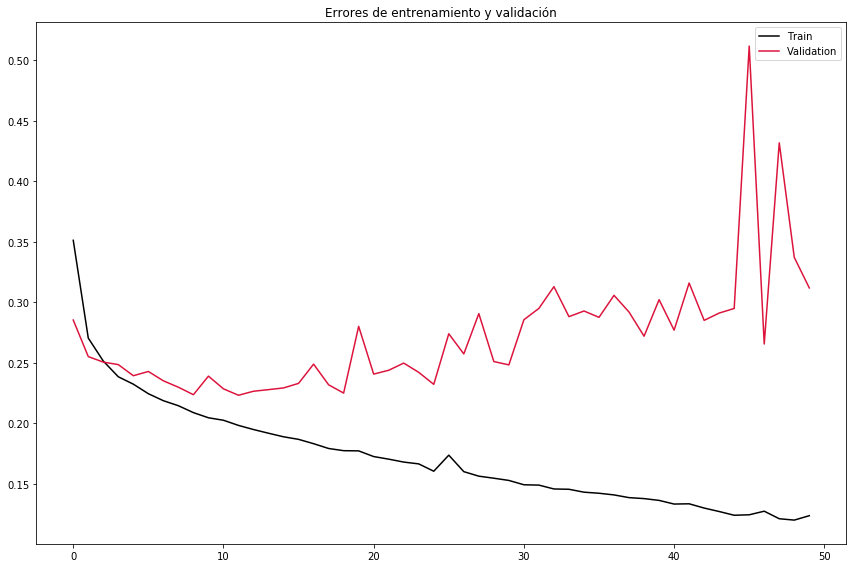

In [0]:
X, Y = (evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Gradiente de los pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Gradiente de los pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

In [0]:
#Al cambiar LKR por PRR tuve un error de dimensiones, por favor revisar.
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='he_uniform',activation=PRR))
model.add(Dense(256, kernel_initializer='he_uniform',activation=PRR))
model.add(Dense(256, kernel_initializer='he_uniform',activation=PRR))
model.add(Dense(256, kernel_initializer='he_uniform',activation=PRR))
model.add(Dense(256, kernel_initializer='he_uniform',activation=PRR))
model.add(Dense(1, kernel_initializer='he_uniform',activation='sigmoid'))

loss = keras.losses.mean_squared_error(model.output,y_train)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors) #We can now calculate the gradients.
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]

/usr/local/lib/python3.6/dist-packages/keras/activations.py:211: UserWarning: Do not pass a layer instance (such as PReLU) as the activation argument of another layer. Instead, advanced activation layers should be used just like any other layer in a model.
  identifier=identifier.__class__.__name__))


Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 1s 374us/step - loss: 0.3918 - acc: 0.8151 - val_loss: 0.2981 - val_acc: 0.8765
Epoch 2/50
3753/3753 [==============================] - 0s 116us/step - loss: 0.2809 - acc: 0.8814 - val_loss: 0.2706 - val_acc: 0.8946
Epoch 3/50
3753/3753 [==============================] - 0s 118us/step - loss: 0.2584 - acc: 0.8889 - val_loss: 0.2794 - val_acc: 0.8839
Epoch 4/50
3753/3753 [==============================] - 0s 115us/step - loss: 0.2445 - acc: 0.8969 - val_loss: 0.2541 - val_acc: 0.8956
Epoch 5/50
3753/3753 [==============================] - 0s 112us/step - loss: 0.2344 - acc: 0.9022 - val_loss: 0.2514 - val_acc: 0.9031
Epoch 6/50
3753/3753 [==============================] - 0s 112us/step - loss: 0.2249 - acc: 0.9075 - val_loss: 0.2455 - val_acc: 0.9042
Epoch 7/50
3753/3753 [==============================] - 0s 115us/step - loss: 0.2160 - acc: 0.9099 - val_loss: 0.2459 - val_acc: 0.9010
E

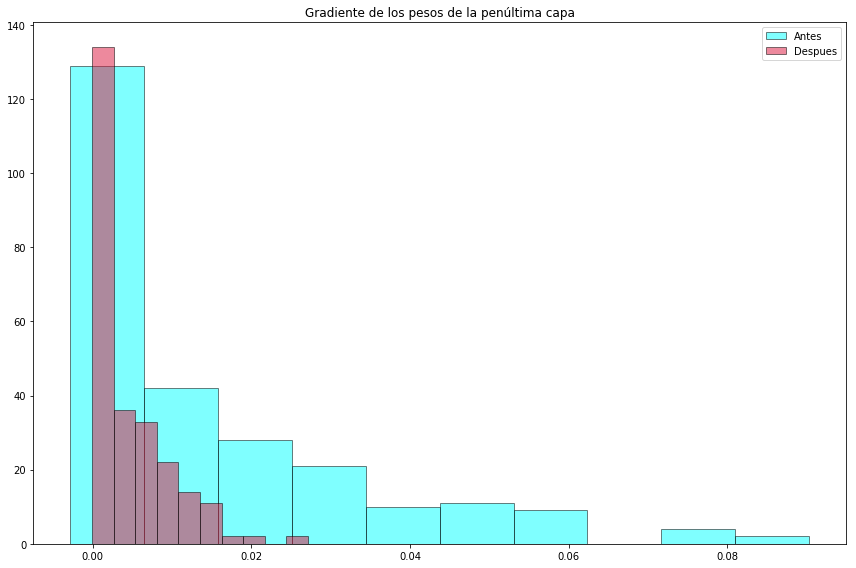

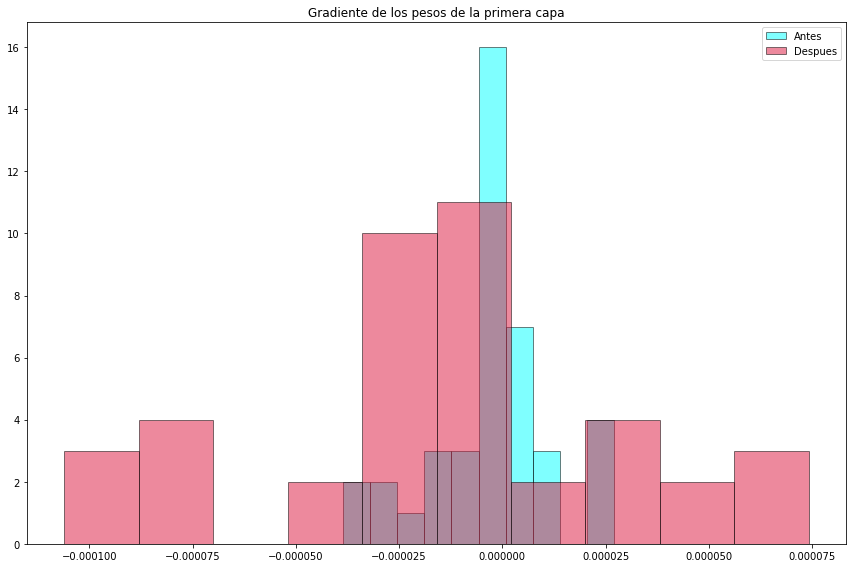

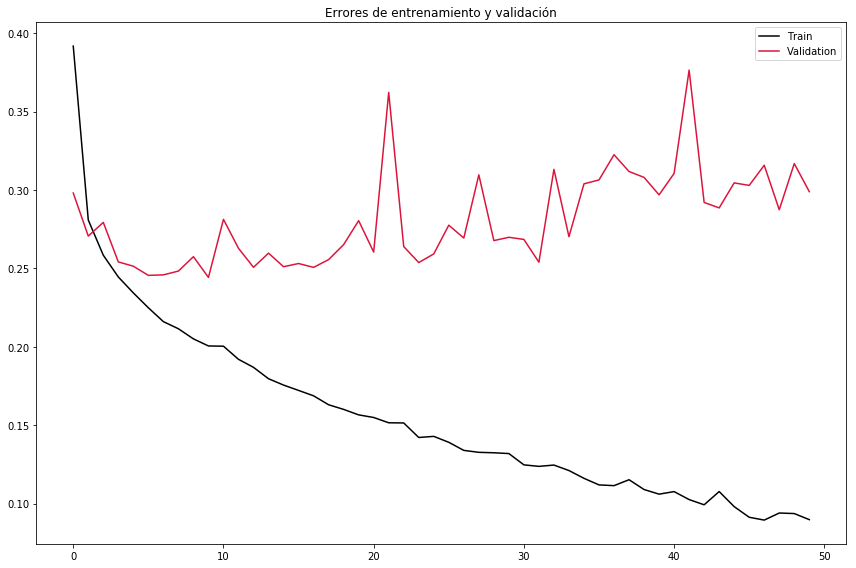

In [0]:
X, Y = (evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Gradiente de los pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Gradiente de los pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

In [0]:
modelH = Sequential()
modelH.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='he_uniform',activation=EL))
modelH.add(Dense(256, kernel_initializer='he_uniform',activation=EL))
modelH.add(Dense(256, kernel_initializer='he_uniform',activation=EL))
modelH.add(Dense(256, kernel_initializer='he_uniform',activation=EL))
modelH.add(Dense(256, kernel_initializer='he_uniform',activation=EL))
modelH.add(Dense(1, kernel_initializer='he_uniform',activation='sigmoid'))

loss = keras.losses.mean_squared_error(modelH.output,y_train)
listOfVariableTensors = modelH.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors) #We can now calculate the gradients.
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={modelH.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

modelH.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
modelH.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={modelH.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]

/usr/local/lib/python3.6/dist-packages/keras/activations.py:211: UserWarning: Do not pass a layer instance (such as ELU) as the activation argument of another layer. Instead, advanced activation layers should be used just like any other layer in a model.
  identifier=identifier.__class__.__name__))


Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 1s 386us/step - loss: 0.3089 - acc: 0.8665 - val_loss: 0.2560 - val_acc: 0.8892
Epoch 2/50
3753/3753 [==============================] - 0s 101us/step - loss: 0.2563 - acc: 0.8846 - val_loss: 0.2864 - val_acc: 0.8818
Epoch 3/50
3753/3753 [==============================] - 0s 102us/step - loss: 0.2452 - acc: 0.8987 - val_loss: 0.2400 - val_acc: 0.9084
Epoch 4/50
3753/3753 [==============================] - 0s 104us/step - loss: 0.2325 - acc: 0.8985 - val_loss: 0.2340 - val_acc: 0.9052
Epoch 5/50
3753/3753 [==============================] - 0s 103us/step - loss: 0.2264 - acc: 0.9070 - val_loss: 0.2309 - val_acc: 0.9073
Epoch 6/50
3753/3753 [==============================] - 0s 105us/step - loss: 0.2169 - acc: 0.9110 - val_loss: 0.2389 - val_acc: 0.9052
Epoch 7/50
3753/3753 [==============================] - 0s 107us/step - loss: 0.2134 - acc: 0.9115 - val_loss: 0.2229 - val_acc: 0.9095
E

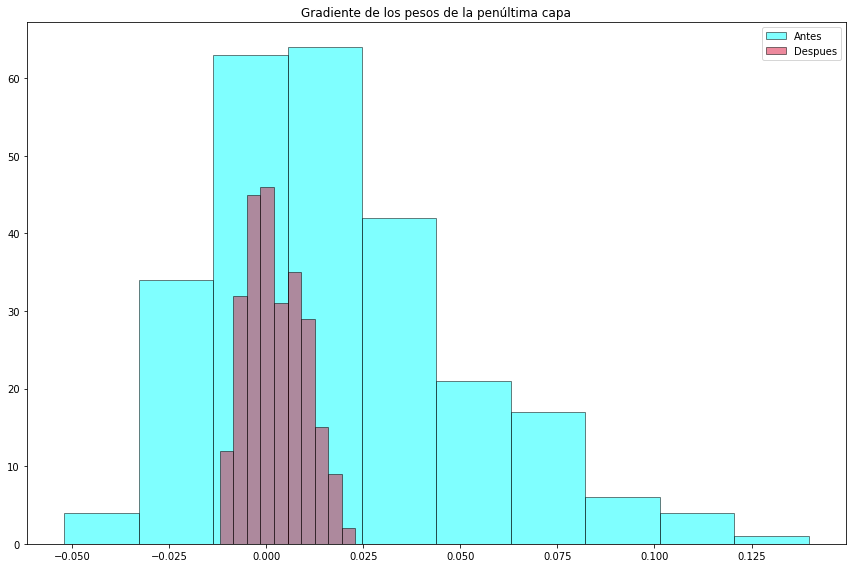

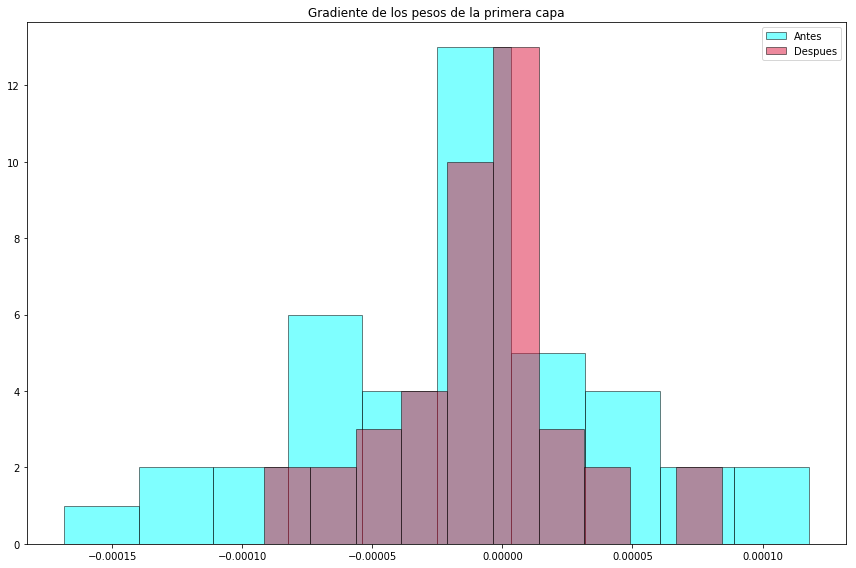

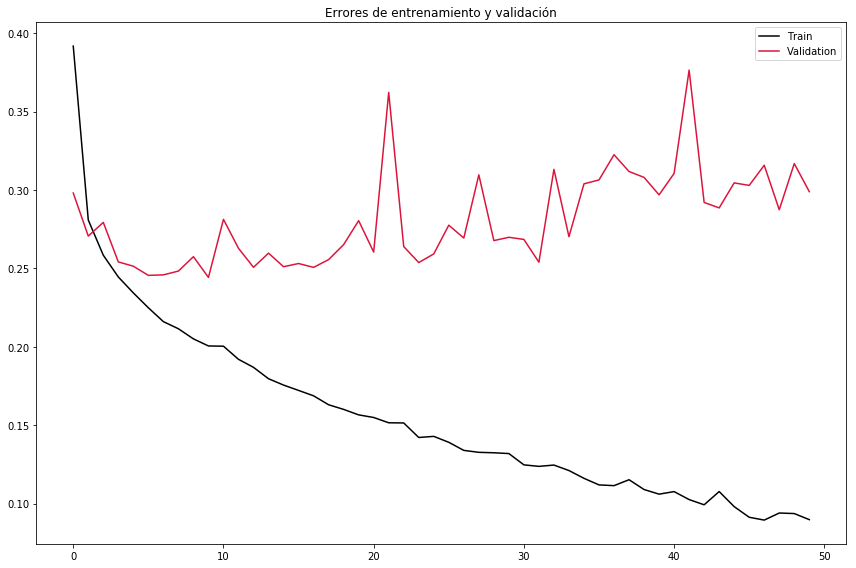

In [0]:
X, Y = (evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Gradiente de los pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Gradiente de los pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

In [0]:
modelH = Sequential()
modelH.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='he_uniform',activation=THR))
modelH.add(Dense(256, kernel_initializer='he_uniform',activation=THR))
modelH.add(Dense(256, kernel_initializer='he_uniform',activation=THR))
modelH.add(Dense(256, kernel_initializer='he_uniform',activation=THR))
modelH.add(Dense(256, kernel_initializer='he_uniform',activation=THR))
modelH.add(Dense(1, kernel_initializer='he_uniform',activation='sigmoid'))

loss = keras.losses.mean_squared_error(modelH.output,y_train)
listOfVariableTensors = modelH.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors) #We can now calculate the gradients.
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={modelH.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

modelH.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
modelH.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={modelH.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]

/usr/local/lib/python3.6/dist-packages/keras/activations.py:211: UserWarning: Do not pass a layer instance (such as ThresholdedReLU) as the activation argument of another layer. Instead, advanced activation layers should be used just like any other layer in a model.
  identifier=identifier.__class__.__name__))


Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 2s 417us/step - loss: 0.6181 - acc: 0.6048 - val_loss: 0.5946 - val_acc: 0.6113
Epoch 2/50
3753/3753 [==============================] - 0s 109us/step - loss: 0.5925 - acc: 0.6224 - val_loss: 0.5840 - val_acc: 0.6219
Epoch 3/50
3753/3753 [==============================] - 0s 106us/step - loss: 0.5797 - acc: 0.6323 - val_loss: 0.5788 - val_acc: 0.6262
Epoch 4/50
3753/3753 [==============================] - 0s 109us/step - loss: 0.5717 - acc: 0.6342 - val_loss: 0.5702 - val_acc: 0.6315
Epoch 5/50
3753/3753 [==============================] - 0s 107us/step - loss: 0.5615 - acc: 0.6422 - val_loss: 0.5662 - val_acc: 0.6390
Epoch 6/50
3753/3753 [==============================] - 0s 106us/step - loss: 0.5538 - acc: 0.6469 - val_loss: 0.5611 - val_acc: 0.6464
Epoch 7/50
3753/3753 [==============================] - 0s 115us/step - loss: 0.5456 - acc: 0.6528 - val_loss: 0.5579 - val_acc: 0.6507
E

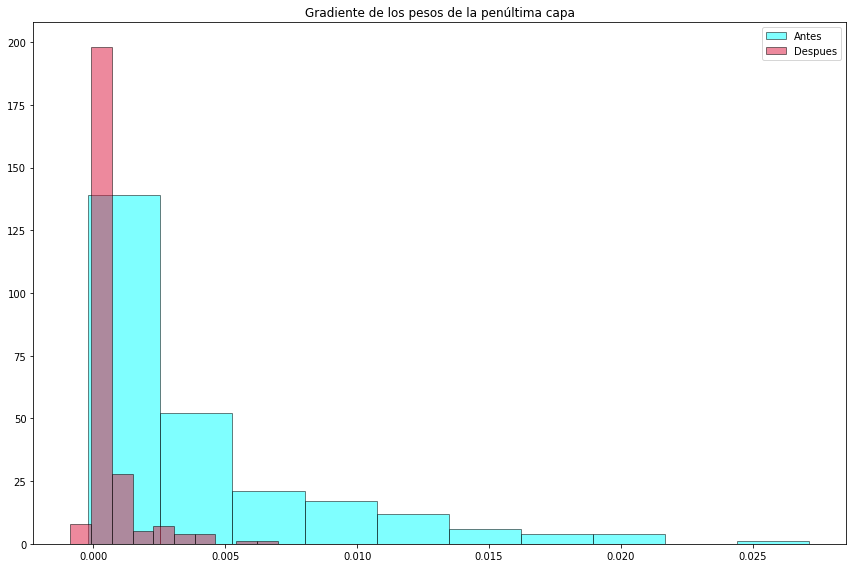

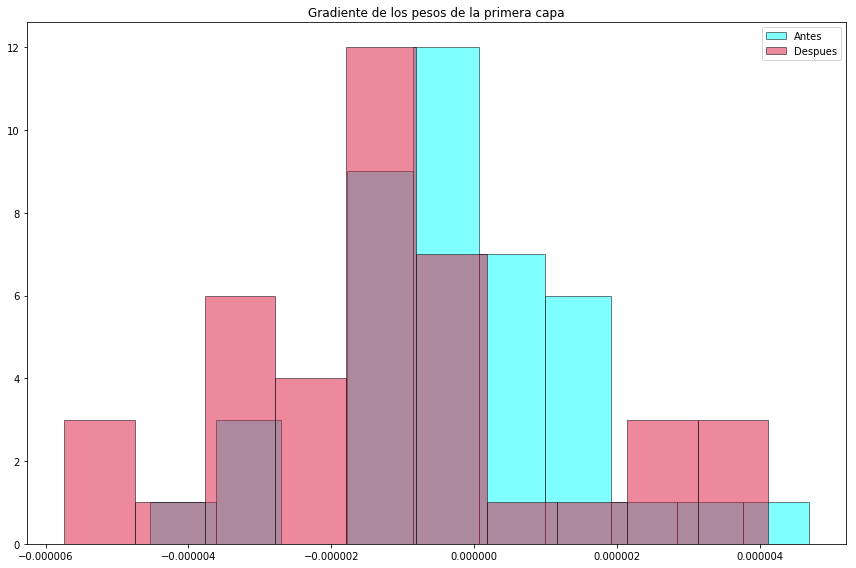

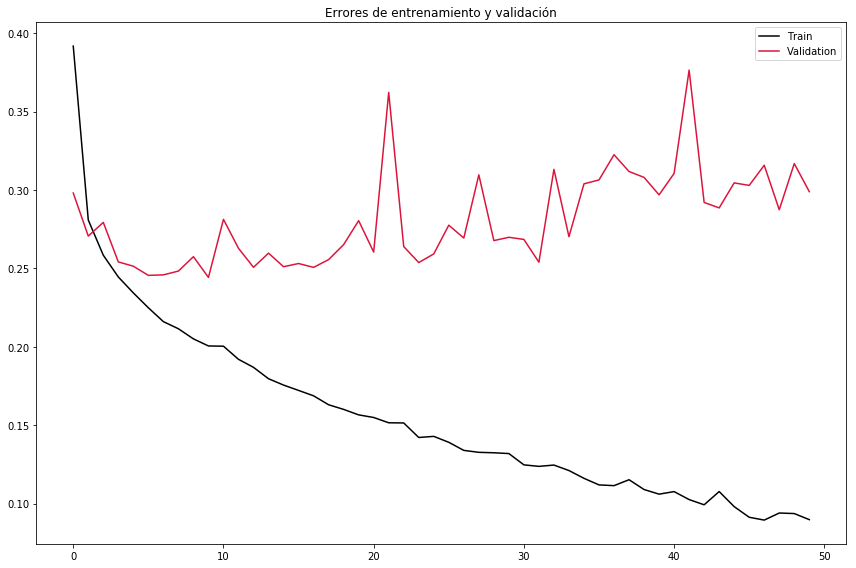

In [0]:
X, Y = (evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Gradiente de los pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Gradiente de los pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

In [0]:
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='uniform',activation='relu'))
model.add(Dense(256, kernel_initializer='uniform',activation='relu'))
model.add(Dense(1, kernel_initializer='uniform',activation='sigmoid'))
#No se si se referian a esto con relu en valor 0
loss = keras.losses.mean_squared_error(model.output,y_train)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors) #We can now calculate the gradients.
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]
#Gradientes por capa también

Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 2s 412us/step - loss: 0.6852 - acc: 0.6214 - val_loss: 0.6786 - val_acc: 0.6219
Epoch 2/50
3753/3753 [==============================] - 0s 103us/step - loss: 0.6747 - acc: 0.6214 - val_loss: 0.6712 - val_acc: 0.6219
Epoch 3/50
3753/3753 [==============================] - 0s 102us/step - loss: 0.6692 - acc: 0.6214 - val_loss: 0.6670 - val_acc: 0.6219
Epoch 4/50
3753/3753 [==============================] - 0s 106us/step - loss: 0.6661 - acc: 0.6214 - val_loss: 0.6648 - val_acc: 0.6219
Epoch 5/50
3753/3753 [==============================] - 0s 103us/step - loss: 0.6645 - acc: 0.6214 - val_loss: 0.6638 - val_acc: 0.6219
Epoch 6/50
3753/3753 [==============================] - 0s 106us/step - loss: 0.6637 - acc: 0.6214 - val_loss: 0.6631 - val_acc: 0.6219
Epoch 7/50
3753/3753 [==============================] - 0s 104us/step - loss: 0.6633 - acc: 0.6214 - val_loss: 0.6627 - val_acc: 0.6219
E

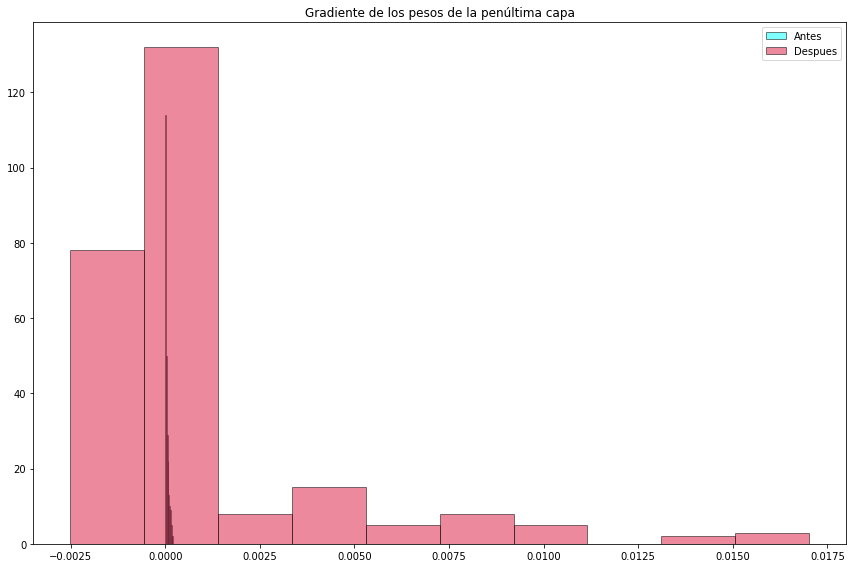

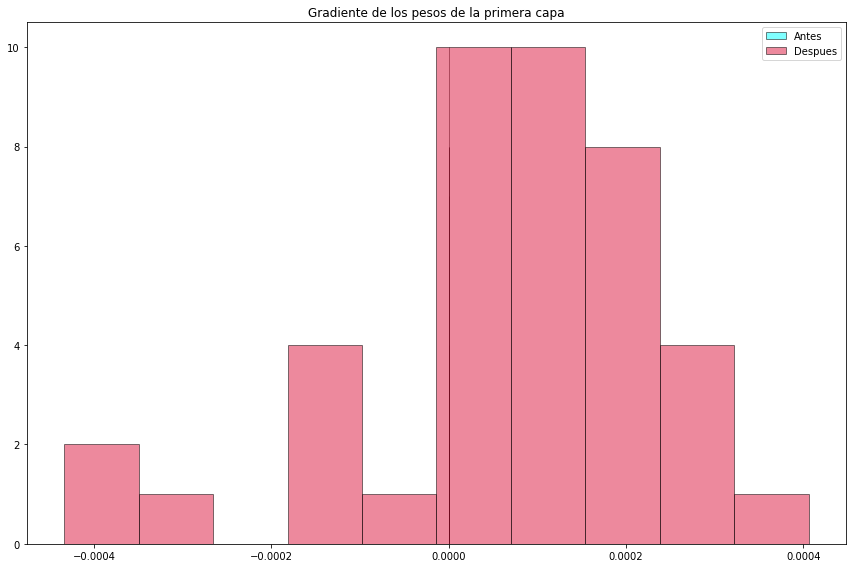

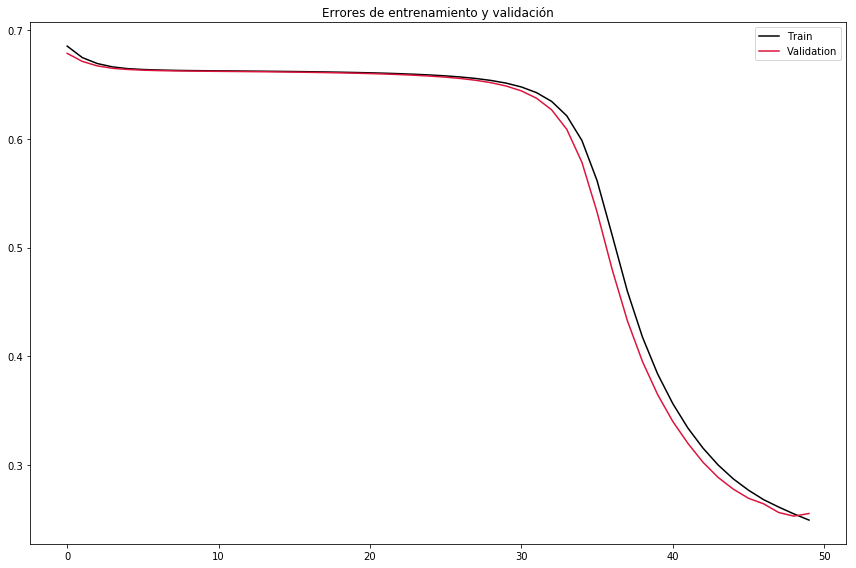

In [0]:
X, Y = (evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Gradiente de los pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Gradiente de los pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

El conjunto de la familia ReLU posee un comportamiento similiar donde, para este caso, se tiene que la convergencia de todos llega a un 0.3 para validación y un 0.1 para entrenamiento aprox. Esto puede pensarse como un sobreajuste de los datos pero la *accuracy* de ambos conjuntos no varía demaciado como para poder concluir eso de una manera certera.

En redes profundas se tiende una convergencia de la red. El problema de esta convergencia es que puede provocar overfitting si no se controla de buena forma.

Las funciones de activacion para las capas no necesariamente deben ser iguales pero si similares (que tengan un output igual). Por ejemplo, si se está trabajando con la capa de salida *softmax*, generalmente se espera que las capas intermedias/escondidas tengan sentido con la salida que se espera. En el caso de la familia ReLU, las capas de activaciones comunes son del tipo uniforme en su mayoría pero eso no quita que pueda usarse otra.

> g) Ahora, sin variar la profundidad de la red definida en b), se pedirá que experimente con otra variación que podría resultar provechoso para la generalización y aprendizaje del modelo, la técnica de *Dropout* [[8]](#refs) y la técnica de *Batch Normalization*[[9]](#refs). Decida si colocarlas en todas las capas o en algunas. Comente sobre el efecto esperado y el observado.
```python
from keras.layers import Dropout, BatchNormalization
...
model.add(Dense(nh, activation=act, kernel_initializer=init))
model.add(Dropout(dropout_rate))
...
...
model.add(Dense(nh, activation=act, kernel_initializer=init))
model.add(BatchNormalization())
...
```

A priori se espera que estas técnicas afecten positivamente a la red en el sentido de *accuracy*. Se tiene en mente que la técnica *Dropout* maneja el **Overfitting** haciendo que la red no pase por todos las neuronas de esta y, de forma analoga, *Batch Normalization* trata de mejorar la *performance* y velocidad con la que la red se entrena.

Entonces se espera que la loss de *Dropout* sea muy bajita y para *Batch Normalization* su accuracy sea alta y se entrene de una manera mas rápida que como lo haria una red que no usa esta técnica.

In [0]:
from keras.layers import Dropout, BatchNormalization

In [0]:
dropout_rate=0.2
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dropout(dropout_rate))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dropout(dropout_rate))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dropout(dropout_rate))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(Dropout(dropout_rate))
model.add(Dense(1, kernel_initializer='uniform',activation='sigmoid'))

loss = keras.losses.mean_squared_error(model.output,y_train)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors) #We can now calculate the gradients.
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]
#Gradientes por capa también

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 2s 553us/step - loss: 0.6670 - acc: 0.6203 - val_loss: 0.6643 - val_acc: 0.6219
Epoch 2/50
3753/3753 [==============================] - 0s 121us/step - loss: 0.6674 - acc: 0.6216 - val_loss: 0.6631 - val_acc: 0.6219
Epoch 3/50
3753/3753 [==============================] - 0s 122us/step - loss: 0.6654 - acc: 0.6216 - val_loss: 0.6748 - val_acc: 0.6219
Epoch 4/50
3753/3753 [==============================] - 0s 121us/step - loss: 0.6693 - acc: 0.6214 - val_loss: 0.6663 - val_acc: 0.6219
Epoch 5/50
3753/3753 [==============================] - 0s 123us/step - loss: 0.6654 - acc: 0.6211 - val_loss: 0.6634 - val_acc: 0.6219
Epoch 6/50
3753/3753 [==============================] - 0s 121us/step - loss: 0.6657 - acc: 0.6216 - val_loss: 0.6631 - val_acc: 0.6219
Epoch 7/50
3753/3753 [

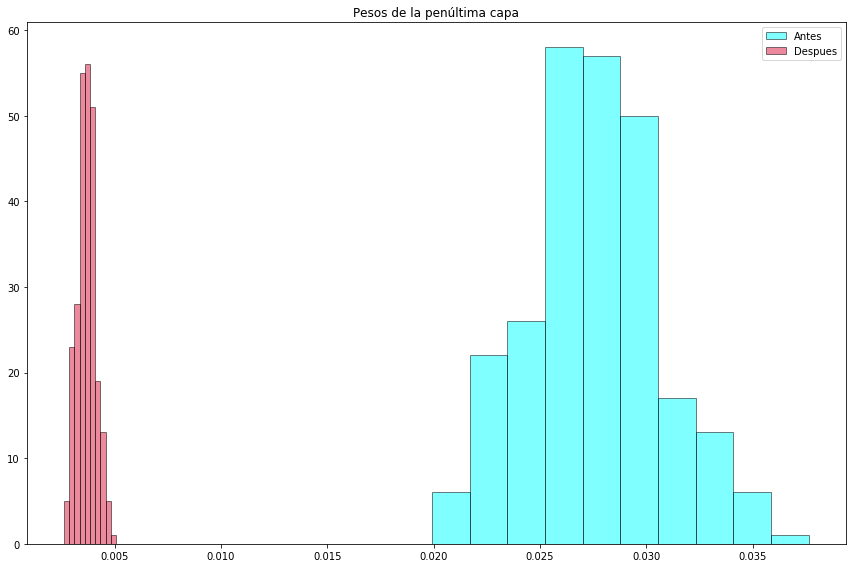

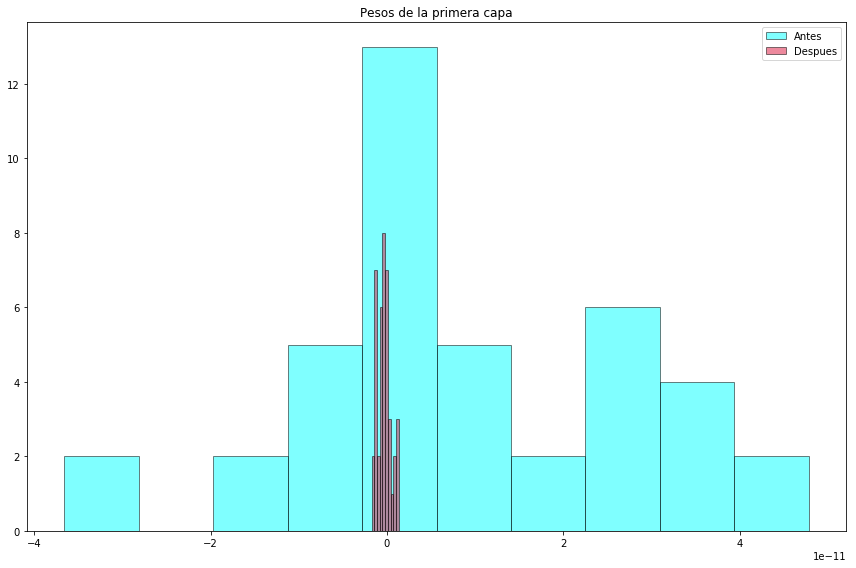

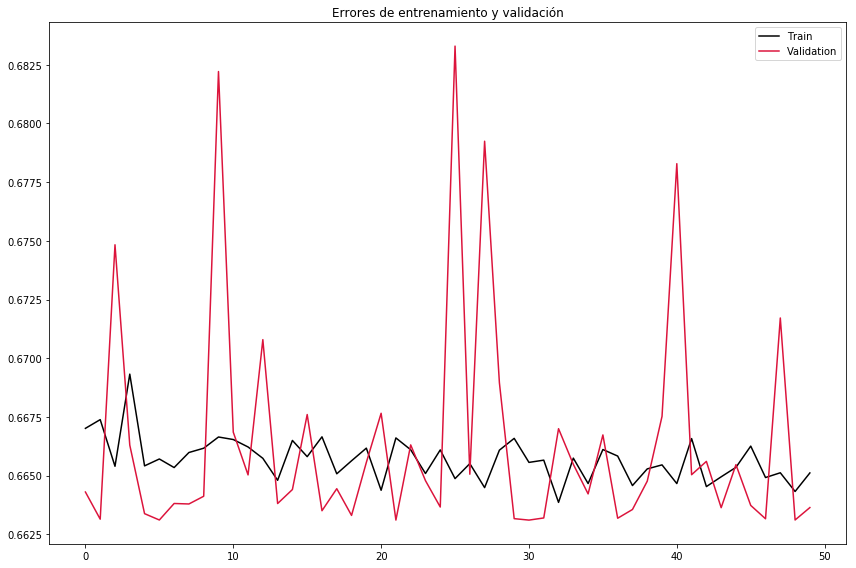

In [0]:
X, Y = datosNormalizar(evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

Para este caso del *Dropout* no se pudo obtener una baja loss como se habia predicho, esto pudo provocarse por que el dataset tiende a tener gradientes desvanecientes para las activaciones uniformes. También está que los datos son en su mayoría *outliers* y que la red este entrenando bajo datos demaciado atipicos (demaciada varianza).

Por otro lado, se puede verificar que los pesos de las capas esta tendiendo a la gradiente desvaneciente. Esto se puede notar por que la mayoría de los pesos estan rondando el 0 luego de los *epoch*.

In [0]:

model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], kernel_initializer='uniform',activation='sigmoid'))
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dense(256, kernel_initializer='uniform',activation='sigmoid'))
model.add(BatchNormalization())
model.add(Dense(1, kernel_initializer='uniform',activation='sigmoid'))

loss = keras.losses.mean_squared_error(model.output,y_train)
listOfVariableTensors = model.trainable_weights 
gradients = K.gradients(loss, listOfVariableTensors) #We can now calculate the gradients.
sess = K.get_session()
evaluated_gradients = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradients = [gradient/len(y_train) for gradient in evaluated_gradients]

model.compile(optimizer=SGD(lr=0.01),loss='binary_crossentropy',metrics=["accuracy"])
model.fit(X_train_scaled, y_train, epochs=epochs, verbose=1, validation_data=(X_validation_scaled, y_validation))

evaluated_gradientsF = sess.run(gradients,feed_dict={model.input:X_train_scaled})
evaluated_gradientsF = [gradient/len(y_train) for gradient in evaluated_gradientsF]
#Gradientes por capa también

Train on 3753 samples, validate on 939 samples
Epoch 1/50
3753/3753 [==============================] - 3s 809us/step - loss: 0.3705 - acc: 0.8412 - val_loss: 0.3219 - val_acc: 0.8403
Epoch 2/50
3753/3753 [==============================] - 1s 239us/step - loss: 0.3429 - acc: 0.8476 - val_loss: 0.3017 - val_acc: 0.8733
Epoch 3/50
3753/3753 [==============================] - 1s 239us/step - loss: 0.3268 - acc: 0.8598 - val_loss: 0.3191 - val_acc: 0.8679
Epoch 4/50
3753/3753 [==============================] - 1s 264us/step - loss: 0.3141 - acc: 0.8686 - val_loss: 0.2874 - val_acc: 0.8722
Epoch 5/50
3753/3753 [==============================] - 1s 269us/step - loss: 0.3182 - acc: 0.8620 - val_loss: 0.3442 - val_acc: 0.8552
Epoch 6/50
3753/3753 [==============================] - 1s 265us/step - loss: 0.3129 - acc: 0.8660 - val_loss: 0.3036 - val_acc: 0.8818
Epoch 7/50
3753/3753 [==============================] - 1s 274us/step - loss: 0.3020 - acc: 0.8718 - val_loss: 0.2772 - val_acc: 0.8818
E

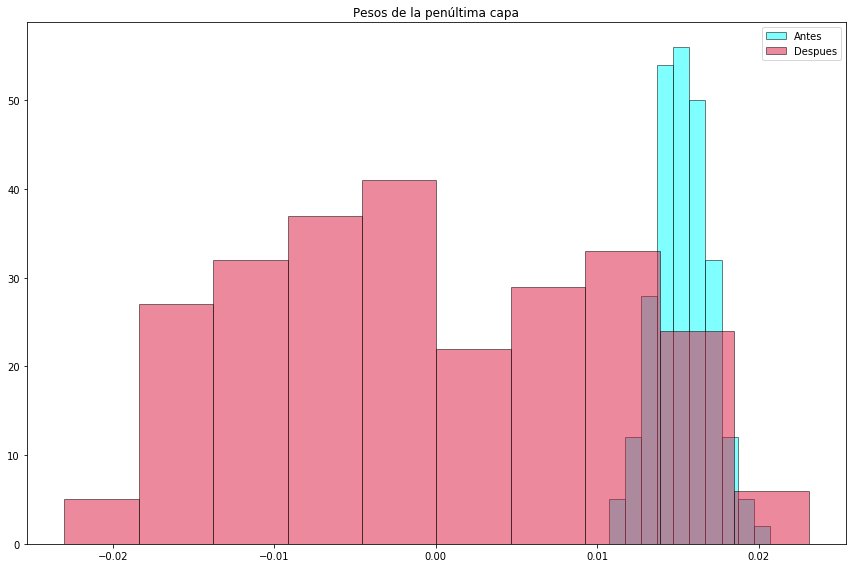

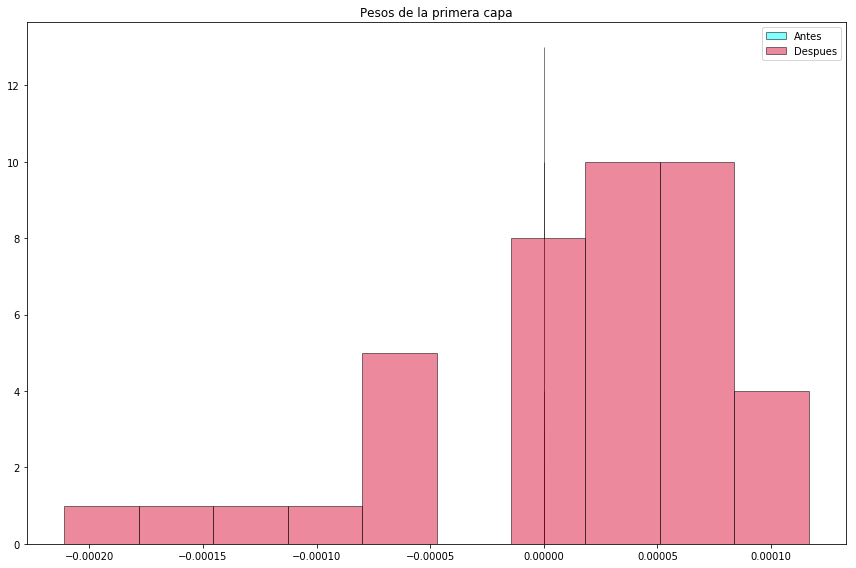

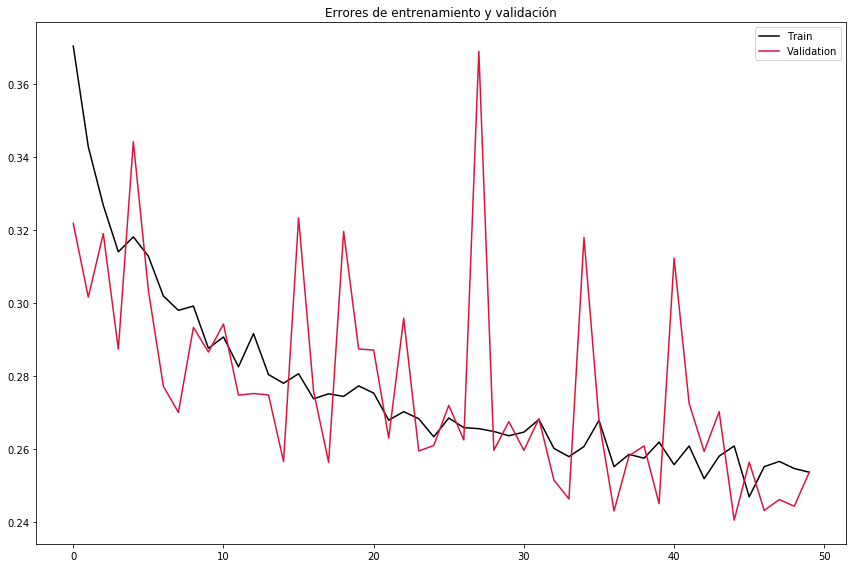

In [0]:
X, Y = datosNormalizar(evaluated_gradients[-2], evaluated_gradientsF[-2])
hist(X, Y, "Pesos de la penúltima capa")

X, Y = datosNormalizar(evaluated_gradients[0], evaluated_gradientsF[0])
hist(X, Y, "Pesos de la primera capa")

#graficar(evaluated_gradients)
#graficar(evaluated_gradientsF)

plotError(model.history.history['loss'], model.history.history['val_loss'], "Errores de entrenamiento y validación")
#%tensorboard --logdir=/tmp

Para este caso ocurrio que *Batch Normalization* obtuvo una buena **performance** con los datos que se le fueron dados. En efecto, su *loss* ronda entre 0.24 y 0.27 aprox. y, de forma opuesta, su *accuracy* esta entre el 0.88 y 0.89 cosa que es un número muy aceptable.

En este caso, la predicción realizada anteriormente fue certeza. Se pudo lograr un mejoramiento de los resultados anteriores y, además, se logra de una buena manera, obteniendo un alto desempeño con baja perdida.

<a id="tercero"></a>
## 3. Redes Convolucionales en Imágenes
---

En esta sección trabajaremos con un *dataset* bastante conocido y utilizado por la comunidad para experimentar reconocimiento de objetos en imágenes: CIFAR-10. Se trata de un conjunto de 60000 imágenes RGB de 32 × 32 pixeles que contiene 10 clases de objetos y 6000 ejemplos por clase. La versión utilizada se le atribuye a *A. Krizhevsky, V. Nair* y *G. Hinton*  [[10]](#refs), viene separada en 50000 ejemplos de entrenamiento y 10000 casos de prueba que fueron obtenidos seleccionando 1000 imágenes aleatorias de cada clase. Cabe destacar que las clases son mutuamente excluyentes y corresponden a las siguientes categorı́as: 

<img src="https://cv-tricks.com/wp-content/uploads/2017/03/alexnet_small.png.pagespeed.ce.j1fiN1R4Hv.png" title="YOLO" width="70%" style="float: left;"/>

* Avión
* Automóvil
* Pájaro
* Gato
* Ciervo
* Perro
* Rana
* Caballo
* Barco
* Camión


Para esta tarea se experimentará con redes convolucionales, conocidas como CNNs ó ConvNets.  
**Nota:** Para esta actividad es bastante aconsejable entrenar las redes usando una GPU, ya que de otro modo los tiempos de entrenamiento serán largos. 


**Recuerde que si encuentra cosas ventajosas en alguna pregunta, puede y debería seguir utilizandolas en las siguientes**

---

Cargue todos los datos de entrenamiento y pruebas del problema CIFAR. Además de generar un conjunto de validación del conjunto de entrenamiento y que no debe superar las 5000 imágenes.
```python
label_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']  
import numpy as np   
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
... #create validation
```

> a) Visualice los datos que trabajaremos e intentaremos detectar en esta sección. ¿Qué dimensiones tienen las imágenes trabajadas? ¿Existen patrones similares entre los objetos de una misma clase? ¿Entre objetos de distintas clases?.
```python
idx_dato = [np.random.choice(np.where(y_train==i)[0]) for i in range(10)] #sample from each class
f,axx = plt.subplots(2,5,figsize=(10,5))
for i, dato in enumerate(idx_dato):
    axx[int(i/5),i%5].imshow(x_train[dato])
    axx[int(i/5),i%5].axis('off')
    axx[int(i/5),i%5].set_title(label_names[i])
plt.show()
```

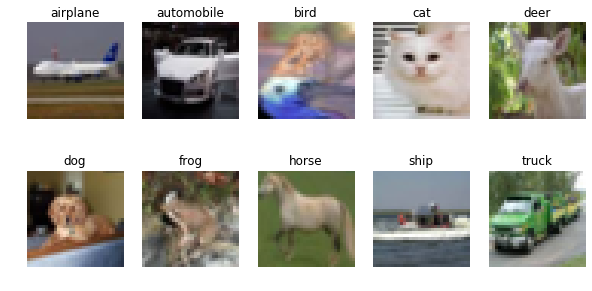

In [0]:
label_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']  
(x_train_initial, y_train_initial), (x_test, y_test) = cifar10.load_data()
x_train, x_validation, y_train, y_validation = train_test_split(x_train_initial, y_train_initial, test_size=0.2, random_state=42)

idx_dato = [np.random.choice(np.where(y_train==i)[0]) for i in range(10)] #sample from each class
f,axx = plt.subplots(2,5,figsize=(10,5))
for i, dato in enumerate(idx_dato):
    axx[int(i/5),i%5].imshow(x_train[dato])
    axx[int(i/5),i%5].axis('off')
    axx[int(i/5),i%5].set_title(label_names[i])
plt.show()

(40000, 32, 32, 3)
(10000, 32, 32, 3)
(32, 32, 3)
(40000, 1)
(10000, 1)
(10000, 32, 32, 3)
(10000, 1)


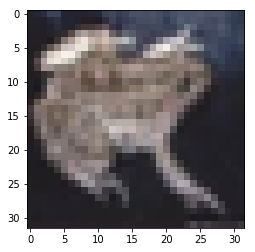

In [0]:
print(x_train.shape)
print(x_validation.shape)
plt.imshow(x_train[10])
plt.imshow(x_train[0])
print(x_train[0].shape)

print(y_train.shape)
print(y_validation.shape)
print(x_test.shape)
print(y_test.shape)

# a) Imágenes
Los datos de input,son imagenes de 32x32x3, donde 32 son las dimensiones x e y respectivamente y 3 representa vectores para describir el RGB. Los datos de output son una lista que contiene el numero de la posicion del label que se utiliza en **label_names**.

Las imágenes de una misma clase tienen en común los ángulos desde donde se visualizan las imágenes. Por ejemplo, la mayoría de los perros están desde una pequeña elevación, o de frente, mientras que las imágenes de caballos son de perfil o de frente en su mayoría.

A lo largo de las diferentes clases, se da que ninguna imagen se ve completamente desde arriba, sino siendo mayoritariamente de perfil o de frente, con leves ángulos de inclinación hacia arriba o abajo. Junto con esto, para los animales se da que también hay imágenes con personas, o imágenes donde sólo está la cabeza del animal.

0.1420617081927187 3976.6861979166665


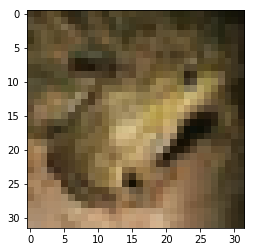

In [0]:
from skimage.measure import compare_ssim as ssim
from skimage.measure import compare_mse as mse
x = idx_dato[y_train[0][0]]
plt.imshow(x_train[x])
print(ssim(x_train[x], x_train[0], multichannel=True), mse(x_train[x], x_train[0]))

Numericamente, las mismas clases no poseen en su mayoría una relación entre ellas. Ni usando MSE (mean square error) o SSIM (structural similarity index) se puede notar una igualdad entre ellos.

> b) Prepare los subconjuntos de entrenamiento, validación y pruebas para ser entregados al modelo. Para ésto divida la intensidad original de pixel en cada canal por 255. Es importante notar que si desea trabajar con el orden de las dimensiones denominado ’th’ (por defecto para *Theano*) deberá realizar la transposición correspondiente para dejar el canal en donde corresponda. Finalmente, genere una representación adecuada de las salidas deseadas de la red.
```python
import keras
..#x_train = x_train.transpose([0, 3, 1, 2]) #if 'th' dim-ordering is used
..#x_test= x_test.transpose([0, 3, 1, 2]) 
y_train = keras.utils.to_categorical(y_train, num_classes)
y_val = keras.utils.to_categorical(y_val, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)
Xnorm_train = x_train.astype('float32')/255
Xnorm_val = x_val.astype('float32')/255
Xnorm_test = x_test.astype('float32')/255
```

In [0]:
tnum_classes=10
y_train = keras.utils.to_categorical(y_train, num_classes)
y_val = keras.utils.to_categorical(y_validation, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)
print(y_test.shape)

(10000, 10, 10)


In [0]:
Xnorm_train = x_train.astype('float32')/255
Xnorm_val = x_validation.astype('float32')/255
Xnorm_test = x_test.astype('float32')/255

In [0]:
print(Xnorm_train.shape)
print(Xnorm_val.shape)
print(y_train.shape)
print(y_val.shape)

(40000, 32, 32, 3)
(10000, 32, 32, 3)
(40000, 10)
(10000, 10)


> c) Defina una CNN simple con arquitectura $C \times P \times C \times P \times F \times F$. Para ambas capas convolucionales utilice 32 y 64 filtros de $3 \times 3$ y funciones de activación ReLU respectivamente. Para las capas de *pooling* utilice filtros de $2 \times 2$ con *stride* 2. Para la capa MLP escondida use 512 neuronas. Genere un esquema lo más compacto posible que muestre los cambios de forma (dimensionalidad) que experimenta un patrón de entrada a medida que se ejecuta un *forward-pass* y el número de parámetros de cada capa.
```python
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D
model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', input_shape=Xnorm_train.shape[1:],activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, (3, 3), padding='same',activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(512,activation='relu'))
model.add(Dense(10,activation='softmax'))
model.summary()
```

In [0]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D
model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', input_shape=Xnorm_train.shape[1:],activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
model.add(Conv2D(64, (3, 3), padding='same',activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
model.add(Flatten())
model.add(Dense(512,activation='relu'))
model.add(Dense(10,activation='softmax'))
model.summary()
Xnorm_train.shape

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_21 (Conv2D)           (None, 32, 32, 32)        896       
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 16, 16, 64)        18496     
_________________________________________________________________
max_pooling2d_22 (MaxPooling (None, 8, 8, 64)          0         
_________________________________________________________________
flatten_11 (Flatten)         (None, 4096)              0         
_________________________________________________________________
dense_113 (Dense)            (None, 512)               2097664   
_________________________________________________________________
dense_114 (Dense)            (None, 10)                5130      
Total para

(40000, 32, 32, 3)

> d) Entrene la CNN definida en **c)** utilizando SGD. En este dataset, una tasa de aprendizaje “segura” es $\eta = 10^{-4}$ o inferior con una tasa de decaimiento, pero durante las primeras *epochs* el entrenamiento resulta demasiado lento. Para resolver el problema compare el entrenar con un optimizador adaptativo como es **RMSProp** con parámetros similares. Construya un gráfico que muestre los errores de entrenamiento, validación y pruebas como función del número de “epochs”, entrene con 25 *epochs*.
```python
from keras.optimizers import SGD, rmsprop
opt = SGD(lr=1e-4,decay=1e-6)
model.compile( ... )
model.fit(Xnorm_train, y_train,batch_size=batch_size,epochs=epochs, validation_data=(Xnorm_val,y_val))
opt = rmsprop(lr=1e-4, decay=1e-6)
model.compile( ... )
model.fit(Xnorm_train, y_train,batch_size=batch_size,epochs=epochs, validation_data=(Xnorm_val, y_val))
```

In [0]:
batch_size=32
epochs=1

class TestCallback(keras.callbacks.Callback):
    def __init__(self, test_data):
        self.test_data = test_data

    def on_epoch_end(self, epoch, logs={}):
        x, y = self.test_data
        loss, acc = self.model.evaluate(x, y, verbose=0)
        print('\nTesting loss: {}, acc: {}\n'.format(loss, acc))

opt = RMSprop(lr=1e-4, decay=1e-6)
model.compile(loss='mean_squared_error', optimizer=opt)
chistRMS = model.fit(Xnorm_train, y_train,batch_size=batch_size,epochs=epochs, validation_data=(Xnorm_val, y_val),
                    callbacks=[TestCallback((x_test, y_test))])
chistRMST = model.evaluate(Xnorm_val, y_val)

opt = SGD(lr=1e-4,decay=1e-6)
model.compile(loss='mean_squared_error', optimizer=opt)
chistSGD = model.fit(Xnorm_train, y_train,batch_size=batch_size,epochs=epochs, validation_data=(Xnorm_val,y_val))
chistSGDT = model.evaluate(Xnorm_val, y_val)

Train on 40000 samples, validate on 10000 samples
Epoch 1/1
40000/40000 [==============================] - 9s 233us/step - loss: 0.0742 - val_loss: 0.0680


TypeError: ignored

In [0]:
print(chistSGDT)
print(chistRMST)

loss = chistSGD.history['loss']
lossVR = chistSGD.history['val_loss']
fig, ax = plt.subplots(figsize=tamaño)
ax.plot(loss, label = "Sigmoidal")
ax.plot(lossV, label = "Sigmoidal, validation set")
ax.plot(lossR, label = "ReLU")
ax.plot(lossVR, label = "ReLU, validation set")
plt.legend()

ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
ax.set_title(r'Loss vs epochs')
fig.tight_layout()
plt.show()

0.04591853251457215
0.046945700359344485


> e) Ahora bien, para mejorar los resultados encontrados deberá aumentar o reducir el número de capas, dependiendo de qué dice su intuición. Deberá elegir sobre dónde aumentar o reducir el número de capas, la fase convolucional y/o la fase *feed forward*, no olvide que al aumentar el número de capas (como en la sección 2) conlleva ciertas consecuencias, lo más importante el *overfitting*, vea cómo reducir ésto.

In [0]:
from keras.optimizers import SGD, rmsprop
opt = SGD(lr=1e-4,decay=1e-6)
batch_size=2
epochs=10
model.compile(loss='mean_squared_error', optimizer=opt)
model.fit(Xnorm_train, y_train,batch_size=batch_size,epochs=epochs, validation_data=(Xnorm_val,y_val))
opt = rmsprop(lr=1e-4, decay=1e-6)
model.compile(loss='mean_squared_error', optimizer=opt)
model.fit(Xnorm_train, y_train,batch_size=batch_size,epochs=epochs, validation_data=(Xnorm_val, y_val))

> f) Duplique el tamaño de los filtros utilizados en la primera capa convolucional. ¿Qué efecto tiene esto sobre el tipo de patrones que detectará la red? ¿Porqué usar filtros pequeños no impide detectar patrones más grandes?
```python
...
model.add(Conv2D(nf*2,(nc, nc),padding='same',input_shape=Xnorm_train.shape[1:],activation='relu'))
...
```

In [0]:
from keras.optimizers import SGD, rmsprop
opt = SGD(lr=1e-4,decay=1e-6)
batch_size=2
epochs=10
model.compile(loss='mean_squared_error', optimizer=opt)
model.fit(Xnorm_train, y_train,batch_size=batch_size,epochs=epochs, validation_data=(Xnorm_val,y_val))
opt = rmsprop(lr=1e-4, decay=1e-6)
model.add(Conv2D(nf*2,(nc, nc),padding='same',input_shape=Xnorm_train.shape[1:],activation='relu'))
model.compile(loss='mean_squared_error', optimizer=opt)
model.fit(Xnorm_train, y_train,batch_size=batch_size,epochs=epochs, validation_data=(Xnorm_val, y_val))

> g) Duplique el número de filtros utilizados en las capas convolucionales. ¿Qué efecto tiene esto sobre la capacidad de aprendizaje de la red?
```python
...
model.add(Conv2D(nf,(nc*2, nc*2),padding='same',input_shape=Xnorm_train.shape[1:],activation='relu'))
...
```

In [0]:
from keras.optimizers import SGD, rmsprop
opt = SGD(lr=1e-4,decay=1e-6)
batch_size=2
epochs=10
model.compile(loss='mean_squared_error', optimizer=opt)
model.fit(Xnorm_train, y_train,batch_size=batch_size,epochs=epochs, validation_data=(Xnorm_val,y_val))
opt = rmsprop(lr=1e-4, decay=1e-6)
model.add(Conv2D(nf*2,(nc, nc),padding='same',input_shape=Xnorm_train.shape[1:],activation='relu'))
model.compile(loss='mean_squared_error', optimizer=opt)
model.add(Conv2D(nf,(nc*2, nc*2),padding='same',input_shape=Xnorm_train.shape[1:],activation='relu'))
model.fit(Xnorm_train, y_train,batch_size=batch_size,epochs=epochs, validation_data=(Xnorm_val, y_val))

> h) Se ha sugerido que la práctica bastante habitual de continuar una capa convolucional con una capa de *pooling* puede generar una reducción prematura de las dimensiones del patrón de entrada. Experimente con una arquitectura del tipo $C \times P \times C \times P \times F \times F$ versus  $C \times C \times P \times C \times C \times P \times F \times F$. Use 32 filtros para la primera capa convolucional y 64 para la segunda.  Como resultado final de esta actividad, al igual que las otras, grafique los errores de entrenamiento, validación y pruebas como función del número de “epochs” (fijando el máximo en un número razonable como T = 25).
> **Hint:** con esta nueva arquitectura debiese superar el 70% de accuracy (de validación/test), pero la arquitectura es más sensible a overfitting por lo que podrı́a ser conveniente agregar un regularizador ¿Dónde? ¿Qué tan potente?
```python
model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', input_shape=Xnorm_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(32, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
dropout?
...
```

In [0]:
model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', input_shape=Xnorm_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(32, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
#dropout?

> i) Algunos investigadores, han propuesto que las capas de *pooling* se pueden reemplazar por capas convoluciones con *stride* 2. ¿Se reduce dimensionalidad de este modo? Compruébelo verificando los cambios de forma (dimensionalidad) que experimenta un patrón de entrada a medida que se ejecuta un *forward-pass*. Entrene la red resultante con el método que prefiera, gráficando los errores de entrenamiento, validación y pruebas como función del número de “epochs” (fijando el máximo en un número razonable como T = 25).
```python
...
model.add(Conv2D(64, (3, 3), padding='same',activation='relu'))
model.add(Conv2D(64, (3, 3), padding='same',activation='relu'))
model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same',activation='linear'))
...
```

In [0]:
model = Sequential()
model.add(Conv2D(32, (3, 3), padding='same', input_shape=Xnorm_train.shape[1:]))
model.add(Activation('relu'))
model.add(Conv2D(32, (3, 3), padding='same'))
model.add(Activation('relu'))
model.add(Conv2D(64, (3, 3), padding='same',activation='relu'))
model.add(Conv2D(64, (3, 3), padding='same',activation='relu'))
model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same',activation='linear'))
#dropout?

> j) Una forma interesante de regularizar modelos entrenados para visión artificial consiste en “aumentar” el número de ejemplos de entrenamiento usando transformaciones sencillas como: rotaciones, corrimientos y reflexiones, tanto horizontales como verticales. Explique por qué este procedimiento podrı́a ayudar a mejorar el modelo y el por qué las etiquetas no cambian al aplicar estas operaciones. Evalúe experimentalmente la conveniencia de incorporarlo.
```python
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    featurewise_center=False, # set input mean to 0 over the dataset
    samplewise_center=False, # set each sample mean to 0
    featurewise_std_normalization=False, # divide inputs by std of the dataset
    samplewise_std_normalization=False, # divide each input by its std
    zca_whitening=False, # apply ZCA whitening
    rotation_range=0, # randomly rotate images (degrees, 0 to 180)
    width_shift_range=0.1, # randomly shift images horizontally (fraction of width)
    height_shift_range=0.1, # randomly shift images vertically (fraction of height)
    horizontal_flip=True, # randomly flip images
    vertical_flip=False) # randomly flip images
datagen.fit(Xnorm_train)
model.fit_generator(datagen.flow(Xnorm_train, y_train,batch_size=batch_size),steps_per_epoch=Xnorm_train.shape[0]// batch_size, epochs=epochs,validation_data=(Xnorm_val, y_val))
```

In [0]:
from keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    featurewise_center=False, # set input mean to 0 over the dataset
    samplewise_center=False, # set each sample mean to 0
    featurewise_std_normalization=False, # divide inputs by std of the dataset
    samplewise_std_normalization=False, # divide each input by its std
    zca_whitening=False, # apply ZCA whitening
    rotation_range=0, # randomly rotate images (degrees, 0 to 180)
    width_shift_range=0.1, # randomly shift images horizontally (fraction of width)
    height_shift_range=0.1, # randomly shift images vertically (fraction of height)
    horizontal_flip=True, # randomly flip images
    vertical_flip=False) # randomly flip images
datagen.fit(Xnorm_train)
model.fit_generator(datagen.flow(Xnorm_train, y_train,batch_size=batch_size),steps_per_epoch=Xnorm_train.shape[0]// batch_size, epochs=epochs,validation_data=(Xnorm_val, y_val))

> k) Ahora se experimentará con el concepto de *transfer learning* [[11]](#refs), el cual consta en transferir conocimiento de un dominio fuente (*source domain*) a un dominio objetivo (*target domain*). En redes neuronales existen muchas representaciones de esto, en común consta en pre inicializar los pesos de la red de alguna manera que no sea con distribuciones de manera aleatoria, conocido como *fine tunning*. También está lo que es utilizar una representación generada a través de otra red entrenada con muchos datos, esto es tomar la red y "congelar" sus primeras capas para tomar esta representación y no entrenar esos pesos. Para ésto se utilizará VGG16 [[12]](#refs), una red entrenada con millones de imágenes y proporcionada a través de la interfaz de *keras*. Visualice el modelo y sus 23 capas.  Para esta instancia se utilizará todo lo aprendido por las capas convolucionales, es decir, se eliminan las capas densas del modelo y se agregan unas nuevas a ser entrenadas desde cero.  
*Recuerde normalizar los datos de la manera en que fue entrenado VGG* ¿Cuál es éste proceso?
```python
from keras.applications import VGG16
from keras.applications.vgg16 import preprocess_input
X_train_vgg = preprocess_input(x_train.astype('float32'))
X_test_vgg = preprocess_input(x_test.astype('float32'))
input_tensor=Input(shape=X_train_vgg.shape[1:])
modelVGG = VGG16(weights='imagenet', include_top=False,input_tensor=input_tensor ) # LOAD PRETRAINED MODEL 
features_train = modelVGG.predict(X_train_vgg)
features_test = modelVGG.predict(X_test_vgg)
modelVGG.summary()
```

In [0]:
from keras.applications import VGG16
from keras.applications.vgg16 import preprocess_input
X_train_vgg = preprocess_input(x_train.astype('float32'))
X_test_vgg = preprocess_input(x_test.astype('float32'))
input_tensor=Input(shape=X_train_vgg.shape[1:])
modelVGG = VGG16(weights='imagenet', include_top=False,input_tensor=input_tensor ) # LOAD PRETRAINED MODEL 
features_train = modelVGG.predict(X_train_vgg)
features_test = modelVGG.predict(X_test_vgg)
modelVGG.summary()

> l) Entrene esta red agregando una capa densa de 512 neuronas seguido de un dropout de 0.5, finalmente es necesario agregar la capa de clasificación para las 10 clases. Utilice la misma configuración del optimizador para que las comparaciones sean válidas. Entrene unicamente por 15 *epochs* y grafique las curvas de entrenamiento con respecto al modelo definido en c) y la mejor encontrada ¿Qué sucede? Comente.
```python
model = Sequential()
model.add(Flatten(input_shape=features_train.shape[1:]))
model.add(Dense(512, activation='relu'))
...#clasification
model.compile(optimizer=optimizer_,loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(features_train, y_train,epochs=epochs_, batch_size=128,verbose=1,validation_data=(features_test,y_test))
```

In [0]:
model = Sequential()
model.add(Flatten(input_shape=features_train.shape[1:]))
model.add(Dense(512, activation='relu'))
...#clasification
model.compile(optimizer=optimizer_,loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(features_train, y_train,epochs=epochs_, batch_size=128,verbose=1,validation_data=(features_test,y_test))

> m) Agregue una capa de normalización (*Batch Normalization* [[9]](#refs)) de las activaciones en las capas densas, esto es, restar por la media del *mini-batch* y dividir por la desviación estándar en conjunto con unos parámetros aprendibles, además de agregar *Dropout*[[8]](#refs). Vuelva a entrenar el modelo con la misma configuración. Comente lo observado y compare las curvas de convergencia con los modelos anteriores ¿Por qué esto mejora a lo presentado en l)? ¿Qué beneficio tiene resolver un problema con una red pre-entrenada?
```python
model = Sequential()
model.add(Flatten(input_shape=features_train.shape[1:]))
model.add(BatchNormalization())
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(value))
...#clasification
model.compile(optimizer=optimizer_,loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(features_train, y_train,epochs=epochs_, batch_size=128,verbose=1,validation_data=(features_test,y_test))
```

In [0]:
model = Sequential()
model.add(Flatten(input_shape=features_train.shape[1:]))
model.add(BatchNormalization())
model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(value))
#clasification
model.compile(optimizer=optimizer_,loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(features_train, y_train,epochs=epochs_, batch_size=128,verbose=1,validation_data=(features_test,y_test))

> n) Genere $T$ nuevas etiquetas para el dataset de CIFAR en base a las etiquetas de éstas, pero que sean "paralelas", es decir, un objeto/imagen puede tener una etiqueta de las posibles en CIFAR y una de las nuevas que usted genere, ésto se denomina **Multi-task**[[13]](#refs). Por ejemplo una nueva *task* podría ser identificar/distinguir entre animales u objetos (de manera binaria, 0 y 1) en los datos de CIFAR, ésto debe ser unicamente extraído a través de las etiquetas de CIFAR. Defina la sección compartida de la red, que se compartirá para aprender las $T+1$ tareas, que tome como entrada las imágenes de CIFAR, ya sean los pixeles o la representación de *VGG* y genere como salida una representación intermedia (*hidden*) que servirá después para aprender la probabilidad (*softmax* o *sigmoid*) de cada *task*.
```python
...# create your new tasks
shared_model = Sequential()
...
shared_model.add(Dense(n_hidd,activation='relu'))
shared_model.summary() 
```

> o) Defina y entrene el modelo multi-task que prediga las $T$ nuevas *task* que definió en la pregunta anterior más la clasificación sobre CIFAR, *task 1*. Grafique las $T+1$ funciones objetivos que se optimizan en paralelo, comente. Verifique si el uso de las nuevas $T$ *task* auxiliares ayudan a regularizar a la red sobre la tarea principal, la clasificación sobre las etiquetas de CIFAR (*task 1*).   
*Como ayuda se entrega que como la task1 es la clasificación de CIFAR la loss1 debiera ser 'categorical crossentropy'*
```python
from keras.layers import Input
from keras.models import Model
input_tasks = Input(shape = X.shape[1:])
shared = shared_model(input_tasks) #shared_part
class_cifar = Dense(10,activation='softmax')(shared)
task2 = Dense(??)(shared)
task3 = Dense(??)(shared)
...
multitask_model = Model(inputs=input_tasks, outputs = [class_cifar, task2, task3, ...])
multitask_model.compile(loss = [loss1,loss2,loss3,...],optimizer=optimizer_, metrics=["acc"])
multitask_model.fit(X, [Y_cifar,Y_task2,Y_task3,...],epochs=25,batch_size=BATCH_SIZE,verbose=1)
```

> Una forma cómoda de visualizar el modelo es a través de *plot model* de *keras*.
```python
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot,plot_model
SVG(model_to_dot(multitask_model).create(prog='dot', format='svg'))
```

> p) Elija una de las redes entrenadas en esta sección (preferentemente una con buen desempeño) y determine las predicciones menos insegura de la red, en base a algún criterio (por ejemplo la predicciones con mayor entropía en su probabilidad), también ver en qué etiquetas se tiende a confundir, por ejemplo la red podría a tender a confundir camiones con autos. Conjeture el motivo de tal confusión. *Para esto último se puede generar una __[matriz de confusión](https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html)__*

> q) Elija una de las redes entrenadas (preferentemente una con buen desempeño) y visualice los pesos correspondientes a los filtros de la primera capa convolucional. Visualice además el efecto del filtro sobre algunas imágenes de entrenamiento (*forward pass*).

<a id="cuarto"></a>
## 4. CNN *vs* RNN Prediciendo el Ozono Atmosférico
---

En esta actividad utilizaremos redes neuronales para predicción de series de tiempo. Dada una serie de registros del valor de una variable en el tiempo (serie de tiempo) nos interesa entrenar un modelo que pueda predecir los valores futuros de la misma serie. 

En este caso, la serie corresponde a las concentraciones diarias (máximas) de $O_3$ medidas en la comuna de Las Condes entre Diciembre de 2003 y Diciembre de 2016. El $O_3$ (a nivel respirable) es un contaminante con graves efectos sobre la salud humana y sobre la agricultura, por lo que monitorear y predecir sus concentraciones en el tiempo es de gran relevancia. Se sabe que el $0_3$ alcanza sus niveles máximos en verano, por lo que estudiaremos sólo esos períodos. Esto hace que la serie que usted recibirá no es totalmente continua en el tiempo en el sentido de que los registros se miden hasta marzo de un año y se reinician en noviembre de ese mismo año. **Por favor considere atentamente esta situación.**   

El archivo *CSV* que usted recibirá tiene las siguientes columnas 

[‘registered_on’, ‘CO', 'PM10', 'PM25', 'NO', 'NOX', 'WD', 'RH', 'TEMP', 'WS', 'UVA', 'UVB', 'O3']

El primero corresponde a la fecha del registro. La última columna corresponde a la variable que queremos predecir y las demás son mediciones de otros contaminantes y de variables meteorológicas que podrían ayudar a predecir los niveles de $O_3$.  

Su tarea consistirá en entrenar una red capaz de predecir los niveles de ozono el día de mañana sólo partir de los niveles *previas* de ozono y demás variables. Para ésto pre-procesaremos los datos, cada contaminante tendrá su serie de tiempo y asociada con las otras. Con ésto deberemos generar *secuencias de entrenamiento*, recordar que cada secuencia estará asocaida a un *Target* que es el $O_3$ del día siguiente.

Compararemos y aplicaremos redes convolucionales uni-dimensionales y redes neuronales recurrentes, las cuales se adaptan perfectamente a escenarios de secuencias ya que modelan que el estado actual se genera a partir del estado anterior (como en una cadena de Markov).

> a) Explore los datos y visualícelos, ya sea a través de medidas de tendencia o gráficos. Lo primero que deberá realizar será crear su conjunto de validación/test a partir de los datos, por ejemplo las últimas mediciones puesto que la tarea será predecir los datos futuros (*out of box*). Además escale los datos apropiadamente.

In [0]:
from sklearn.model_selection import train_test_split
df = pd.read_csv(ozone)
y_train = df['O3'][:1629-250]
y_test = df['O3'][1629-250:]
df = df.drop(columns=["O3"])
x_train = df[:1629-250]
x_test = df[1629-250:]

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.20, shuffle= True)
print(x_train.shape, y_train.shape, x_test.shape, y_test.shape, x_val.shape, y_val.shape)

(1103, 12) (1103,) (250, 12) (250,) (276, 12) (276,)


In [0]:
df = pd.read_csv(ozone)
plt.figure(figsize=(20,10))
#plt.plot(df['O3'])
print(df.corr())

            CO      PM10      PM25        NO       NOX        WD        RH  \
CO    1.000000  0.392157  0.424185  0.497194  0.577039  0.012404 -0.015176   
PM10  0.392157  1.000000  0.456497  0.306208  0.388397 -0.060215 -0.151286   
PM25  0.424185  0.456497  1.000000  0.162871  0.236215 -0.056167 -0.004165   
NO    0.497194  0.306208  0.162871  1.000000  0.920603  0.033698  0.015805   
NOX   0.577039  0.388397  0.236215  0.920603  1.000000 -0.001280 -0.091997   
WD    0.012404 -0.060215 -0.056167  0.033698 -0.001280  1.000000  0.212727   
RH   -0.015176 -0.151286 -0.004165  0.015805 -0.091997  0.212727  1.000000   
TEMP -0.024827  0.126534  0.098971 -0.082069 -0.030301 -0.300554 -0.482675   
WS   -0.034134  0.048777  0.059212  0.009777  0.026011 -0.059591 -0.080075   
UVA  -0.055026 -0.025976 -0.025396 -0.041925 -0.041078 -0.035006  0.021278   
UVB  -0.099189 -0.042622 -0.042696 -0.089438 -0.112547 -0.069604 -0.026929   
O3    0.142548  0.147290  0.329322 -0.016055  0.046572 -0.237683

<Figure size 1440x720 with 0 Axes>

#### Solo con input: Ozono (1-D)
Considere para construir las secuencias de entrenamiento sólo la información previa del $O_3$

> b) Ahora nos gustarı́a manipular los datos, para que hagamos la predicción para el tiempo siguiente usando los valores de los últimos perı́odos de tiempo. El número de perı́odos de tiempos "hacia atrás" que usaremos se denomina *lag*. Por ejemplo, tendremos un *lag* igual a 3, si para predecir el valor $x_{t+1}$ en el tiempo siguiente usamos la información del tiempo actual $x_t$ y la de los dos perı́odos anteriores $x_{t-1}$ y $x_{t-2}$ como variables de entrada. Realice una función que reciba una secuencia de valores y la transforme en dos arreglos *dataX* (inputs) y *dataY* (targets), además utilicela para generar los conjuntos de entrenamiento y test para el problema decidiendo el valor del *lag*.
```python
def create_dataset(dataset,lag=1):
    return np.array(dataX),np.array(dataY)
```
Por ejemplo si en el dataset tenemos el arreglo 20.7,17.9,18.8,14.6,15.8,15.8,10.1.
```python
create_dataset(dataset,3)
```
La función debiese generar $(X_1,X_2,X_3)$ e $Y$:


|$X_0$|$X_1$|$X_2$|Y|
|---|---|---|---|
|20.7|17.9|18.8|14.6|
|17.9|18.8|14.6|15.8|
|18.8|14.6|15.8|15.8|
|14.6|15.8|15.8|10.1|


```python
lag = #your call
trainX, trainY = create_dataset(stream_train_scaled, lag)
testX, testY = create_dataset(stream_test_scaled, lag)
```

In [0]:
def create_dataset(dataset,lag=1):
    return np.array(dataX),np.array(dataY)

lag = 10
trainX, trainY = create_dataset(stream_train_scaled, lag)
valX, valY = create_dataset(stream_train_scaled, lag)
testX, testY = create_dataset(stream_test_scaled, lag)

NameError: ignored

> c) En estos momentos tenemos nuestros datos en la forma [*samples, features*]. Sin embargo, la red RNN necesita que los datos se encuentren en un arreglo de tres dimensiones [*samples, time steps, features*]. Transforme el  conjuntos de entrenamiento y de pruebas a la estructura deseada, incorporando el *lag* como *features*. Defina dos modelos para comparar, una red recurrente simple y una red convolucional unidimensional (donde el kernel es un vector de largo $w$), comente sobre las dimensiones/*shape* de los parámetros de cada una de las redes. Entrene los dos modelos con la nueva representación ¿Qué limitaciones tiene el tamaño/*width* del kernel de la convolucional?.
```python
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
from keras.models import Sequential
from keras.layers import Dense,SimpleRNN
model_rnn = Sequential()
model_rnn.add(SimpleRNN(units=4, input_shape=(1,lag), activation='tanh',return_sequences=False,go_backwards=False))
model_rnn.add(Dense(1,activation='linear'))
model_rnn.compile(loss='mean_squared_error', optimizer='adam')
model_rnn.summary()
rnn_weights = model_rnn.get_weights()
model_rnn.fit(trainX, trainY, epochs=25, batch_size=1, verbose=1)
...#and now CNN
model_cnn = Sequential()
model_cnn.add(Conv1D(4, kernel_size=?,input_shape=(1,lag), activation='relu',padding='valid')) 
model_cnn.add(Flatten())
model_cnn.add(Dense(1,activation='linear'))
model_cnn.compile(loss='mean_squared_error', optimizer='adam')
model_cnn.summary()
cnn_weights = model_cnn.get_weights()
model_cnn.fit(trainX, trainY, epochs=25, batch_size=1, verbose=1)
```

> d) Mida desempeño de los dos modelos a través del *root mean square error* (RMSE) y compare. Para ésto deberá realizar las predicciones sobre el conjunto de entrenamiento y pruebas/validación, recuerde denormalizar los datos para que el error pueda ser computado en la escala original del rango de valores.
```python
trainPredict = model.predict(trainX,batch_size=batch_size)
trainPredict = scaler.inverse_transform(trainP)
trainY = scaler.inverse_transform([trainY])
from sklearn.metrics import mean_squared_error
...# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
```

> e) Grafique las predicciones del conjunto de entrenamiento y pruebas/validación, y contrástelas con la serie de tiempo original. Muestre un extracto de la predicción para ver en mas detalle cómo es la predicción del modelo, comente.
```python
...# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataframe.values)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[lag:len(trainPredict)+lag, :] = trainPredict
...# shift test predictions for plotting
testPredictPlot = np.empty_like(dataframe.values)
testPredictPlot[:, :] = np.nan
testPredictPlot[(len(trainPredict)+2*lag):, :] = testPredic
```

> f) En lugar de aumentar el número de dimensiones como el el paso c), entrene la red con un *timestep=lag* y con dimensión de entrada = 1. Compare y comente sobre el cambio de dimensiones y número de parámetros de las redes ¿Cuál tipo de red tiene más parámetros y porqué? ¿Se produce una mejora del error de entrenamiento y pruebas? ¿Los tiempos de computación son comparables? Comente brevemente sobre cuál es la forma correcta para aprovechar la información a través del tiempo, si con esta forma o la realizada en el paso e).
```python
trainX = numpy.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
model_rnn = Sequential()
model_rnn.add(SimpleRNN(units=4, input_shape=(lag,1), activation='tanh',return_sequences=False,go_backwards=False))
model_rnn.add(Dense(1,activation='linear'))
model_rnn.compile(loss='mean_squared_error', optimizer='adam')
model_rnn.fit(trainX, trainY, epochs=25, batch_size=1, verbose=1)
model_rnn.summary()
... #and now CNN
model_cnn = Sequential()
model_cnn.add(Conv1D(4, kernel_size=3,input_shape=(lag,1), activation='relu',padding='valid')) # or kernel=2
model_cnn.add(Flatten())
model_cnn.add(Dense(1,activation='linear'))
model_cnn.summary()
```

> g) Compare el desempeño de ambos modelos al variar el *lag* definido en c), recuerde que puede variarlo entre 1 y $T_{max}$. Comente brevemente sobre qué resulta mejor, el tener más información para predecir o si ésto satura la predicción por el efecto del gradiente desvaneciente ¿Ésto ocurre sólo con el modelo recurrente o con el convolucional también? ¿Por qué?

> h) Como habrá notado, si usa una ventana de tiempo/*timesteps* muy larga ($T$ grande), las redes tienen dificultades para aprender. Para abordar este problema se le pide experimentar con la siguiente idea: dividir una secuencia de largo $T$ en trozos de largo $K$ y representarla como una matriz de $T/K$ columnas (asumamos que $T$ es un múltiplo de $K$) y $K$ filas, y entrenar la red para procesar la secuencia formada las columnas de esa matriz. De este modo, la red debe aprender dependencias temporales más cortas (largo $T/K$ en vez de $T$), pero accede a toda la información original en forma de atributos ($K$). Llamaremos a esta idea “**time folding**”. Se le recomienda usar un valor de $K$ que tenga sentido en el problema (por ejemplo $K=7$ representaría una semana). Defina y entrene los modelos para ésta nueva representación.  
¿Cómo se ven afectados los modelos?
```python
model_rnn = ?
model_cnn = ?
```

> i) [Opcional] Experimente con variar el número de unidades de la red recurrente (RNN) y el número de filtros de las capas convolucionales. Comente

> j) [Opcional] Experimente con variar el *width* de los filtros convolucionales ¿Cuál sería el efecto de ésto? ¿Qué limite tiene (mayor y menor)?

#### Agregar otras mediciones como input:  $CO, PM10, NO, NO_x,...,UVB, O_3$



<img src="https://image.slidesharecdn.com/scaled-ml-2018-180529212354/95/role-of-tensors-in-machine-learning-2-638.jpg?cb=1527629345" title="tensors" width="65%"/>

*Decida si continuar con la convolucional 1D o cambiar a convolucional 2D, comente sobre ésta decisión.*

> k) Agregue las otras mediciones como nuevos valores de entrada al modelo definido en f), por lo que ahora se transforma la serie de tiempo a N-Dimensional, se tiene un *timestep=lag* con un *features*= mediciones nuevas + Ozono. Defina los nuevos modelos con el mejor *lag* encontrado en g).
```python
...#ejemplo:
new_sequences = np.vstack([co_seq,pm10_seq,...,O3_seq]) # (Contaminantes, dias de verano entre 2003-2016)
```

> l) Entrene los modelos  ¿Se observan los mismos resultados? ¿Las mediciones incorporadas como información adicional ayudan al modelo? Comente y compare.

<a id="refs"></a>
## Referencias
[1] Borucki, W. J., Koch, D. G., Basri, G., Batalha, N., Boss, A., Brown, T. M., ... & Dunham, E. W. (2011). *Characteristics of Kepler planetary candidates based on the first data set*. The Astrophysical Journal, 728(2), 117. also in: https://exoplanetarchive.ipac.caltech.edu/index.html  
[2] Bugueno, M., Mena, F., & Araya, M. *Refining Exoplanet Detection Using Supervised Learning and Feature Engineering*.  
[3] Sutskever, I., Martens, J., Dahl, G. E., & Hinton, G. E. (2013). *On the importance of initialization and momentum in deep learning*. ICML (3), 28(1139-1147), 5.  
[4] Lin, T. Y., Goyal, P., Girshick, R., He, K., & Dollár, P. (2017). *Focal loss for dense object detection*. In Proceedings of the IEEE international conference on computer vision (pp. 2980-2988).  
[5] Chen, P., Chen, Y., & Rao, M. (2008). *Metrics defined by Bregman divergences: Part 2*. Communications in Mathematical Sciences, 6(4), 927-948.  
[6] Glorot, X., & Bengio, Y. (2010, March). *Understanding the difficulty of training deep feedforward neural networks*. In Proceedings of the thirteenth international conference on artificial intelligence and statistics (pp. 249-256).   
[7] He, K., Zhang, X., Ren, S., & Sun, J. (2015). *Delving deep into rectifiers: Surpassing human-level performance on imagenet classification*. In Proceedings of the IEEE international conference on computer vision (pp. 1026-1034).    
[8] Srivastava, N., Hinton, G., Krizhevsky, A., Sutskever, I., & Salakhutdinov, R. (2014). *Dropout: a simple way to prevent neural networks from overfitting*. The Journal of Machine Learning Research, 15(1), 1929-1958.  
[9] Ioffe, S., & Szegedy, C. (2015). Batch normalization: *Accelerating deep network training by reducing internal covariate shift*. arXiv preprint arXiv:1502.03167.  
[10] Krizhevsky, A., Nair, V., & Hinton, G. (2014). *The CIFAR-10 dataset*. online: http://www.cs.toronto.edu/kriz/cifar.html , 4.  
[11] Bengio, Y. (2012, June). *Deep learning of representations for unsupervised and transfer learning*. In Proceedings of ICML Workshop on Unsupervised and Transfer Learning (pp. 17-36).  
[12] Simonyan, K., & Zisserman, A. (2014). *Very deep convolutional networks for large-scale image recognition*. arXiv preprint arXiv:1409.1556.  
[13] Ruder, S. (2017). *An overview of multi-task learning in deep neural networks*. arXiv preprint arXiv:1706.05098.  